# Evaluating your SAE

In [1]:
import os
os.getcwd()

'/workspace/ViT-Prisma/src/vit_prisma/sae/evals'

In [2]:
import einops
import torch
import torchvision

import plotly.express as px

from tqdm import tqdm

import numpy as np
import os
import requests

# Setup

In [3]:
from dataclasses import dataclass
from vit_prisma.sae.config import VisionModelSAERunnerConfig

selected_sae_weights = "sparse-autoencoder-clip-b-32-sae-vanilla-x64-layer-11-hook_mlp_out-l1-0.0001/n_images_2600058.pt"

# int(selected_sae_weights.split("layer")[1].split("-")[1])
selected_sae_layer = int(selected_sae_weights.split("layer")[1].split("-")[1])
selected_sae_hook_point = "mlp_out"

saved_sae_dir_path = ""

@dataclass
class EvalConfig(VisionModelSAERunnerConfig):
    sae_path: str = f'/workspace/saved_saes/{selected_sae_weights}'
    model_name: str = "open-clip:laion/CLIP-ViT-B-32-DataComp.XL-s13B-b90K"
    model_type: str =  "clip"
    patch_size: str = 32

    dataset_path = "/workspace"
    dataset_train_path: str = "/workspace/ILSVRC/Data/CLS-LOC/train"
    dataset_val_path: str = "/workspace/ILSVRC/Data/CLS-LOC/val"

    verbose: bool = True

    device: bool = 'cuda'

    eval_max: int = 50_000 # 50_000
    batch_size: int = 32
        
#     hook_point_layer: int = 11
    # make the max image output folder a subfolder of the sae path


    @property
    def max_image_output_folder(self) -> str:
        # Get the base directory of sae_checkpoints
        sae_base_dir = os.path.dirname(os.path.dirname(self.sae_path))
        
        # Get the name of the original SAE checkpoint folder
        sae_folder_name = os.path.basename(os.path.dirname(self.sae_path))
        
        # Create a new folder path in sae_checkpoints/images with the original name
        output_folder = os.path.join(sae_base_dir, 'max_images', sae_folder_name)
        output_folder = os.path.join(output_folder, f"layer_{self.hook_point_layer}") # Add layer number

        
        # Ensure the directory exists
        os.makedirs(output_folder, exist_ok=True)
        
        return output_folder

cfg = EvalConfig()

n_tokens_per_buffer (millions): 0.032
Lower bound: n_contexts_per_buffer (millions): 0.00064
Total training steps: 158691
Total training images: 13000000
Total wandb updates: 15869
Expansion factor: 16
n_tokens_per_feature_sampling_window (millions): 204.8
n_tokens_per_dead_feature_window (millions): 1024.0
Using Ghost Grads.
We will reset the sparsity calculation 158 times.
Number tokens in sparsity calculation window: 4.10e+06
Gradient clipping with max_norm=1.0
Using SAE initialization method: encoder_transpose_decoder


In [4]:
torch.set_grad_enabled(False)

## Load model

In [5]:
from vit_prisma.models.base_vit import HookedViT

model_name = "open-clip:laion/CLIP-ViT-B-32-DataComp.XL-s13B-b90K"
model = HookedViT.from_pretrained(model_name, is_timm=False, is_clip=True).to(cfg.device)
 

model_id download_pretrained_from_hf: laion/CLIP-ViT-B-32-DataComp.XL-s13B-b90K
Official model name open-clip:laion/CLIP-ViT-B-32-DataComp.XL-s13B-b90K
Converting OpenCLIP weights
model_id download_pretrained_from_hf: laion/CLIP-ViT-B-32-DataComp.XL-s13B-b90K
visual projection shape torch.Size([768, 512])
Setting center_writing_weights to False for OpenCLIP
Setting fold_ln to False for OpenCLIP
Loaded pretrained model open-clip:laion/CLIP-ViT-B-32-DataComp.XL-s13B-b90K into HookedTransformer


## Load datasets

In [6]:
import importlib
import vit_prisma
# importlib.reload(vit_prisma.dataloaders.imagenet_dataset)

In [7]:
# load dataset
import open_clip
from vit_prisma.utils.data_utils.imagenet_utils import setup_imagenet_paths
from vit_prisma.dataloaders.imagenet_dataset import get_imagenet_transforms_clip, ImageNetValidationDataset

from torchvision import transforms
from transformers import CLIPProcessor

og_model_name = "hf-hub:laion/CLIP-ViT-B-32-DataComp.XL-s13B-b90K"
og_model, _, preproc = open_clip.create_model_and_transforms(og_model_name)
processor = preproc

size=224

data_transforms = transforms.Compose([
    transforms.Resize((size, size)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.48145466, 0.4578275, 0.40821073],
                     std=[0.26862954, 0.26130258, 0.27577711]),
])
    
imagenet_paths = setup_imagenet_paths(cfg.dataset_path)
imagenet_paths["train"] = "/workspace/ILSVRC/Data/CLS-LOC/train"
imagenet_paths["val"] = "/workspace/ILSVRC/Data/CLS-LOC/val"
imagenet_paths["val_labels"] = "/workspace/LOC_val_solution.csv"
imagenet_paths["label_strings"] = "/workspace/LOC_synset_mapping.txt"
print()
train_data = torchvision.datasets.ImageFolder(cfg.dataset_train_path, transform=data_transforms)
val_data = ImageNetValidationDataset(cfg.dataset_val_path, 
                                imagenet_paths['label_strings'], 
                                imagenet_paths['val_labels'], 
                                data_transforms,
                                return_index=True,
)
val_data_visualize = ImageNetValidationDataset(cfg.dataset_val_path, 
                                imagenet_paths['label_strings'], 
                                imagenet_paths['val_labels'],
                                torchvision.transforms.Compose([
    torchvision.transforms.Resize((224, 224)),
    torchvision.transforms.ToTensor(),]), return_index=True)

print(f"Validation data length: {len(val_data)}") if cfg.verbose else None



Validation data length: 50000


In [8]:
from vit_prisma.sae.training.activations_store import VisionActivationsStore
# import dataloader
from torch.utils.data import DataLoader

# activations_loader = VisionActivationsStore(cfg, model, train_data, eval_dataset=val_data)
val_dataloader = DataLoader(val_data, batch_size=cfg.batch_size, shuffle=False, num_workers=4)


## Load pretrained SAE to evaluate

In [9]:
from vit_prisma.sae.sae import SparseAutoencoder
sparse_autoencoder = SparseAutoencoder(cfg).load_from_pretrained(f"/workspace/saved_saes/{selected_sae_weights}")
sparse_autoencoder.to(cfg.device)
sparse_autoencoder.eval()  # prevents error if we're expecting a dead neuron mask for who 

# topk config needs editing for this to work

get_activation_fn received: activation_fn=relu, kwargs={}
n_tokens_per_buffer (millions): 0.032
Lower bound: n_contexts_per_buffer (millions): 0.00064
Total training steps: 158691
Total training images: 13000000
Total wandb updates: 1586
Expansion factor: 64
n_tokens_per_feature_sampling_window (millions): 204.8
n_tokens_per_dead_feature_window (millions): 1024.0
Using Ghost Grads.
We will reset the sparsity calculation 158 times.
Number tokens in sparsity calculation window: 4.10e+06
Gradient clipping with max_norm=1.0
Using SAE initialization method: encoder_transpose_decoder
get_activation_fn received: activation_fn=relu, kwargs={}


SparseAutoencoder(
  (hook_sae_in): HookPoint()
  (hook_hidden_pre): HookPoint()
  (hook_hidden_post): HookPoint()
  (hook_sae_out): HookPoint()
  (activation_fn): ReLU()
)

## Clip Labeling AutoInterp

In [10]:
from vit_prisma.dataloaders.imagenet_dataset import get_imagenet_index_to_name
ind_to_name = get_imagenet_index_to_name()

all_imagenet_class_names = []
for i in range(len(ind_to_name)):
    all_imagenet_class_names.append(ind_to_name[str(i)][1])

## Feature steering

In [11]:
# Are these missing ReLU?
# A: No, relu is in encode_* which is run as part of normal sae forward.
# topk runs as usual

def neuron_steering_hook_fn_cls_only(
    activations, cfg, hook, sae, steering_indices, steering_strength=1.0, mean_ablation_values=None, include_error=False

):
    activations[:, 0, steering_indices] = torch.tensor(steering_strength).cuda()
    return activations.clone()


def neuron_steering_hook_fn(
    activations, cfg, hook, sae, steering_indices, steering_strength=1.0, mean_ablation_values=None, include_error=False

):
    activations[:, :, steering_indices] = torch.tensor(steering_strength).cuda()
    return activations.clone()

In [12]:
# size = sample size of features
# for neurons, this is b_dec.shape[0]
random_feat_idxs = np.random.choice(range(0, sparse_autoencoder.b_dec.shape[0]), size=(100), replace=False)

In [13]:
# for a given feature, set it high/low on maxim activ. imgs and high/low on non-activ images
# hook SAE and replace desired feature with 0 or 1 
from typing import List, Dict, Tuple
import torch
import einops
from tqdm import tqdm

from functools import partial

@torch.no_grad()
def compute_feature_activations_set_feat(
    images: torch.Tensor,
    model: torch.nn.Module,
    sparse_autoencoder: torch.nn.Module,
    encoder_weights: torch.Tensor,
    encoder_biases: torch.Tensor,
    feature_ids: List[int],
    feature_categories: List[str],
    top_k: int = 10,
    steering_strength: float = 10.0
):
    """
    Compute the highest activating tokens for given features in a batch of images.
    
    Args:
        images: Input images
        model: The main model
        sparse_autoencoder: The sparse autoencoder
        encoder_weights: Encoder weights for selected features
        encoder_biases: Encoder biases for selected features
        feature_ids: List of feature IDs to analyze
        feature_categories: Categories of the features
        top_k: Number of top activations to return per feature

    Returns:
        Dictionary mapping feature IDs to tuples of (top_indices, top_values)
    """
    
    
#     hook_point_local = "blocks.0.hook_mlp_out"
    hook_point_local = f"blocks.{selected_sae_layer}.hook_{selected_sae_hook_point}"        
        
    
    recons_image_embeddings_feat_altered_list = []
    for idx in np.array(range(sparse_autoencoder.W_dec.shape[0]))[random_feat_idxs]:
        steering_hook = partial(neuron_steering_hook_fn,
                                cfg=cfg,
                                sae=sparse_autoencoder,
                                steering_indices=[idx],
                                steering_strength=steering_strength,
                                mean_ablation_values = [1.0],
                                include_error=True,
        )
        
        
        recons_image_embeddings_feat_altered = model.run_with_hooks(
            images,
            fwd_hooks=[(hook_point_local, steering_hook)],
        )
        recons_image_embeddings_feat_altered_list.append(recons_image_embeddings_feat_altered)

    
    # output is in clip embedding space
    recons_image_embeddings_default = model.run_with_hooks(
        images,
        fwd_hooks=[(hook_point_local, lambda x, hook: x)],
    )
    
    return recons_image_embeddings_feat_altered_list, recons_image_embeddings_default

print(f"blocks.{selected_sae_layer}.hook_{selected_sae_hook_point}"  )

blocks.11.hook_mlp_out


In [14]:
import torch
from PIL import Image

from collections import defaultdict
max_samples = cfg.eval_max

encoder_biases = sparse_autoencoder.b_enc
encoder_weights = sparse_autoencoder.W_enc

steering_strengths = [-20.0, -5.0, 0.0, 5.0, 10.0, 20.0, 50.0, 150.0]


# these two things need to be pickled and documented well
# they cache run results
steering_strength_image_results = defaultdict(dict)
steering_strength_info = {}
steering_strength_info_dicts = {}

og_model.cuda()

vocabulary_file = "/workspace/clip_dissect_raw.txt"


for steering_strength in steering_strengths:
    print(f"{'==============' * 2} steering_strength: {steering_strength} {'==============' * 2}")
    # ===== Get Steered and Default CLIP Outputs =====
    top_k=10
    processed_samples = 0
    default_embeds_list = []
    feature_steered_embeds = defaultdict(list)
    l = 0
    
    # remove tqdm
    for batch_images, _, batch_indices in tqdm(val_dataloader, total=max_samples // cfg.batch_size):
        batch_images = batch_images.to(cfg.device)
        batch_indices = batch_indices.to(cfg.device)
        batch_size = batch_images.shape[0]

        altered_embeds_list, default_embeds = compute_feature_activations_set_feat(
            batch_images, model, sparse_autoencoder, encoder_weights, encoder_biases,
            None, None, top_k, steering_strength
        )
        default_embeds_list.append(default_embeds)
        for j, altered_embeds in enumerate(altered_embeds_list):
            feature_steered_embeds[random_feat_idxs[j]].extend(altered_embeds)
        # either label embeds or optimize to maximal token in text transformer embedding face
        l += 1
        if l >= 6:
            break    
    default_embeds = torch.cat(default_embeds_list)
    
    with open(vocabulary_file, "r") as f:
        larger_vocab = [line[:-1] for line in f.readlines()][:5000]


    # ===== CLIP Embeds =====
    # use clip vocab here and compare embeds
    tokenizer = open_clip.get_tokenizer('ViT-B-32')
    text = tokenizer(larger_vocab)
    text_features = og_model.encode_text(text.cuda()) # text *embeddings*
    text_features_normed = text_features/text_features.norm(dim=-1, keepdim=True) # normalized text *embeddings*


    print(f"text_features_normed.shape: {text_features_normed.shape}")
    text_probs_altered_list = []
    with torch.no_grad(), torch.cuda.amp.autocast():
        for key in feature_steered_embeds:
            print(key)
            # embeds already have L2 norm of 1
            text_probs_altered = (100.0 * torch.stack(feature_steered_embeds[key]) @ text_features_normed.T).softmax(dim=-1)
            text_probs_altered_list.append(text_probs_altered)
        text_probs_default = (100.0 * default_embeds @ text_features_normed.T).softmax(dim=-1)

    
    # ===== Logit Difference =====
    # indexed as such in steering_strength_image_results:
    # per steering strength
    # per feature
    # per image
    
    selected_vocab = larger_vocab

    top_concept_per_feat = {}
    top_val_per_feat = {}
    top_diff_per_feat = {}
    steerability_per_feat = {}
    steerability_dir_per_feat = {}
    top_ratio_per_feat = {}
    feat_polysemanticity_dist = {}
    
    # run this for sampled features over all of imagenet eval
    for j, text_probs_altered in enumerate(text_probs_altered_list):
        print(f"{'============================================'*2}\n\nFor Feature {random_feat_idxs[j]}")
        default_vals_softmax, default_idxs_softmax = torch.topk(text_probs_default,k=10)

        # this is for polysemanticity metric:
        aggregate_prob_difference = (text_probs_altered - text_probs_default).mean(dim=0)
        res = aggregate_prob_difference @ text_features_normed
        diff = res - text_features_normed.sum(dim=0)/text_features_normed.sum(dim=0).norm(p=2.0)
        feat_polysemanticity_dist[random_feat_idxs[j]] = diff.norm(p=2.0)

        logit_diff = text_probs_altered - text_probs_default
        logit_diff_aggregate = logit_diff.mean(dim=0)
    
        steerability_score = torch.square(logit_diff_aggregate)
        steerability_directional = torch.mul(logit_diff_aggregate, torch.abs(logit_diff_aggregate))

        # AHEM these are not logits - these are probabilities
        logit_ratio = text_probs_altered/text_probs_default
        logit_ratio_aggregate = logit_ratio.mean(dim=0)

        text_probs_altered_softmax = text_probs_altered#.softmax(1)
        vals_softmax, idxs_softmax = torch.topk(text_probs_altered_softmax,k=10)

        vals_agg, idxs_agg = torch.topk(logit_diff_aggregate,k=10)
        vals_least_agg, idxs_least_agg = torch.topk(logit_diff_aggregate,k=10,largest=False)

        ratios_agg, ratios_idxs_agg = torch.topk(logit_ratio_aggregate,k=10)
        ratios_least_agg, ratios_idxs_least_agg = torch.topk(logit_ratio_aggregate,k=10,largest=False)

        vals, idxs = torch.topk(logit_diff,k=5)
        vals_least, idxs_least = torch.topk(logit_diff,k=5,largest=False)

        ratios, ratios_idxs = torch.topk(logit_ratio,k=5)
        ratios_least, ratios_idxs_least = torch.topk(logit_ratio,k=5,largest=False)

        # random_feat_idxs[j] is the index of the feature
        for img_idx in range(batch_images.shape[0]):
            if random_feat_idxs[j] not in steering_strength_image_results[str(steering_strength)].keys():
                steering_strength_image_results[str(steering_strength)][random_feat_idxs[j].copy()] = []
            # entries are torch.topk(k=10) results
            steering_strength_image_results[str(steering_strength)][random_feat_idxs[j]].append((np.array(selected_vocab, copy=True)[idxs_softmax.cpu()][img_idx], torch.clone(vals_softmax[img_idx])))
        
        # per image
        top_concept_per_feat[random_feat_idxs[j]] = np.array(selected_vocab)[idxs_softmax.cpu()][0][0]
        top_val_per_feat[random_feat_idxs[j]] = vals_softmax[0][0]
        
        # aggregate
        steerability_per_feat[random_feat_idxs[j]] = steerability_score
        steerability_dir_per_feat[random_feat_idxs[j]] = steerability_directional
        top_diff_per_feat[random_feat_idxs[j]] = vals_agg[0]
        top_ratio_per_feat[random_feat_idxs[j]] = ratios_agg[0]


        print(f"\nMost Changed, by Absolute Diff Over {logit_diff.shape[0]} Images:\n{vals_agg}")
        print(np.array(selected_vocab)[idxs_agg.cpu()])

        print(f"\nMost Changed, by Ratio Over {logit_diff.shape[0]} Images:")
        print(ratios_agg)
        print(np.array(selected_vocab)[ratios_idxs_agg.cpu()])
    
    steering_strength_info[steering_strength] = (top_concept_per_feat,top_val_per_feat,top_ratio_per_feat,top_diff_per_feat,steerability_per_feat,steerability_dir_per_feat, feat_polysemanticity_dist)
#     steering_strength_info_dicts[steering_strength] = {"feat_topk_concepts_per_img": top_concept_per_feat, "feat_topk_probs_per_img": top_val_per_feat, "feat_topk_concepts_by_ratio": top_ratio_per_feat, "feat_topk_concepts_by_abs_diff": top_diff_per_feat, "feat_steerability_score_vector": steerability_per_feat, "feat_directional_steerability_score_vector": steerability_dir_per_feat, "feat_polysemanticity_distance_from_mean": feat_polysemanticity_dist}


============================ steering_strength: -20.0 ============================


  0%|▎                                                                                 | 5/1562 [00:19<1:39:29,  3.83s/it]


text_features_normed.shape: torch.Size([5000, 512])
326
265
229
333
546
582
16
210
530
110
618
489
102
241
524
506
603
563
676
471
332
623
220
48
20
656
386
121
629
651
421
674
551
4
123
140
289
359
677
68
721
527
711
75
280
324
665
269
426
183
748
684
660
116
208
82
635
340
287
336
517
649
93
744
120
145
512
176
198
25
372
365
485
718
634
228
134
654
548
442
553
362
369
692
732
416
394
344
42
672
355
114
13
571
351
615
509
491
341
415

For Feature 326

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0093, 0.0087, 0.0086, 0.0085, 0.0083, 0.0074, 0.0070, 0.0069, 0.0069,
        0.0063], device='cuda:0')
['yes' 'advertisement' 'cyprus' 'attached' 'mesh' 'shown' 'upper' 'toy'
 'figure' 'cute']

Most Changed, by Ratio Over 192 Images:
tensor([3715.1621, 3454.3901, 2924.7090, 2527.0898, 2174.3792, 2100.4536,
        1691.4968, 1658.7953, 1483.3041, 1442.6898], device='cuda:0')
['laptops' 'advertisement' 'cyprus' 'computers' 'ads' 'tables'
 'restaurants' 'stores' 'msn' 'businesses'


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0373, 0.0328, 0.0311, 0.0183, 0.0178, 0.0168, 0.0160, 0.0152, 0.0143,
        0.0142], device='cuda:0')
['trembl' 'shemale' 'bob' 'hop' 'deck' 'handle' 'comfortable' 'dicke'
 'shorts' 'jerry']

Most Changed, by Ratio Over 192 Images:
tensor([43265.6250, 13501.7529,  6519.0972,  5419.7690,  4979.7363,  4113.2676,
         2723.3433,  2242.9189,  2191.6904,  2126.0562], device='cuda:0')
['shorts' 'disclosure' 'deck' 'batteries' 'catalogue' 'handle' 'pants'
 'trembl' 'patrick' 'programme']

For Feature 471

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0281, 0.0144, 0.0129, 0.0113, 0.0094, 0.0089, 0.0076, 0.0069, 0.0066,
        0.0064], device='cuda:0')
['male' 'mac' 'greek' 'wildlife' 'meat' 'foto' 'green' 'picture' 'main'
 'animal']

Most Changed, by Ratio Over 192 Images:
tensor([4551.6055, 3894.5261, 3589.5684, 3066.2683, 2212.8989, 1977.2416,
        1520.8005, 1488.6986, 1235.2562, 1230.5577], device='cuda:0')
[


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0173, 0.0100, 0.0069, 0.0062, 0.0060, 0.0059, 0.0053, 0.0050, 0.0050,
        0.0049], device='cuda:0')
['chip' 'senior' 'clicking' 'numerous' 'finished' 'cute' 'author' 'type'
 'nature' 'photos']

Most Changed, by Ratio Over 192 Images:
tensor([6219.1289, 5038.6968, 3816.1726, 3655.4705, 3576.9326, 3373.4500,
        2982.9453, 2440.0823, 2397.3557, 2211.4126], device='cuda:0')
['gardens' 'textbooks' 'businesses' 'careers' 'resume' 'catalog'
 'employment' 'campus' 'catalogue' 'author']

For Feature 4

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.1320, 0.0453, 0.0174, 0.0153, 0.0145, 0.0135, 0.0124, 0.0115, 0.0111,
        0.0095], device='cuda:0')
['milfhunter' 'nz' 'milfs' 'guinea' 'melbourne' 'mini' 'corresponding'
 'dildo' 'recommend' 'tiny']

Most Changed, by Ratio Over 192 Images:
tensor([5648.5703, 3979.2898, 2890.3464, 2459.9329, 2166.9294, 2018.1104,
        1898.7559, 1715.5627, 1572.2854, 1523.0980], dev


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0672, 0.0177, 0.0150, 0.0132, 0.0104, 0.0099, 0.0088, 0.0073, 0.0070,
        0.0064], device='cuda:0')
['fucking' 'cutting' 'kent' 'sharing' 'checking' 'adopted' 'perl' 'foto'
 'looking' 'stewart']

Most Changed, by Ratio Over 192 Images:
tensor([2043.1895, 1667.7654, 1474.9736, 1414.8120, 1059.6553,  982.2870,
         979.4213,  930.2402,  910.6559,  872.9186], device='cuda:0')
['split' 'delaware' 'cutting' 'mortgage' 'kent' 'notebooks' 'interracial'
 'notebook' 'blackjack' 'fucking']

For Feature 269

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0553, 0.0394, 0.0258, 0.0182, 0.0169, 0.0144, 0.0129, 0.0126, 0.0117,
        0.0094], device='cuda:0')
['corresponding' 'ra' 'dual' 'rolling' 'dancing' 'standing' 'ds' 'treat'
 'sending' 'accordance']

Most Changed, by Ratio Over 192 Images:
tensor([9391.8594, 6522.5332, 2780.5146, 2681.6826, 2612.3135, 2155.9341,
        1704.0723, 1493.0713, 1339.2595, 1271.9902], de


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0339, 0.0269, 0.0211, 0.0185, 0.0139, 0.0119, 0.0107, 0.0094, 0.0084,
        0.0079], device='cuda:0')
['smaller' 'milfhunter' 'huge' 'shemale' 'hairy' 'instruction' 'ma' 'hip'
 'size' 'rear']

Most Changed, by Ratio Over 192 Images:
tensor([20886.8164, 10515.8164,  3934.7261,  3911.6147,  3876.3208,  3087.6140,
         2597.0645,  2506.4194,  2436.3533,  2353.2756], device='cuda:0')
['instruction' 'instructions' 'printable' 'templates' 'rome' 'hair'
 'vehicles' 'scheme' 'specifications' 'ingredients']

For Feature 649

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0261, 0.0164, 0.0136, 0.0132, 0.0125, 0.0107, 0.0090, 0.0087, 0.0079,
        0.0077], device='cuda:0')
['milfhunter' 'echo' 'external' 'dick' 'rick' 'shown' 'nz' 'blowjobs'
 'album' 'sole']

Most Changed, by Ratio Over 192 Images:
tensor([5597.1577, 5152.3975, 4834.8926, 3224.1921, 3003.3794, 2984.7490,
        2437.7688, 2252.4707, 2084.1548, 2077.917


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0158, 0.0139, 0.0127, 0.0116, 0.0111, 0.0099, 0.0062, 0.0056, 0.0049,
        0.0048], device='cuda:0')
['equal' 'purple' 'pink' 'red' 'india' 'thermal' 'southwest' 'tabs'
 'adobe' 'tape']

Most Changed, by Ratio Over 192 Images:
tensor([26163.1562, 18505.7559, 15833.8887, 15776.2686, 10145.1396,  6966.5225,
         6017.6250,  5663.0938,  4740.6289,  4606.1221], device='cuda:0')
['colleges' 'college' 'purple' 'manufacturing' 'pink' 'universities'
 'equal' 'airlines' 'designers' 'lounge']

For Feature 228

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0712, 0.0156, 0.0130, 0.0127, 0.0117, 0.0099, 0.0090, 0.0078, 0.0077,
        0.0070], device='cuda:0')
['dogs' 'ss' 'spot' 'sd' 'dog' 'pain' 'photo' 'pets' 'in' 's']

Most Changed, by Ratio Over 192 Images:
tensor([17489.5078,  6637.8691,  4845.4644,  4340.5020,  3570.8198,  3479.3125,
         2570.1443,  2553.3069,  2258.9663,  1849.9258], device='cuda:0')
['dogs' 


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0366, 0.0300, 0.0131, 0.0126, 0.0121, 0.0090, 0.0087, 0.0085, 0.0085,
        0.0081], device='cuda:0')
['phil' 'monitors' 'non' 'oh' 'holds' 'pin' 'pipe' 'font' 'numerous'
 'these']

Most Changed, by Ratio Over 192 Images:
tensor([16414.5391, 10885.9053,  7893.1890,  6581.0693,  5160.5483,  3060.4722,
         2217.8501,  1854.5463,  1817.4277,  1657.6655], device='cuda:0')
['monitors' 'shorts' 'bedroom' 'quotes' 'quote' 'jacket' 'window' 'desk'
 'pants' 'lcd']

For Feature 672

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.1653, 0.0147, 0.0091, 0.0080, 0.0071, 0.0070, 0.0065, 0.0061, 0.0059,
        0.0055], device='cuda:0')
['playing' 'owner' 'baby' 'displayed' 'shown' 'temperature' 'driving'
 'covering' 'transport' 'carrying']

Most Changed, by Ratio Over 192 Images:
tensor([3707.4744, 3482.0542, 2917.2559, 1758.8953, 1730.0322, 1658.6763,
        1598.3369, 1564.3420, 1493.5098, 1357.9945], device='cuda:0')
['d

  0%|▎                                                                                 | 5/1562 [00:20<1:46:41,  4.11s/it]


text_features_normed.shape: torch.Size([5000, 512])
326
265
229
333
546
582
16
210
530
110
618
489
102
241
524
506
603
563
676
471
332
623
220
48
20
656
386
121
629
651
421
674
551
4
123
140
289
359
677
68
721
527
711
75
280
324
665
269
426
183
748
684
660
116
208
82
635
340
287
336
517
649
93
744
120
145
512
176
198
25
372
365
485
718
634
228
134
654
548
442
553
362
369
692
732
416
394
344
42
672
355
114
13
571
351
615
509
491
341
415

For Feature 326

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0038, 0.0037, 0.0031, 0.0027, 0.0026, 0.0026, 0.0021, 0.0020, 0.0020,
        0.0018], device='cuda:0')
['vehicle' 'fish' 'van' 'cute' 'pussy' 'sharing' 'eating' 'toy' 'lunch'
 'pump']

Most Changed, by Ratio Over 192 Images:
tensor([13.3354, 10.1213,  9.2380,  8.9693,  8.5804,  8.4909,  8.4625,  8.3455,
         8.2309,  8.0512], device='cuda:0')
['cyprus' 'advertisement' 'ups' 'msn' 'laptops' 'ads' 'computers' 'bus'
 'advertising' 'yes']

For Feature 265

Most Changed, by Absol


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0049, 0.0041, 0.0038, 0.0033, 0.0031, 0.0030, 0.0027, 0.0019, 0.0019,
        0.0018], device='cuda:0')
['foster' 'ray' 'pair' 'jacket' 'bears' 'epinions' 'fucking' 'flying'
 'green' 'laptops']

Most Changed, by Ratio Over 192 Images:
tensor([13.6895, 13.1252, 12.7429, 12.0950, 11.9510, 11.5494, 11.1132, 10.9619,
        10.7122, 10.5032], device='cuda:0')
['publishing' 'buildings' 'jacket' 'publisher' 'keyword' 'pants'
 'keywords' 'citysearch' 'sf' 'bears']

For Feature 524

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0084, 0.0072, 0.0070, 0.0042, 0.0041, 0.0040, 0.0030, 0.0022, 0.0021,
        0.0021], device='cuda:0')
['milfhunter' 'installed' 'male' 'guinea' 'wildlife' 'hairy' 'helping'
 'volunteers' 'conservation' 'hunting']

Most Changed, by Ratio Over 192 Images:
tensor([11.5728, 10.9753, 10.8840,  9.9292,  8.8105,  8.5822,  8.4505,  8.0724,
         7.9628,  7.8657], device='cuda:0')
['volunteers' 'volunte


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0475, 0.0062, 0.0052, 0.0035, 0.0030, 0.0029, 0.0027, 0.0027, 0.0024,
        0.0024], device='cuda:0')
['blue' 'grey' 'green' 'gray' 'vehicle' 'finished' 'cold' 'snow' 'ocean'
 'purple']

Most Changed, by Ratio Over 192 Images:
tensor([1117.7324,  115.8246,  108.5246,   57.1589,   49.2494,   33.8999,
          29.6436,   23.8001,   23.5928,   20.8938], device='cuda:0')
['blue' 'grey' 'navy' 'gray' 'ocean' 'purple' 'carbon' 'cold' 'snow' 'ice']

For Feature 629

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0057, 0.0050, 0.0028, 0.0026, 0.0023, 0.0022, 0.0020, 0.0018, 0.0018,
        0.0017], device='cuda:0')
['pussy' 'pair' 'cute' 'spot' 'hairy' 'epinions' 'before' 'volunteers'
 'pump' 'sole']

Most Changed, by Ratio Over 192 Images:
tensor([8.9944, 8.7794, 7.7400, 7.3822, 7.1008, 6.9640, 6.7849, 6.6870, 6.6207,
        6.4720], device='cuda:0')
['elsewhere' 'paypal' 'divorce' 'tags' 'singapore' 'livecam' 'shower'



Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0091, 0.0067, 0.0055, 0.0052, 0.0029, 0.0027, 0.0020, 0.0020, 0.0019,
        0.0018], device='cuda:0')
['pussy' 'blowjob' 'tiny' 'milfhunter' 'florida' 'dog' 'gnu' 'flying'
 'mill' 'fl']

Most Changed, by Ratio Over 192 Images:
tensor([34.9136, 14.6974, 13.7262, 12.7029, 11.3584, 11.1400, 10.9483, 10.6409,
        10.3363, 10.1836], device='cuda:0')
['blowjob' 'blow' 'solar' 'blowjobs' 'missouri' 'many' 'fl' 'major' 'flow'
 'mayor']

For Feature 711

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0072, 0.0030, 0.0030, 0.0027, 0.0027, 0.0025, 0.0023, 0.0021, 0.0021,
        0.0020], device='cuda:0')
['fucking' 'dogs' 'rolling' 'bugs' 'beach' 'kits' 'stick' 'spanking' 'ray'
 'epinions']

Most Changed, by Ratio Over 192 Images:
tensor([18.4518, 16.9537, 13.6005, 10.3575, 10.1581,  9.0059,  8.3831,  8.1990,
         8.1487,  8.1424], device='cuda:0')
['beach' 'sky' 'gardens' 'walls' 'paul' 'concerning' 'structural'
 'cl


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0071, 0.0040, 0.0037, 0.0031, 0.0028, 0.0027, 0.0024, 0.0023, 0.0023,
        0.0022], device='cuda:0')
['rolling' 'milfhunter' 'vehicles' 'cocks' 'turning' 'vehicle' 'playing'
 'truck' 'ray' 'turkey']

Most Changed, by Ratio Over 192 Images:
tensor([15.4270, 12.2543, 12.0483,  9.1612,  9.0711,  9.0493,  8.7677,  8.7569,
         8.6543,  8.5956], device='cuda:0')
['vehicles' 'appliances' 'trailers' 'stamps' 'collectables' 'posters'
 'trailer' 'transportation' 'turning' 'trucks']

For Feature 635

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0091, 0.0074, 0.0043, 0.0040, 0.0037, 0.0033, 0.0022, 0.0020, 0.0019,
        0.0017], device='cuda:0')
['model' 'visitor' 'conservation' 'pair' 'foto' 'photo' 'interior' 'dodge'
 'sole' 'fucking']

Most Changed, by Ratio Over 192 Images:
tensor([12.0631, 11.3977, 11.2942,  9.9378,  9.9020,  9.3589,  9.0989,  8.6147,
         8.5310,  8.2550], device='cuda:0')
['site' 'outdoor'


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0094, 0.0081, 0.0037, 0.0036, 0.0030, 0.0026, 0.0025, 0.0023, 0.0022,
        0.0021], device='cuda:0')
['dog' 'pair' 'leg' 'bird' 'cell' 'turkey' 'dragon' 'python' 'tiger'
 'stick']

Most Changed, by Ratio Over 192 Images:
tensor([18.0491, 10.1523,  9.2173,  9.0297,  7.7841,  7.6046,  7.3597,  7.3366,
         7.2139,  6.9576], device='cuda:0')
['paragraph' 'prescription' 'well' 'field' 'cell' 'ticket' 'chair'
 'library' 'cm' 'trail']

For Feature 372

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0092, 0.0049, 0.0033, 0.0032, 0.0031, 0.0030, 0.0027, 0.0024, 0.0024,
        0.0021], device='cuda:0')
['tiny' 'pair' 'florida' 'jerry' 'wyoming' 'dodge' 'playing' 'turkey'
 'purple' 'ken']

Most Changed, by Ratio Over 192 Images:
tensor([34.6817, 17.7557, 16.3267, 15.3050, 13.7722, 12.5947, 12.2706, 12.1036,
        11.8062, 11.6561], device='cuda:0')
['illinois' 'wisconsin' 'minnesota' 'wyoming' 'ky' 'coordinator' 'nj'


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0063, 0.0063, 0.0048, 0.0037, 0.0030, 0.0029, 0.0022, 0.0021, 0.0018,
        0.0017], device='cuda:0')
['dakota' 'pair' 'fucking' 'sharing' 'turning' 'eating' 'thick' 'tracking'
 'trembl' 'searching']

Most Changed, by Ratio Over 192 Images:
tensor([18.0024, 14.3338, 12.2024, 12.1680, 10.4999,  9.9643,  9.8440,  9.7467,
         9.7335,  9.5008], device='cuda:0')
['breasts' 'someone' 'nice' 'confirmed' 'something' 'breast' 'searching'
 'spanish' 'barbara' 'turning']

For Feature 732

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0064, 0.0054, 0.0045, 0.0044, 0.0043, 0.0039, 0.0034, 0.0027, 0.0025,
        0.0021], device='cuda:0')
['male' 'installed' 'wildlife' 'recipe' 'watching' 'cute' 'swimming'
 'adopted' 'bass' 'caught']

Most Changed, by Ratio Over 192 Images:
tensor([27.7035, 21.6738, 19.8248, 19.1056, 18.7770, 18.3541, 18.1285, 16.4916,
        14.1367, 13.7690], device='cuda:0')
['substantial' 'winning' 'w


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0143, 0.0075, 0.0065, 0.0035, 0.0032, 0.0029, 0.0029, 0.0021, 0.0019,
        0.0018], device='cuda:0')
['fucking' 'douglas' 'finished' 'older' 'adopted' 'cooling' 'caught'
 'depth' 'dancing' 'dodge']

Most Changed, by Ratio Over 192 Images:
tensor([30.6475, 22.7821, 18.4336, 17.3971, 15.5642, 13.1242, 11.6567, 11.5843,
        11.3546, 11.2072], device='cuda:0')
['editors' 'rob' 'indicate' 'edge' 'andy' 'handle' 'angle' 'dean' 'ross'
 'accept']

For Feature 341

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0053, 0.0052, 0.0049, 0.0044, 0.0040, 0.0038, 0.0027, 0.0026, 0.0023,
        0.0023], device='cuda:0')
['seal' 'african' 'kits' 'after' 'dakota' 'douglas' 'sole' 'rear'
 'pottery' 'before']

Most Changed, by Ratio Over 192 Images:
tensor([24.9027, 17.4421, 17.0746, 12.4916, 12.4857, 10.8145, 10.7116, 10.3581,
        10.1481, 10.0800], device='cuda:0')
['kansas' 'denver' 'nebraska' 'iowa' 'pottery' 'common' 'af

  0%|▎                                                                                 | 5/1562 [00:20<1:48:02,  4.16s/it]


text_features_normed.shape: torch.Size([5000, 512])
326
265
229
333
546
582
16
210
530
110
618
489
102
241
524
506
603
563
676
471
332
623
220
48
20
656
386
121
629
651
421
674
551
4
123
140
289
359
677
68
721
527
711
75
280
324
665
269
426
183
748
684
660
116
208
82
635
340
287
336
517
649
93
744
120
145
512
176
198
25
372
365
485
718
634
228
134
654
548
442
553
362
369
692
732
416
394
344
42
672
355
114
13
571
351
615
509
491
341
415

For Feature 326

Most Changed, by Absolute Diff Over 192 Images:
tensor([2.1267e-04, 1.8548e-04, 1.4381e-04, 1.3263e-04, 1.0917e-04, 1.0600e-04,
        1.0107e-04, 1.0011e-04, 9.8803e-05, 9.8269e-05], device='cuda:0')
['van' 'fish' 'vehicle' 'pump' 'eating' 'cute' 'lunch' 'guinea' 'toy'
 'pussy']

Most Changed, by Ratio Over 192 Images:
tensor([1.0967, 1.0789, 1.0764, 1.0759, 1.0737, 1.0734, 1.0714, 1.0705, 1.0700,
        1.0699], device='cuda:0')
['cyprus' 'ups' 'advertisement' 'msn' 'yes' 'linux' 'bus' 'advertising'
 'anywhere' 'lunch']

For Feature


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0004, 0.0003, 0.0003, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002,
        0.0002], device='cuda:0')
['fucking' 'foster' 'pair' 'ray' 'jacket' 'python' 'pussy' 'guinea'
 'epinions' 'boxes']

Most Changed, by Ratio Over 192 Images:
tensor([1.1855, 1.1824, 1.1780, 1.1774, 1.1748, 1.1744, 1.1724, 1.1704, 1.1660,
        1.1601], device='cuda:0')
['publishing' 'keyword' 'jacket' 'publisher' 'sf' 'pants' 'keywords'
 'buildings' 'bears' 'citysearch']

For Feature 524

Most Changed, by Absolute Diff Over 192 Images:
tensor([2.1654e-04, 1.9077e-04, 1.6636e-04, 1.3624e-04, 1.2187e-04, 1.0799e-04,
        9.6028e-05, 8.6821e-05, 7.9769e-05, 7.5094e-05], device='cuda:0')
['guinea' 'dog' 'male' 'wildlife' 'milfhunter' 'conservation' 'birth'
 'interesting' 'festival' 'playing']

Most Changed, by Ratio Over 192 Images:
tensor([1.0534, 1.0521, 1.0518, 1.0485, 1.0469, 1.0466, 1.0454, 1.0448, 1.0445,
        1.0441], device='cuda:0')
['conti


Most Changed, by Absolute Diff Over 192 Images:
tensor([3.8242e-04, 2.6062e-04, 1.4667e-04, 8.5180e-05, 7.8868e-05, 6.7050e-05,
        6.4281e-05, 6.4171e-05, 6.1527e-05, 5.7181e-05], device='cuda:0')
['yellow' 'golden' 'blonde' 'brown' 'fox' 'furniture' 'visitor' 'male'
 'pair' 'copper']

Most Changed, by Ratio Over 192 Images:
tensor([1.1170, 1.1092, 1.0957, 1.0807, 1.0775, 1.0690, 1.0605, 1.0576, 1.0515,
        1.0489], device='cuda:0')
['yellow' 'gold' 'orange' 'brown' 'golden' 'brass' 'copper' 'antique'
 'vintage' 'red']

For Feature 629

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0003, 0.0002, 0.0001, 0.0001, 0.0001, 0.0001, 0.0001, 0.0001, 0.0001,
        0.0001], device='cuda:0')
['guinea' 'foster' 'playing' 'racing' 'cooling' 'dakota' 'kong' 'gardens'
 'kits' 'golden']

Most Changed, by Ratio Over 192 Images:
tensor([1.0870, 1.0849, 1.0812, 1.0799, 1.0777, 1.0772, 1.0717, 1.0669, 1.0662,
        1.0662], device='cuda:0')
['incorporated' 'representative' 'wyom


Most Changed, by Absolute Diff Over 192 Images:
tensor([1.3122e-04, 1.2213e-04, 1.1032e-04, 1.0965e-04, 1.0012e-04, 8.9780e-05,
        8.5496e-05, 8.4654e-05, 8.1427e-05, 7.7431e-05], device='cuda:0')
['dakota' 'model' 'turned' 'recipe' 'variety' 'guinea' 'adopted' 'photo'
 'fish' 'cars']

Most Changed, by Ratio Over 192 Images:
tensor([1.0761, 1.0707, 1.0655, 1.0651, 1.0644, 1.0642, 1.0631, 1.0631, 1.0627,
        1.0623], device='cuda:0')
['golf' 'racing' 'clubs' 'disclosure' 'driving' 'relief' 'gaming'
 'winning' 'radio' 'interracial']

For Feature 711

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0007, 0.0003, 0.0003, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002,
        0.0002], device='cuda:0')
['fucking' 'ray' 'beach' 'train' 'kits' 'epinions' 'dragon' 'gardens'
 'wildlife' 'dogs']

Most Changed, by Ratio Over 192 Images:
tensor([1.1774, 1.1756, 1.1510, 1.1456, 1.1440, 1.1377, 1.1258, 1.1256, 1.1249,
        1.1208], device='cuda:0')
['beach' 'sky' 'gardens' 'pa


Most Changed, by Absolute Diff Over 192 Images:
tensor([1.4005e-04, 1.2438e-04, 9.5586e-05, 7.5679e-05, 7.1577e-05, 5.2968e-05,
        4.7935e-05, 4.7505e-05, 4.4342e-05, 4.1702e-05], device='cuda:0')
['fucking' 'ray' 'golden' 'ny' 'mill' 'mail' 'turkey' 'wildlife'
 'wishlist' 'castle']

Most Changed, by Ratio Over 192 Images:
tensor([1.0201, 1.0190, 1.0159, 1.0155, 1.0154, 1.0152, 1.0150, 1.0147, 1.0145,
        1.0144], device='cuda:0')
['nine' 'inter' 'debate' 'degree' 'steps' 'blue' 'phentermine' 'prime'
 'nd' 'mid']

For Feature 635

Most Changed, by Absolute Diff Over 192 Images:
tensor([2.2765e-04, 2.1145e-04, 1.6352e-04, 1.0591e-04, 1.0116e-04, 9.5605e-05,
        8.7462e-05, 8.2007e-05, 8.0964e-05, 7.8946e-05], device='cuda:0')
['fucking' 'visitor' 'guinea' 'permit' 'sole' 'pair' 'castle' 'model'
 'photo' 'copper']

Most Changed, by Ratio Over 192 Images:
tensor([1.0458, 1.0451, 1.0445, 1.0440, 1.0405, 1.0401, 1.0400, 1.0393, 1.0372,
        1.0370], device='cuda:0')
['outdo


Most Changed, by Absolute Diff Over 192 Images:
tensor([4.3559e-04, 1.7612e-04, 1.0463e-04, 1.0179e-04, 9.4835e-05, 9.2266e-05,
        7.6425e-05, 6.7631e-05, 6.6612e-05, 5.7955e-05], device='cuda:0')
['dakota' 'python' 'golden' 'bowl' 'model' 'hairy' 'fucking' 'baker'
 'pump' 'foster']

Most Changed, by Ratio Over 192 Images:
tensor([1.0306, 1.0273, 1.0248, 1.0245, 1.0244, 1.0242, 1.0235, 1.0231, 1.0231,
        1.0227], device='cuda:0')
['bluetooth' 'raw' 'hobbies' 'filters' 'careers' 'dutch' 'cars' 'modules'
 'heaven' 'de']

For Feature 372

Most Changed, by Absolute Diff Over 192 Images:
tensor([1.5762e-04, 1.4455e-04, 1.1059e-04, 1.0515e-04, 9.0583e-05, 8.6987e-05,
        7.8102e-05, 7.3273e-05, 6.9368e-05, 6.7313e-05], device='cuda:0')
['pair' 'playing' 'kong' 'florida' 'turkey' 'bird' 'milfhunter' 'tiny'
 'jerry' 'bowl']

Most Changed, by Ratio Over 192 Images:
tensor([1.0737, 1.0569, 1.0543, 1.0533, 1.0507, 1.0477, 1.0476, 1.0472, 1.0472,
        1.0464], device='cuda:0')
['


Most Changed, by Absolute Diff Over 192 Images:
tensor([2.1307e-04, 1.3865e-04, 1.2032e-04, 1.0185e-04, 8.8833e-05, 7.2667e-05,
        6.6858e-05, 6.5715e-05, 6.2527e-05, 6.0030e-05], device='cuda:0')
['ray' 'playing' 'photo' 'dog' 'guinea' 'stick' 'mouse' 'interior' 'dolls'
 'sri']

Most Changed, by Ratio Over 192 Images:
tensor([1.0294, 1.0257, 1.0251, 1.0249, 1.0246, 1.0243, 1.0230, 1.0226, 1.0226,
        1.0225], device='cuda:0')
['cluster' 'cloudy' 'mining' 'college' 'collectibles' 'suit' 'processor'
 'temple' 'thumbnail' 'picture']

For Feature 732

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0004, 0.0004, 0.0004, 0.0003, 0.0003, 0.0002, 0.0002, 0.0002, 0.0002,
        0.0002], device='cuda:0')
['male' 'wildlife' 'dakota' 'cute' 'hairy' 'swimming' 'playing' 'adopted'
 'installed' 'fish']

Most Changed, by Ratio Over 192 Images:
tensor([1.2540, 1.2308, 1.2190, 1.2156, 1.2114, 1.2086, 1.1925, 1.1907, 1.1865,
        1.1853], device='cuda:0')
['substantial' 'winning


Most Changed, by Absolute Diff Over 192 Images:
tensor([6.4420e-04, 1.6488e-04, 1.0990e-04, 8.8072e-05, 8.2474e-05, 7.8176e-05,
        6.9022e-05, 6.5438e-05, 6.5273e-05, 6.5231e-05], device='cuda:0')
['fucking' 'ray' 'douglas' 'playing' 'bug' 'adopted' 'eating' 'finished'
 'sole' 'dakota']

Most Changed, by Ratio Over 192 Images:
tensor([1.1198, 1.1069, 1.1028, 1.0959, 1.0918, 1.0847, 1.0821, 1.0799, 1.0789,
        1.0774], device='cuda:0')
['editors' 'rob' 'indicate' 'edge' 'andy' 'handle' 'angle' 'ross' 'accept'
 'dean']

For Feature 341

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0004, 0.0002, 0.0002, 0.0002, 0.0001, 0.0001, 0.0001, 0.0001, 0.0001,
        0.0001], device='cuda:0')
['dakota' 'ray' 'kits' 'douglas' 'pottery' 'seal' 'african' 'dolls'
 'birth' 'pump']

Most Changed, by Ratio Over 192 Images:
tensor([1.1721, 1.1492, 1.1479, 1.1303, 1.1263, 1.1247, 1.1232, 1.1202, 1.1167,
        1.1156], device='cuda:0')
['kansas' 'denver' 'nebraska' 'iowa' 'common' '

  0%|▎                                                                                 | 5/1562 [00:21<1:49:04,  4.20s/it]


text_features_normed.shape: torch.Size([5000, 512])
326
265
229
333
546
582
16
210
530
110
618
489
102
241
524
506
603
563
676
471
332
623
220
48
20
656
386
121
629
651
421
674
551
4
123
140
289
359
677
68
721
527
711
75
280
324
665
269
426
183
748
684
660
116
208
82
635
340
287
336
517
649
93
744
120
145
512
176
198
25
372
365
485
718
634
228
134
654
548
442
553
362
369
692
732
416
394
344
42
672
355
114
13
571
351
615
509
491
341
415

For Feature 326

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0072, 0.0041, 0.0041, 0.0038, 0.0030, 0.0028, 0.0024, 0.0020, 0.0019,
        0.0018], device='cuda:0')
['pair' 'ray' 'trembl' 'hairy' 'dakota' 'dog' 'epinions' 'eagle' 'gary'
 'set']

Most Changed, by Ratio Over 192 Images:
tensor([18.5311, 10.3338,  9.5599,  9.4682,  7.9545,  7.9002,  7.0284,  6.9830,
         6.9069,  6.8734], device='cuda:0')
['gary' 'disclosure' 'craig' 'tradition' 'dean' 'trembl' 'recreation'
 'moderator' 'gang' 'pat']

For Feature 265

Most Changed, by Abs


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0063, 0.0035, 0.0029, 0.0025, 0.0023, 0.0021, 0.0018, 0.0017, 0.0017,
        0.0017], device='cuda:0')
['sole' 'male' 'douglas' 'spanking' 'milfhunter' 'stick' 'bug' 'leg'
 'viewing' 'side']

Most Changed, by Ratio Over 192 Images:
tensor([9.5607, 8.8790, 6.6530, 6.6220, 6.5844, 6.5383, 6.3955, 6.1440, 6.0824,
        6.0451], device='cuda:0')
['lisa' 'saw' 'scan' 'sealed' 'sole' 'jason' 'bond' 'consequences' 'lcd'
 'bondage']

For Feature 524

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0087, 0.0049, 0.0033, 0.0027, 0.0027, 0.0025, 0.0023, 0.0020, 0.0017,
        0.0016], device='cuda:0')
['pair' 'cup' 'photo' 'ray' 'tiny' 'row' 'char' 'dragon' 'apache'
 'picture']

Most Changed, by Ratio Over 192 Images:
tensor([19.5424, 17.0482, 14.5000, 12.6873, 12.2336, 11.3509, 11.1491, 10.2549,
         9.2362,  9.2119], device='cuda:0')
['catalogue' 'editors' 'catalog' 'atmosphere' 'bookmark' 'printable' 'cup'
 'storm' 't


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0481, 0.0454, 0.0319, 0.0102, 0.0075, 0.0055, 0.0052, 0.0046, 0.0038,
        0.0034], device='cuda:0')
['golden' 'yellow' 'brown' 'orange' 'copper' 'vintage' 'brass' 'gold'
 'antique' 'red']

Most Changed, by Ratio Over 192 Images:
tensor([1359.3094,  859.4113,  451.0311,  183.8576,  156.4311,  101.8534,
          66.3297,   57.8100,   38.8635,   38.2315], device='cuda:0')
['yellow' 'gold' 'orange' 'brown' 'golden' 'brass' 'copper' 'antique'
 'vintage' 'red']

For Feature 629

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0041, 0.0039, 0.0034, 0.0029, 0.0028, 0.0028, 0.0026, 0.0024, 0.0023,
        0.0023], device='cuda:0')
['cooling' 'kits' 'eating' 'guinea' 'milfhunter' 'rolling' 'fish'
 'hunting' 'foster' 'playing']

Most Changed, by Ratio Over 192 Images:
tensor([11.8018, 11.5283, 10.3177, 10.1313,  9.1779,  8.8456,  8.6425,  7.6824,
         7.6136,  6.8684], device='cuda:0')
['incorporated' 'representative' '


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0060, 0.0037, 0.0037, 0.0034, 0.0032, 0.0032, 0.0031, 0.0031, 0.0031,
        0.0030], device='cuda:0')
['racing' 'adopted' 'model' 'permit' 'interracial' 'recipe' 'photo' 'foto'
 'bass' 'wildlife']

Most Changed, by Ratio Over 192 Images:
tensor([17.2414, 14.9731, 13.9048, 13.6013, 12.7504, 12.6374, 12.4443, 12.2973,
        12.2795, 12.1703], device='cuda:0')
['golf' 'racing' 'clubs' 'cars' 'relief' 'gaming' 'disclosure' 'churches'
 'gambling' 'driving']

For Feature 711

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0047, 0.0032, 0.0028, 0.0021, 0.0020, 0.0020, 0.0018, 0.0018, 0.0017,
        0.0017], device='cuda:0')
['adopted' 'glance' 'visitor' 'female' 'before' 'copper' 'finished'
 'installed' 'dakota' 'completed']

Most Changed, by Ratio Over 192 Images:
tensor([16.4240,  9.8220,  9.7775,  9.4616,  9.4166,  8.2167,  8.1209,  7.7565,
         7.1270,  7.0068], device='cuda:0')
['verify' 'administrator' 'phent


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0084, 0.0024, 0.0024, 0.0017, 0.0017, 0.0017, 0.0017, 0.0017, 0.0016,
        0.0015], device='cuda:0')
['male' 'pair' 'douglas' 'thick' 'sole' 'dakota' 'female' 'dodge'
 'completed' 'proposal']

Most Changed, by Ratio Over 192 Images:
tensor([14.9207, 14.4961, 10.6162, 10.1741, 10.0987, 10.0976, 10.0815,  8.5777,
         8.5343,  8.3752], device='cuda:0')
['nine' 'inter' 'blue' 'debate' 'steps' 'phentermine' 'degree' 'leading'
 'overall' 'nd']

For Feature 635

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0058, 0.0053, 0.0047, 0.0038, 0.0027, 0.0027, 0.0022, 0.0016, 0.0014,
        0.0013], device='cuda:0')
['cute' 'tiny' 'ray' 'dakota' 'acrobat' 'flying' 'python' 'little' 'leg'
 'truck']

Most Changed, by Ratio Over 192 Images:
tensor([12.8923, 11.4808, 11.2246, 10.7715, 10.3812, 10.3701,  9.9917,  9.9560,
         9.2955,  9.1523], device='cuda:0')
['justice' 't' 'dean' 'vancouver' 'j' 'ea' 'xx' 'captain' 'nj' 


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0132, 0.0056, 0.0041, 0.0040, 0.0037, 0.0026, 0.0020, 0.0020, 0.0019,
        0.0018], device='cuda:0')
['dakota' 'hairy' 'cute' 'model' 'cooling' 'kits' 'apache' 'training'
 'male' 'cars']

Most Changed, by Ratio Over 192 Images:
tensor([17.1012, 12.1664, 11.5693, 11.4704, 11.2063, 10.4564, 10.0478,  9.7179,
         9.6152,  9.5704], device='cuda:0')
['bluetooth' 'careers' 'cars' 'raw' 'filters' 'hobbies' 'industries'
 'dutch' 'modules' 'disney']

For Feature 372

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0088, 0.0051, 0.0043, 0.0034, 0.0030, 0.0029, 0.0028, 0.0026, 0.0026,
        0.0021], device='cuda:0')
['fucking' 'male' 'hairy' 'laser' 'rear' 'neck' 'yellow' 'green' 'pussy'
 'installed']

Most Changed, by Ratio Over 192 Images:
tensor([23.0069, 15.4991, 11.9800, 10.6807, 10.6549,  9.8661,  9.6119,  9.5088,
         9.4036,  9.0813], device='cuda:0')
['glass' 'glasses' 'breakfast' 'mesh' 'laser' 'salt' 'mi


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0095, 0.0094, 0.0073, 0.0062, 0.0035, 0.0034, 0.0031, 0.0030, 0.0027,
        0.0026], device='cuda:0')
['wildlife' 'epinions' 'milfhunter' 'guinea' 'model' 'eagle' 'set' 'hop'
 'finished' 'male']

Most Changed, by Ratio Over 192 Images:
tensor([15.2668, 11.7399, 10.2231,  9.4429,  8.9589,  8.3699,  8.3545,  8.2249,
         7.9768,  7.9314], device='cuda:0')
['desk' 'islands' 'engines' 'bridge' 'commission' 'stamps' 'plates'
 'assets' 'emissions' 'trees']

For Feature 355

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0074, 0.0060, 0.0058, 0.0042, 0.0039, 0.0034, 0.0032, 0.0029, 0.0029,
        0.0027], device='cuda:0')
['photo' 'fucking' 'kits' 'conservation' 'dogs' 'pottery' 'pink' 'bugs'
 'boards' 'dog']

Most Changed, by Ratio Over 192 Images:
tensor([22.8806, 20.5454, 19.7769, 15.7012, 14.8163, 14.7917, 13.6634, 13.4142,
        12.8330, 12.3333], device='cuda:0')
['pink' 'notebooks' 'patterns' 'batteries' 'la

  0%|▎                                                                                 | 5/1562 [00:21<1:49:03,  4.20s/it]


text_features_normed.shape: torch.Size([5000, 512])
326
265
229
333
546
582
16
210
530
110
618
489
102
241
524
506
603
563
676
471
332
623
220
48
20
656
386
121
629
651
421
674
551
4
123
140
289
359
677
68
721
527
711
75
280
324
665
269
426
183
748
684
660
116
208
82
635
340
287
336
517
649
93
744
120
145
512
176
198
25
372
365
485
718
634
228
134
654
548
442
553
362
369
692
732
416
394
344
42
672
355
114
13
571
351
615
509
491
341
415

For Feature 326

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0175, 0.0132, 0.0119, 0.0100, 0.0057, 0.0047, 0.0043, 0.0042, 0.0037,
        0.0030], device='cuda:0')
['gary' 'pair' 'trembl' 'craig' 'ray' 'hairy' 'pat' 'set' 'epinions'
 'finished']

Most Changed, by Ratio Over 192 Images:
tensor([296.8801, 104.3581,  86.9380,  86.2823,  74.0722,  58.9921,  51.2258,
         49.3163,  48.6045,  48.2086], device='cuda:0')
['gary' 'disclosure' 'craig' 'tradition' 'dean' 'trembl' 'lake' 'madison'
 'moderator' 'saw']

For Feature 265

Most Change


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0170, 0.0068, 0.0063, 0.0050, 0.0044, 0.0040, 0.0038, 0.0035, 0.0034,
        0.0034], device='cuda:0')
['sole' 'douglas' 'side' 'male' 'spanking' 'leg' 'corresponding' 'hide'
 'sealed' 'stick']

Most Changed, by Ratio Over 192 Images:
tensor([103.8879,  91.4388,  55.5436,  52.1900,  51.7855,  51.4845,  50.1190,
         49.6662,  43.6337,  41.6013], device='cuda:0')
['lisa' 'saw' 'lcd' 'scan' 'jason' 'bond' 'sole' 'sealed' 'consequences'
 'bondage']

For Feature 524

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0175, 0.0130, 0.0107, 0.0077, 0.0059, 0.0048, 0.0042, 0.0037, 0.0037,
        0.0036], device='cuda:0')
['pair' 'cup' 'row' 'char' 'photo' 'tits' 'mon' 'picture' 'storm' 'apache']

Most Changed, by Ratio Over 192 Images:
tensor([459.6409, 269.2158, 260.8149, 183.4410, 155.4862, 143.0478, 142.5339,
        103.9775,  92.6709,  91.0138], device='cuda:0')
['catalogue' 'catalog' 'editors' 'printable' 'bookmark'


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.1913, 0.1182, 0.1079, 0.0803, 0.0507, 0.0152, 0.0130, 0.0120, 0.0097,
        0.0064], device='cuda:0')
['yellow' 'brown' 'golden' 'gold' 'orange' 'copper' 'brass' 'antique'
 'vintage' 'wooden']

Most Changed, by Ratio Over 192 Images:
tensor([310201.5625, 116286.0156,  40342.2031,   7978.8335,   6094.8921,
          2759.7627,   1435.4993,   1243.8838,    683.9647,    656.4994],
       device='cuda:0')
['yellow' 'gold' 'orange' 'brown' 'golden' 'brass' 'copper' 'antique'
 'red' 'pink']

For Feature 629

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0101, 0.0084, 0.0065, 0.0060, 0.0058, 0.0052, 0.0046, 0.0043, 0.0038,
        0.0038], device='cuda:0')
['cooling' 'kits' 'eating' 'rolling' 'pet' 'inspection' 'wyoming'
 'ingredients' 'training' 'hunting']

Most Changed, by Ratio Over 192 Images:
tensor([123.0132, 121.0773,  99.9573,  97.5851,  81.7466,  76.8069,  68.8763,
         67.6835,  60.1069,  55.0688], device='


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0203, 0.0074, 0.0071, 0.0067, 0.0062, 0.0059, 0.0059, 0.0057, 0.0052,
        0.0050], device='cuda:0')
['racing' 'recipe' 'model' 'permit' 'interracial' 'photo' 'bass' 'golf'
 'foto' 'cute']

Most Changed, by Ratio Over 192 Images:
tensor([234.3348, 212.6987, 185.7088, 183.1289, 168.6684, 152.3190, 145.8636,
        143.0329, 140.2857, 135.3269], device='cuda:0')
['golf' 'cars' 'racing' 'clubs' 'churches' 'gaming' 'relief' 'gambling'
 'disclosure' 'radio']

For Feature 711

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0095, 0.0075, 0.0067, 0.0063, 0.0058, 0.0055, 0.0044, 0.0043, 0.0039,
        0.0034], device='cuda:0')
['adopted' 'sample' 'glance' 'completed' 'before' 'female' 'finished'
 'copper' 'tobacco' 'older']

Most Changed, by Ratio Over 192 Images:
tensor([262.2895, 132.9684, 114.5259, 111.2284,  99.0257,  79.9297,  79.0259,
         62.6589,  60.4641,  60.1270], device='cuda:0')
['verify' 'apparel' 'admi


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0151, 0.0051, 0.0046, 0.0046, 0.0039, 0.0037, 0.0035, 0.0035, 0.0034,
        0.0033], device='cuda:0')
['male' 'blue' 'completed' 'douglas' 'double' 'thick' 'brown' 'mid'
 'female' 'nine']

Most Changed, by Ratio Over 192 Images:
tensor([170.1263, 149.4743, 112.3542,  96.9736,  92.7663,  83.2844,  81.3080,
         71.8499,  67.6521,  67.3037], device='cuda:0')
['inter' 'nine' 'blue' 'phentermine' 'steps' 'debate' 'degree' 'dress'
 'leading' 'overall']

For Feature 635

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0161, 0.0102, 0.0061, 0.0058, 0.0043, 0.0042, 0.0037, 0.0037, 0.0030,
        0.0029], device='cuda:0')
['cute' 'tiny' 'ray' 'acrobat' 'flying' 'little' 'dakota' 'piece' 'leg'
 'brothers']

Most Changed, by Ratio Over 192 Images:
tensor([144.0242, 125.8026, 123.9912, 113.3391, 109.1226,  99.0882,  92.5847,
         86.1266,  85.3645,  82.2306], device='cuda:0')
['justice' 't' 'dean' 'ea' 'vancouver' 'j' 


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0212, 0.0092, 0.0083, 0.0082, 0.0073, 0.0063, 0.0056, 0.0045, 0.0044,
        0.0039], device='cuda:0')
['dakota' 'cooling' 'hairy' 'cute' 'model' 'dutch' 'raw' 'kits' 'training'
 'kit']

Most Changed, by Ratio Over 192 Images:
tensor([256.6629, 165.9660, 147.1288, 133.2967, 110.1838, 109.0341,  97.8616,
         96.6908,  94.0658,  92.7116], device='cuda:0')
['bluetooth' 'careers' 'cars' 'filters' 'industries' 'raw' 'studies'
 'tutorials' 'hobbies' 'modules']

For Feature 372

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0144, 0.0123, 0.0097, 0.0071, 0.0067, 0.0066, 0.0065, 0.0061, 0.0055,
        0.0050], device='cuda:0')
['laser' 'fucking' 'neck' 'rear' 'male' 'treat' 'mesh' 'glass' 'hairy'
 'polish']

Most Changed, by Ratio Over 192 Images:
tensor([449.8283, 252.1393, 162.5954, 113.8012, 104.5320,  97.4166,  96.0520,
         92.8430,  79.2152,  77.9769], device='cuda:0')
['glass' 'glasses' 'breakfast' 'mesh' '


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0240, 0.0198, 0.0185, 0.0182, 0.0163, 0.0099, 0.0091, 0.0065, 0.0063,
        0.0050], device='cuda:0')
['dog' 'cluster' 'ray' 'foto' 'picture' 'playing' 'photo' 'thumbnail'
 'stick' 'kits']

Most Changed, by Ratio Over 192 Images:
tensor([130.7161,  99.2361,  94.9925,  81.0545,  75.5992,  74.8599,  72.7946,
         72.0384,  67.6970,  65.2386], device='cuda:0')
['college' 'collectibles' 'cluster' 'suit' 'thumbnail' 'cloudy'
 'packaging' 'belt' 'mining' 'processor']

For Feature 732

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0198, 0.0101, 0.0066, 0.0063, 0.0062, 0.0059, 0.0052, 0.0047, 0.0044,
        0.0042], device='cuda:0')
['guinea' 'african' 'ray' 'sierra' 'africa' 'labs' 'dog' 'ebony' 'green'
 'ann']

Most Changed, by Ratio Over 192 Images:
tensor([179.9751, 133.9889, 108.9720, 103.7065, 101.6531, 100.0109,  99.8988,
         90.7585,  82.8277,  74.8721], device='cuda:0')
['pounds' 'ann' 'lamp' 'africa' '


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0299, 0.0142, 0.0099, 0.0099, 0.0091, 0.0089, 0.0072, 0.0046, 0.0044,
        0.0042], device='cuda:0')
['jersey' 'pair' 'recipe' 'safari' 'proposal' 'guinea' 'breast' 'turkey'
 'et' 'sierra']

Most Changed, by Ratio Over 192 Images:
tensor([375.7986, 280.2585, 244.1684, 213.4512, 180.6352, 163.3641, 157.1234,
        150.2339, 134.3782, 131.3872], device='cuda:0')
['jersey' 'shirt' 'shirts' 'shorts' 'receipt' 'menu' 'maps' 'map' 'report'
 'document']

For Feature 341

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0409, 0.0094, 0.0060, 0.0053, 0.0048, 0.0037, 0.0033, 0.0033, 0.0033,
        0.0030], device='cuda:0')
['fucking' 'dog' 'watching' 'tracking' 'eating' 'wooden' 'model'
 'listening' 'boards' 'hop']

Most Changed, by Ratio Over 192 Images:
tensor([137.3157,  86.7241,  80.3572,  72.3226,  70.5415,  68.9627,  64.6715,
         64.4140,  62.4411,  58.9626], device='cuda:0')
['ringtone' 'mobile' 'phones' 'coffe

  0%|▎                                                                                 | 5/1562 [00:20<1:48:58,  4.20s/it]


text_features_normed.shape: torch.Size([5000, 512])
326
265
229
333
546
582
16
210
530
110
618
489
102
241
524
506
603
563
676
471
332
623
220
48
20
656
386
121
629
651
421
674
551
4
123
140
289
359
677
68
721
527
711
75
280
324
665
269
426
183
748
684
660
116
208
82
635
340
287
336
517
649
93
744
120
145
512
176
198
25
372
365
485
718
634
228
134
654
548
442
553
362
369
692
732
416
394
344
42
672
355
114
13
571
351
615
509
491
341
415

For Feature 326

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.1277, 0.0463, 0.0257, 0.0158, 0.0148, 0.0117, 0.0063, 0.0056, 0.0053,
        0.0048], device='cuda:0')
['gary' 'craig' 'trembl' 'pat' 'tradition' 'pair' 'greg' 'hundred'
 'recreation' 'cast']

Most Changed, by Ratio Over 192 Images:
tensor([9712.8203, 2429.9780, 1658.7869, 1465.7053, 1377.0741, 1177.5609,
         833.8423,  774.2507,  762.3698,  744.0840], device='cuda:0')
['gary' 'disclosure' 'dean' 'tradition' 'craig' 'lake' 'trembl' 'field'
 'saw' 'madison']

For Feature 265


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0297, 0.0193, 0.0157, 0.0119, 0.0118, 0.0112, 0.0099, 0.0089, 0.0084,
        0.0068], device='cuda:0')
['sole' 'side' 'sealed' 'scan' 'lisa' 'corresponding' 'douglas' 'screen'
 'hide' 'charles']

Most Changed, by Ratio Over 192 Images:
tensor([3031.1133, 2578.2664, 1648.5546, 1231.2413, 1051.0834, 1000.8893,
         882.9769,  844.1981,  792.9496,  792.0061], device='cuda:0')
['lisa' 'saw' 'lcd' 'jason' 'scan' 'bond' 'navy' 'sole' 'exhibition' 'sea']

For Feature 524

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0320, 0.0252, 0.0220, 0.0140, 0.0139, 0.0103, 0.0089, 0.0088, 0.0086,
        0.0086], device='cuda:0')
['row' 'cup' 'pair' 'char' 'bookmark' 'storm' 'li' 'tits' 'oracle' 'card']

Most Changed, by Ratio Over 192 Images:
tensor([39139.5078, 18942.4258,  9826.5420,  9086.7051,  4613.0361,  4309.4893,
         3954.1309,  3150.6462,  2302.6345,  2227.9385], device='cuda:0')
['catalogue' 'catalog' 'printable'


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.4989, 0.2271, 0.0855, 0.0842, 0.0544, 0.0059, 0.0058, 0.0047, 0.0012,
        0.0011], device='cuda:0')
['yellow' 'gold' 'orange' 'brown' 'golden' 'brass' 'copper' 'antique'
 'wooden' 'vintage']

Most Changed, by Ratio Over 192 Images:
tensor([6.6884e+06, 1.2387e+06, 2.8005e+05, 3.0286e+04, 2.1466e+04, 6.4080e+03,
        3.6542e+03, 3.4986e+03, 1.6952e+03, 1.4200e+03], device='cuda:0')
['yellow' 'gold' 'orange' 'brown' 'golden' 'brass' 'antique' 'copper'
 'pink' 'red']

For Feature 629

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0206, 0.0158, 0.0143, 0.0096, 0.0094, 0.0093, 0.0081, 0.0079, 0.0075,
        0.0075], device='cuda:0')
['cooling' 'kits' 'pet' 'inspection' 'representative' 'wyoming' 'holder'
 'training' 'ben' 'white']

Most Changed, by Ratio Over 192 Images:
tensor([3299.0720, 3269.8745, 2616.4207, 2584.8284, 2273.0908, 2150.4546,
        1877.8376, 1788.7061, 1439.0955, 1418.2566], device='cuda:0')
[


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0694, 0.0271, 0.0128, 0.0128, 0.0104, 0.0094, 0.0081, 0.0078, 0.0076,
        0.0075], device='cuda:0')
['racing' 'golf' 'clubs' 'relief' 'recipe' 'driving' 'winning' 'postal'
 'cars' 'interracial']

Most Changed, by Ratio Over 192 Images:
tensor([9531.0518, 6578.2476, 6465.9785, 4794.4214, 4602.9834, 4357.1299,
        4318.5781, 3600.4448, 3421.7605, 3344.1992], device='cuda:0')
['cars' 'churches' 'golf' 'clubs' 'recipes' 'racing' 'mountains' 'gaming'
 'disclosure' 'gambling']

For Feature 711

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0285, 0.0183, 0.0148, 0.0139, 0.0131, 0.0091, 0.0087, 0.0077, 0.0071,
        0.0070], device='cuda:0')
['sample' 'completed' 'verify' 'before' 'tobacco' 'glance' 'former'
 'female' 'copper' 'adopted']

Most Changed, by Ratio Over 192 Images:
tensor([9296.8877, 7172.9043, 4015.0698, 3327.0444, 2598.4685, 2228.7441,
        2031.1654, 1875.2650, 1493.6683, 1407.5570], device='cud


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0180, 0.0143, 0.0123, 0.0102, 0.0088, 0.0087, 0.0068, 0.0057, 0.0055,
        0.0053], device='cuda:0')
['nine' 'blue' 'mid' 'male' 'nd' 'double' 'completed' 'brown' 'nt' 'inter']

Most Changed, by Ratio Over 192 Images:
tensor([3946.2554, 2905.7488, 2398.8237, 1916.1436, 1779.8591, 1627.3666,
        1245.7113, 1146.7156, 1128.3503, 1041.8634], device='cuda:0')
['inter' 'blue' 'phentermine' 'nine' 'dress' 'steps' 'debate' 'tie'
 'overall' 'leading']

For Feature 635

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0358, 0.0119, 0.0104, 0.0097, 0.0096, 0.0079, 0.0078, 0.0077, 0.0064,
        0.0062], device='cuda:0')
['cute' 'j' 'tiny' 't' 'up' 'craig' 'little' 'piece' 'l' 'want']

Most Changed, by Ratio Over 192 Images:
tensor([3624.0796, 3270.1118, 3256.9429, 3173.6650, 3015.6528, 2972.5085,
        2107.3242, 1936.4896, 1663.5437, 1439.0779], device='cuda:0')
['justice' 'ea' 'dean' 't' 'vancouver' 'papers' 'nj' 'j'


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0215, 0.0167, 0.0161, 0.0152, 0.0108, 0.0107, 0.0101, 0.0073, 0.0067,
        0.0061], device='cuda:0')
['raw' 'cooling' 'dutch' 'dakota' 'ha' 'cute' 'bluetooth' 'kit' 'virgin'
 'cars']

Most Changed, by Ratio Over 192 Images:
tensor([11795.8535,  5731.2061,  4588.9463,  3741.5381,  3113.4177,  2706.4644,
         2223.7012,  2151.6777,  1940.4109,  1790.9624], device='cuda:0')
['bluetooth' 'careers' 'cars' 'recipes' 'filters' 'industries' 'quotes'
 'tutorials' 'studies' 'techniques']

For Feature 372

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0489, 0.0474, 0.0220, 0.0216, 0.0164, 0.0149, 0.0135, 0.0114, 0.0101,
        0.0082], device='cuda:0')
['glass' 'laser' 'neck' 'mesh' 'spread' 'treat' 'back' 'polish' 'rear'
 'breast']

Most Changed, by Ratio Over 192 Images:
tensor([16406.1465,  9697.3643,  5637.9453,  2361.0420,  2185.5054,  1986.8719,
         1627.4600,  1622.1664,  1591.7236,  1555.2166], device='cud


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0518, 0.0478, 0.0444, 0.0333, 0.0186, 0.0138, 0.0135, 0.0134, 0.0124,
        0.0108], device='cuda:0')
['cluster' 'thumbnail' 'picture' 'foto' 'product' 'ray' 'image' 'dog'
 'photo' 'charger']

Most Changed, by Ratio Over 192 Images:
tensor([5924.4023, 3528.2100, 2520.1094, 2266.6638, 2214.9746, 2211.6494,
        2186.1306, 2069.4226, 1914.6161, 1771.5282], device='cuda:0')
['college' 'collectibles' 'packaging' 'customers' 'belt' 'suit' 'cluster'
 'thumbnail' 'manufacturers' 'wallpapers']

For Feature 732

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0309, 0.0235, 0.0154, 0.0149, 0.0117, 0.0101, 0.0085, 0.0076, 0.0073,
        0.0068], device='cuda:0')
['guinea' 'ann' 'african' 'anna' 'africa' 'sierra' 'brazil' 'pin' 'labs'
 'pounds']

Most Changed, by Ratio Over 192 Images:
tensor([5855.6362, 3103.3301, 2611.0576, 2209.4751, 2028.3197, 1886.6843,
        1871.8201, 1721.3070, 1670.2361, 1542.9668], device='cuda:


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.1942, 0.0202, 0.0175, 0.0143, 0.0135, 0.0134, 0.0118, 0.0105, 0.0098,
        0.0098], device='cuda:0')
['jersey' 'breast' 'short' 'proposal' 'recipe' 'gps' 'pair' 'safari' 'et'
 'screen']

Most Changed, by Ratio Over 192 Images:
tensor([15780.0469, 14555.1123, 14385.7539, 11976.3545,  5599.4644,  5390.1147,
         4513.4785,  3974.9985,  3815.8320,  3527.7344], device='cuda:0')
['jersey' 'shirts' 'shirt' 'shorts' 'menu' 'receipt' 'map' 'maps'
 'document' 'recipes']

For Feature 341

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0580, 0.0128, 0.0121, 0.0115, 0.0108, 0.0089, 0.0076, 0.0067, 0.0061,
        0.0060], device='cuda:0')
['fucking' 'listening' 'rf' 'watching' 'wooden' 'tracking' 'mobile'
 'concentration' 'boards' 'auctions']

Most Changed, by Ratio Over 192 Images:
tensor([4201.8472, 2634.8376, 2476.9929, 2178.6584, 1777.1371, 1600.6234,
        1584.4414, 1582.6053, 1438.0580, 1254.8419], device='cuda:0

  0%|▎                                                                                 | 5/1562 [00:20<1:48:53,  4.20s/it]


text_features_normed.shape: torch.Size([5000, 512])
326
265
229
333
546
582
16
210
530
110
618
489
102
241
524
506
603
563
676
471
332
623
220
48
20
656
386
121
629
651
421
674
551
4
123
140
289
359
677
68
721
527
711
75
280
324
665
269
426
183
748
684
660
116
208
82
635
340
287
336
517
649
93
744
120
145
512
176
198
25
372
365
485
718
634
228
134
654
548
442
553
362
369
692
732
416
394
344
42
672
355
114
13
571
351
615
509
491
341
415

For Feature 326

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.3378, 0.0830, 0.0290, 0.0221, 0.0160, 0.0100, 0.0072, 0.0069, 0.0062,
        0.0055], device='cuda:0')
['gary' 'craig' 'tradition' 'pat' 'trembl' 'hundred' 'dean' 'greg' 'sat'
 'sporting']

Most Changed, by Ratio Over 192 Images:
tensor([149941.0000,  63861.8242,  38733.6836,  25997.2188,  17346.3047,
         16435.9141,  15654.2295,  14522.9053,  13574.4980,  12598.3809],
       device='cuda:0')
['gary' 'disclosure' 'dean' 'lake' 'tradition' 'craig' 'field' 'saw'
 'madison' 'h


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0290, 0.0271, 0.0245, 0.0235, 0.0228, 0.0203, 0.0201, 0.0158, 0.0143,
        0.0074], device='cuda:0')
['sealed' 'lisa' 'side' 'screen' 'scan' 'lcd' 'sole' 'corresponding'
 'bond' 'hide']

Most Changed, by Ratio Over 192 Images:
tensor([68528.8750, 57815.4805, 42837.8398, 35089.5547, 33370.1016, 18263.5977,
        18202.4453, 17036.3750, 16364.3516, 15677.3633], device='cuda:0')
['saw' 'lisa' 'lcd' 'jason' 'navy' 'resume' 'sea' 'exhibition' 'tennessee'
 'specifications']

For Feature 524

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0690, 0.0454, 0.0368, 0.0357, 0.0343, 0.0307, 0.0301, 0.0126, 0.0116,
        0.0109], device='cuda:0')
['printable' 'card' 'catalogue' 'bookmark' 'cup' 'catalog' 'row' 'pocket'
 'tab' 'li']

Most Changed, by Ratio Over 192 Images:
tensor([1957125.0000,  869132.3750,  344243.9688,  171361.0312,  115007.7031,
          99825.7109,   66871.7500,   65606.1562,   54350.0781,   40013.7656]


Most Changed, by Absolute Diff Over 192 Images:
tensor([ 6.8709e-01,  2.1825e-01,  5.7909e-02,  1.7829e-02,  5.1591e-03,
         6.3620e-04,  4.7731e-04,  5.2910e-06, -2.3777e-07, -2.6694e-07],
       device='cuda:0')
['yellow' 'gold' 'orange' 'brown' 'golden' 'brass' 'antique' 'chocolate'
 'quotes' 'countries']

Most Changed, by Ratio Over 192 Images:
tensor([1.6402e+07, 1.6132e+06, 3.5145e+05, 1.9976e+04, 1.1853e+04, 3.6601e+03,
        3.4842e+03, 2.3163e+03, 1.7423e+03, 1.0519e+03], device='cuda:0')
['yellow' 'gold' 'orange' 'brown' 'golden' 'brass' 'antique' 'copper'
 'pink' 'vintage']

For Feature 629

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0414, 0.0200, 0.0185, 0.0173, 0.0161, 0.0108, 0.0107, 0.0105, 0.0098,
        0.0097], device='cuda:0')
['representative' 'und' 'cooling' 'kits' 'pet' 'ben' 'holder' 'white'
 'wyoming' 'incorporated']

Most Changed, by Ratio Over 192 Images:
tensor([68303.6875, 67645.9688, 56169.9648, 50261.2266, 47986.7578, 45746.0234,
  


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.1204, 0.0503, 0.0456, 0.0265, 0.0181, 0.0171, 0.0162, 0.0100, 0.0094,
        0.0090], device='cuda:0')
['racing' 'golf' 'clubs' 'relief' 'cars' 'winning' 'driving' 'postal'
 'games' 'recommendations']

Most Changed, by Ratio Over 192 Images:
tensor([283413.1875, 258067.9688, 172074.7812, 137342.4062, 122507.8672,
         75585.6875,  65361.0078,  49691.1211,  49521.3711,  46481.7500],
       device='cuda:0')
['recipes' 'cars' 'churches' 'bedroom' 'mountains' 'trees' 'golf'
 'disclosure' 'betting' 'clubs']

For Feature 711

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0689, 0.0437, 0.0231, 0.0227, 0.0220, 0.0159, 0.0138, 0.0121, 0.0120,
        0.0095], device='cuda:0')
['verify' 'sample' 'tobacco' 'completed' 'template' 'apparel' 'before'
 'quarter' 'former' 'benefit']

Most Changed, by Ratio Over 192 Images:
tensor([338110.1562, 132286.2344, 114612.7969,  77788.5625,  63352.4492,
         54380.1523,  50587.8750


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0387, 0.0262, 0.0189, 0.0175, 0.0130, 0.0104, 0.0087, 0.0076, 0.0072,
        0.0069], device='cuda:0')
['nine' 'blue' 'mid' 'nd' 'inter' 'double' 'fine' 'sd' 'go' 'd']

Most Changed, by Ratio Over 192 Images:
tensor([55666.7148, 49283.0117, 39332.6875, 37507.7266, 19758.9609, 18403.5938,
        17332.8711, 16802.5098, 15221.8281, 12942.4297], device='cuda:0')
['blue' 'inter' 'dress' 'phentermine' 'navy' 'steps' 'purple' 'proteins'
 'tie' 'leading']

For Feature 635

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0401, 0.0358, 0.0341, 0.0160, 0.0142, 0.0140, 0.0133, 0.0129, 0.0113,
        0.0109], device='cuda:0')
['t' 'cute' 'j' 'justice' 'z' 'want' 'up' 'l' 'dean' 'y']

Most Changed, by Ratio Over 192 Images:
tensor([127393.6094, 118676.3984, 109984.9219,  87011.1562,  70431.9688,
         68259.2812,  58277.5625,  40928.4102,  32979.7773,  25170.4102],
       device='cuda:0')
['nj' 'vancouver' 'papers' 'ea' 'dea


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0333, 0.0263, 0.0243, 0.0212, 0.0170, 0.0137, 0.0105, 0.0098, 0.0094,
        0.0084], device='cuda:0')
['raw' 'bluetooth' 'ha' 'dutch' 'filters' 'cooling' 'virgin' 'de' 'cars'
 'mini']

Most Changed, by Ratio Over 192 Images:
tensor([795222.9375, 207825.6875, 172532.5625, 143609.3750, 123931.1719,
         77182.4062,  47936.1875,  44818.9805,  40717.3047,  39790.4297],
       device='cuda:0')
['bluetooth' 'recipes' 'philadelphia' 'careers' 'cars' 'quotes' 'houses'
 'industries' 'arrival' 'filters']

For Feature 372

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.1785, 0.0651, 0.0399, 0.0295, 0.0212, 0.0202, 0.0199, 0.0129, 0.0116,
        0.0101], device='cuda:0')
['glass' 'laser' 'mesh' 'glasses' 'spread' 'neck' 'back' 'treat' 'breast'
 'polish']

Most Changed, by Ratio Over 192 Images:
tensor([211516.9062, 158499.5000, 127810.0938,  42140.5625,  31597.7773,
         26812.4590,  22813.5684,  21169.3945,  20050.59


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.2105, 0.0441, 0.0432, 0.0350, 0.0298, 0.0229, 0.0159, 0.0158, 0.0151,
        0.0123], device='cuda:0')
['thumbnail' 'cluster' 'product' 'picture' 'homepage' 'image' 'packaging'
 'foto' 'shown' 'charger']

Most Changed, by Ratio Over 192 Images:
tensor([220567.9062,  64917.7109,  53713.4180,  48362.8281,  47759.0898,
         46221.8828,  43401.7109,  38925.0742,  36809.2891,  35769.8750],
       device='cuda:0')
['college' 'collectibles' 'wallpapers' 'customers' 'packaging' 'colleges'
 'manufacturers' 'catalog' 'papers' 'attorneys']

For Feature 732

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0595, 0.0227, 0.0210, 0.0172, 0.0150, 0.0141, 0.0137, 0.0133, 0.0132,
        0.0132], device='cuda:0')
['ann' 'anna' 'front' 'area' 'guinea' 'land' 'brazil' 'african' 'africa'
 'lamp']

Most Changed, by Ratio Over 192 Images:
tensor([155300.4062,  97559.8281,  49529.5625,  48470.3438,  37042.5469,
         33163.6250,  319


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.4205, 0.0268, 0.0239, 0.0234, 0.0182, 0.0172, 0.0166, 0.0152, 0.0136,
        0.0121], device='cuda:0')
['jersey' 'short' 'gps' 'womens' 'breast' 'maps' 'shirt' 'menu' 'map'
 'report']

Most Changed, by Ratio Over 192 Images:
tensor([492617.7500, 388906.1250, 342647.5000, 296678.7188, 142132.5312,
         77446.2969,  75223.1641,  65335.0742,  45157.0586,  43196.9219],
       device='cuda:0')
['shirts' 'shorts' 'shirt' 'jersey' 'recipes' 'map' 'menu' 'receipt'
 'catalog' 'catalogue']

For Feature 341

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0346, 0.0294, 0.0257, 0.0250, 0.0197, 0.0190, 0.0172, 0.0133, 0.0126,
        0.0115], device='cuda:0')
['rf' 'mobile' 'wooden' 'ringtone' 'listening' 'fucking' 'for' 'phone'
 'wood' 'including']

Most Changed, by Ratio Over 192 Images:
tensor([132430.6250,  87617.0625,  68917.1406,  49545.5703,  48255.1094,
         37180.2500,  34536.7695,  32674.6855,  30370.1680,  2871

  0%|▎                                                                                 | 5/1562 [00:20<1:48:08,  4.17s/it]


text_features_normed.shape: torch.Size([5000, 512])
326
265
229
333
546
582
16
210
530
110
618
489
102
241
524
506
603
563
676
471
332
623
220
48
20
656
386
121
629
651
421
674
551
4
123
140
289
359
677
68
721
527
711
75
280
324
665
269
426
183
748
684
660
116
208
82
635
340
287
336
517
649
93
744
120
145
512
176
198
25
372
365
485
718
634
228
134
654
548
442
553
362
369
692
732
416
394
344
42
672
355
114
13
571
351
615
509
491
341
415

For Feature 326

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.3643, 0.0793, 0.0291, 0.0199, 0.0110, 0.0104, 0.0090, 0.0069, 0.0066,
        0.0060], device='cuda:0')
['gary' 'craig' 'tradition' 'pat' 'dean' 'hundred' 'trembl' 'sat'
 'sporting' 'hamilton']

Most Changed, by Ratio Over 192 Images:
tensor([311958.7188, 305798.0938, 198475.4844, 128191.9844,  89459.2969,
         83641.4844,  75526.4375,  65860.7812,  64984.0742,  60304.9609],
       device='cuda:0')
['disclosure' 'gary' 'dean' 'lake' 'field' 'garden' 'gardens' 'hall'
 'forest'


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0378, 0.0292, 0.0263, 0.0262, 0.0209, 0.0175, 0.0171, 0.0125, 0.0110,
        0.0085], device='cuda:0')
['lcd' 'screen' 'sealed' 'lisa' 'scan' 'bond' 'side' 'corresponding'
 'sole' 'ad']

Most Changed, by Ratio Over 192 Images:
tensor([353931.8438, 257961.6875, 246122.7188, 193211.1562, 190590.4062,
        101055.5781,  95374.5859,  86564.7344,  78692.5938,  78272.6406],
       device='cuda:0')
['saw' 'navy' 'lisa' 'lcd' 'jason' 'tennessee' 'resume' 'sea' 'exhibition'
 'certificate']

For Feature 524

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.1816, 0.0779, 0.0666, 0.0600, 0.0336, 0.0328, 0.0142, 0.0108, 0.0097,
        0.0092], device='cuda:0')
['printable' 'catalogue' 'card' 'catalog' 'bookmark' 'cup' 'row'
 'newsletter' 'certificate' 'pocket']

Most Changed, by Ratio Over 192 Images:
tensor([9081091.0000, 4025675.5000, 1419345.2500,  545114.2500,  476494.1875,
         415248.0625,  350369.0938,  209554.4219,


Most Changed, by Absolute Diff Over 192 Images:
tensor([ 7.3671e-01,  1.9544e-01,  4.8629e-02,  8.4100e-03,  1.7218e-04,
         9.5898e-05, -2.3738e-07, -2.6721e-07, -6.0803e-07, -6.1627e-07],
       device='cuda:0')
['yellow' 'gold' 'orange' 'brown' 'antique' 'brass' 'quotes' 'countries'
 'logos' 'pubmed']

Most Changed, by Ratio Over 192 Images:
tensor([2.1139e+07, 1.6118e+06, 4.1420e+05, 1.7710e+04, 8.9286e+03, 4.2639e+03,
        3.4354e+03, 2.7813e+03, 2.4453e+03, 2.0461e+03], device='cuda:0')
['yellow' 'gold' 'orange' 'brown' 'golden' 'antique' 'brass' 'pink'
 'copper' 'recipes']

For Feature 629

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0532, 0.0253, 0.0141, 0.0138, 0.0131, 0.0127, 0.0126, 0.0114, 0.0112,
        0.0110], device='cuda:0')
['representative' 'und' 'kits' 'institutional' 'pet' 'incorporated'
 'centers' 'cooling' 'white' 'thumbnail']

Most Changed, by Ratio Over 192 Images:
tensor([672794.9375, 591251.5000, 227350.3438, 200282.2344, 196294.4219,



Most Changed, by Absolute Diff Over 192 Images:
tensor([0.1073, 0.0617, 0.0454, 0.0322, 0.0265, 0.0165, 0.0147, 0.0142, 0.0131,
        0.0117], device='cuda:0')
['racing' 'clubs' 'golf' 'cars' 'relief' 'winning' 'driving' 'games'
 'recommendations' 'gaming']

Most Changed, by Ratio Over 192 Images:
tensor([2333355.5000, 2013062.2500, 1217972.8750,  765325.8750,  631880.5625,
         442475.9688,  181234.5312,  178633.8594,  136624.6094,  135164.8750],
       device='cuda:0')
['recipes' 'bedroom' 'cars' 'churches' 'mountains' 'trees' 'disclosure'
 'betting' 'gambling' 'golf']

For Feature 711

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0826, 0.0496, 0.0402, 0.0318, 0.0228, 0.0165, 0.0164, 0.0132, 0.0119,
        0.0113], device='cuda:0')
['verify' 'apparel' 'template' 'sample' 'tobacco' 'quarter' 'completed'
 'hat' 'womens' 'wear']

Most Changed, by Ratio Over 192 Images:
tensor([1867270.3750,  706197.9375,  477772.1875,  406726.4375,  343588.6250,
         324475.0000


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0381, 0.0334, 0.0184, 0.0169, 0.0168, 0.0114, 0.0095, 0.0090, 0.0087,
        0.0081], device='cuda:0')
['nine' 'blue' 'nd' 'inter' 'mid' 'fine' 'co' 'double' 'go' 'sd']

Most Changed, by Ratio Over 192 Images:
tensor([206954.5469, 201198.8438, 151982.3125, 137141.2812, 115723.2734,
         96707.7969,  84880.4766,  78427.5859,  76977.3594,  55886.9492],
       device='cuda:0')
['blue' 'dress' 'inter' 'phentermine' 'navy' 'purple' 'greece'
 'connecticut' 'proteins' 'tie']

For Feature 635

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0612, 0.0422, 0.0256, 0.0201, 0.0176, 0.0164, 0.0157, 0.0152, 0.0141,
        0.0141], device='cuda:0')
['t' 'j' 'cute' 'justice' 'want' 'dean' 'z' 'ea' 'l' 'y']

Most Changed, by Ratio Over 192 Images:
tensor([967236.6250, 710749.8750, 666300.8750, 386982.8438, 303233.8125,
        199643.6562, 199370.2812, 162522.0938, 146799.5000, 138106.4688],
       device='cuda:0')
['nj' 'papers


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0367, 0.0279, 0.0270, 0.0239, 0.0175, 0.0162, 0.0102, 0.0092, 0.0091,
        0.0091], device='cuda:0')
['bluetooth' 'ha' 'raw' 'filters' 'dutch' 'cars' 'virgin' 'johnson'
 'cooling' 'de']

Most Changed, by Ratio Over 192 Images:
tensor([4365713.0000, 1775148.5000, 1452442.7500,  637353.1250,  623269.6250,
         524306.1875,  296289.7500,  260662.8438,  207868.2969,  152849.2344],
       device='cuda:0')
['bluetooth' 'recipes' 'philadelphia' 'careers' 'cars' 'quotes' 'houses'
 'arrival' 'universities' 'industries']

For Feature 372

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.2398, 0.0533, 0.0484, 0.0407, 0.0183, 0.0159, 0.0140, 0.0110, 0.0099,
        0.0095], device='cuda:0')
['glass' 'laser' 'glasses' 'mesh' 'back' 'spread' 'neck' 'breast'
 'breasts' 'each']

Most Changed, by Ratio Over 192 Images:
tensor([587434.7500, 583606.2500, 471195.0625, 188375.6094, 153670.6562,
        149284.0312,  97778.7344,  872


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.2898, 0.0490, 0.0479, 0.0238, 0.0202, 0.0178, 0.0164, 0.0148, 0.0139,
        0.0130], device='cuda:0')
['thumbnail' 'product' 'homepage' 'packaging' 'cluster' 'image' 'website'
 'picture' 'belt' 'wallpaper']

Most Changed, by Ratio Over 192 Images:
tensor([1018938.8750,  330369.7188,  302005.2500,  244490.0469,  195174.6719,
         190763.8438,  190347.1719,  165640.9219,  162451.3281,  162390.9531],
       device='cuda:0')
['college' 'wallpapers' 'colleges' 'bedroom' 'papers' 'catalog'
 'collectibles' 'manufacturers' 'attorneys' 'customers']

For Feature 732

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0637, 0.0395, 0.0210, 0.0204, 0.0189, 0.0177, 0.0164, 0.0150, 0.0135,
        0.0134], device='cuda:0')
['ann' 'front' 'area' 'lamp' 'anna' 'land' 'plate' 'pounds' 'brazil'
 'asia']

Most Changed, by Ratio Over 192 Images:
tensor([595658.5625, 458799.2500, 346829.3750, 238376.2188, 223383.6562,
        183511.84


Most Changed, by Absolute Diff Over 192 Images:
tensor([0.4013, 0.0336, 0.0261, 0.0234, 0.0230, 0.0227, 0.0214, 0.0203, 0.0199,
        0.0167], device='cuda:0')
['jersey' 'womens' 'shirt' 'short' 'menu' 'gps' 'maps' 'map' 'shirts'
 'document']

Most Changed, by Ratio Over 192 Images:
tensor([2391402.2500, 1608275.7500, 1221937.7500, 1003302.0000,  791969.3750,
         246894.9219,  221708.4688,  219281.2500,  207719.7188,  203003.7188],
       device='cuda:0')
['shirts' 'shorts' 'shirt' 'recipes' 'jersey' 'map' 'menu' 'catalog'
 'catalogue' 'papers']

For Feature 341

Most Changed, by Absolute Diff Over 192 Images:
tensor([0.0429, 0.0405, 0.0376, 0.0309, 0.0239, 0.0167, 0.0165, 0.0156, 0.0139,
        0.0133], device='cuda:0')
['mobile' 'ringtone' 'rf' 'wooden' 'for' 'wood' 'phone' 'phones'
 'listening' 'including']

Most Changed, by Ratio Over 192 Images:
tensor([1064716.2500,  458122.7500,  404726.1875,  403344.5938,  258551.0938,
         246511.5469,  208167.6875,  193441.4219, 

In [15]:
sae_name = selected_sae_weights.split("/")[0].replace("-", "_").replace(":", "_") + "_neuron"
os.getcwd()
os.chdir("/workspace/steerability_output")

In [16]:
import pickle

pickle.dump(steering_strength_image_results, open(f"steering_strength_image_results_{sae_name}.pkl", "wb"))
pickle.dump(steering_strength_info, open(f"steering_strength_info_{sae_name}.pkl", "wb"))

os.listdir()

['steering_strength_image_results_sparse_autoencoder_clip_b_32_sae_vanilla_x64_layer_0_hook_mlp_out_l1_0.0001_neuron.pkl',
 'steering_strength_info_sparse_autoencoder_clip_b_32_sae_vanilla_x64_layer_0_hook_mlp_out_l1_0.0001_neuron.pkl',
 'steering_strength_image_results_sparse_autoencoder_clip_b_32_sae_vanilla_x64_layer_1_hook_mlp_out_l1_0.0001_neuron.pkl',
 'steering_strength_info_sparse_autoencoder_clip_b_32_sae_vanilla_x64_layer_1_hook_mlp_out_l1_0.0001_neuron.pkl',
 'steering_strength_image_results_sparse_autoencoder_clip_b_32_sae_vanilla_x64_layer_2_hook_mlp_out_l1_0.0001_neuron.pkl',
 'steering_strength_info_sparse_autoencoder_clip_b_32_sae_vanilla_x64_layer_2_hook_mlp_out_l1_0.0001_neuron.pkl',
 'steering_strength_image_results_sparse_autoencoder_clip_b_32_sae_vanilla_x64_layer_3_hook_mlp_out_l1_0.0001_neuron.pkl',
 'steering_strength_info_sparse_autoencoder_clip_b_32_sae_vanilla_x64_layer_3_hook_mlp_out_l1_0.0001_neuron.pkl',
 'steering_strength_image_results_sparse_autoencoder

In [17]:
# import pickle

# steering_strength_image_results = pickle.load(open(f"steering_strength_image_results_{sae_name}.pkl", "rb"))
# steering_strength_info = pickle.load(open(f"steering_strength_info_{sae_name}.pkl", "rb"))
# steering_strength_image_results = pickle.load(open(f"steering_strength_image_results_{sae_name}.pkl", "rb"))

In [18]:
steering_strength_image_results.keys(), steering_strength_image_results[str(steering_strength)].keys()

(dict_keys(['-20.0', '-5.0', '0.0', '5.0', '10.0', '20.0', '50.0', '150.0']),
 dict_keys([326, 265, 229, 333, 546, 582, 16, 210, 530, 110, 618, 489, 102, 241, 524, 506, 603, 563, 676, 471, 332, 623, 220, 48, 20, 656, 386, 121, 629, 651, 421, 674, 551, 4, 123, 140, 289, 359, 677, 68, 721, 527, 711, 75, 280, 324, 665, 269, 426, 183, 748, 684, 660, 116, 208, 82, 635, 340, 287, 336, 517, 649, 93, 744, 120, 145, 512, 176, 198, 25, 372, 365, 485, 718, 634, 228, 134, 654, 548, 442, 553, 362, 369, 692, 732, 416, 394, 344, 42, 672, 355, 114, 13, 571, 351, 615, 509, 491, 341, 415]))

In [19]:
i = 0

# 0: python, 3: bowl, 4: bed, 6: guinea
image_idx = 0


feat_num = list(steering_strength_image_results[str(steering_strength)].keys())[0]

print(f"=====================\nfeat_num: {feat_num}")
feat_num_concept_arr = []
feat_num_prob_arr = []
for dict_key in steering_strengths:
    # image, tuple position, idx of top-k
    feat_num_concept_arr.append((dict_key, steering_strength_image_results[str(dict_key)][feat_num][image_idx][0][0]))
    feat_num_prob_arr.append((dict_key, steering_strength_image_results[str(dict_key)][feat_num][image_idx][1][0].item()))


feat_num: 326


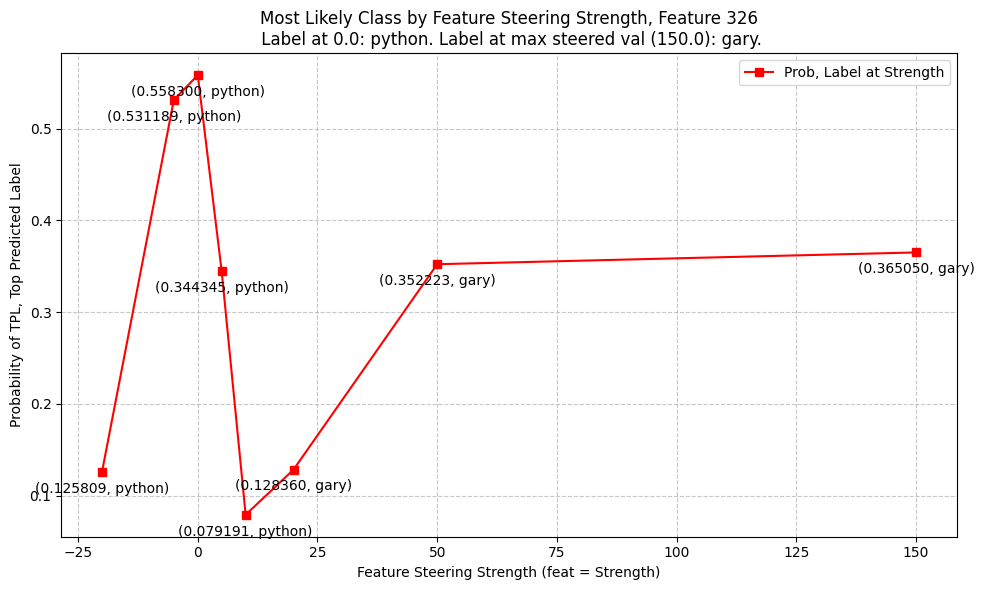

In [20]:
import matplotlib.pyplot as plt
import numpy as np

# Sample data
x = [tup[0] for tup in sorted(feat_num_concept_arr)]
y1 = [tup[1] for tup in sorted(feat_num_concept_arr)]
y2 = [tup[1] for tup in sorted(feat_num_prob_arr)]

# Create the plot
plt.figure(figsize=(10, 6))

# Plot each line with different colors and markers
plt.plot(np.array(x), y2, 'rs-', label='Prob, Label at Strength')  # Red line with squares

# Label each point
for i in range(len(x)):
    # Labels for series
    plt.annotate(f'({y2[i]:01f}, {y1[i]})', 
                (x[i], y2[i]), 
                textcoords="offset points", 
                xytext=(0,-15),
                ha='center')
    
# Customize the plot
plt.xlabel('Feature Steering Strength (feat = Strength)')
plt.ylabel('Probability of TPL, Top Predicted Label')
plt.title(f'Most Likely Class by Feature Steering Strength, Feature {feat_num}\n Label at 0.0: {steering_strength_image_results[str(0.0)][feat_num][image_idx][0][0]}. Label at max steered val ({str(max(steering_strengths))}): {steering_strength_image_results[str(max(steering_strengths))][feat_num][image_idx][0][0]}.')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)

# Adjust layout to prevent label overlap
plt.tight_layout()


# plt.savefig("test.svg")

# Show the plot
plt.show()

feat_num: 326


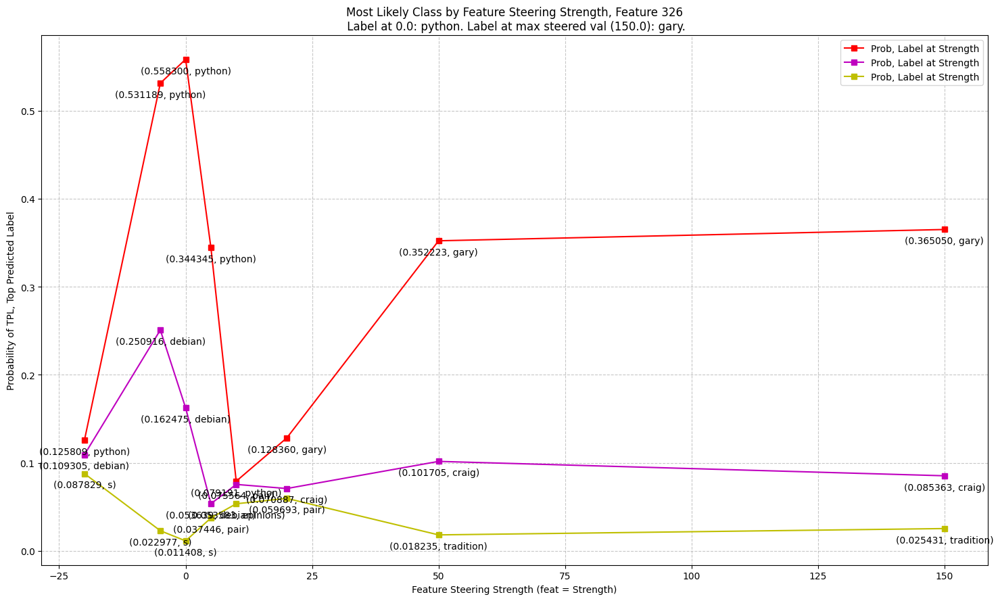

In [21]:
image_idx = image_idx
feat_num = feat_num

print(f"=====================\nfeat_num: {feat_num}")
feat_num_concept_arr = []
feat_num_concept_arr_2 = []
feat_num_concept_arr_3 = []
feat_num_prob_arr = []
feat_num_prob_arr_2 = []
feat_num_prob_arr_3 = []
for dict_key in steering_strengths:
    # steering_strength_image_results is: [steering_strength][feat_num][image_idx][0:concept name,1:concept_probability][i in 0-9 for img i in top-k]
    
    # concept names
    feat_num_concept_arr.append((dict_key, steering_strength_image_results[str(dict_key)][feat_num][image_idx][0][0]))
    feat_num_concept_arr_2.append((dict_key, steering_strength_image_results[str(dict_key)][feat_num][image_idx][0][1]))
    feat_num_concept_arr_3.append((dict_key, steering_strength_image_results[str(dict_key)][feat_num][image_idx][0][2]))

    # probabilities
    feat_num_prob_arr.append((dict_key, steering_strength_image_results[str(dict_key)][feat_num][image_idx][1][0].item()))
    feat_num_prob_arr_2.append((dict_key, steering_strength_image_results[str(dict_key)][feat_num][image_idx][1][1].item()))
    feat_num_prob_arr_3.append((dict_key, steering_strength_image_results[str(dict_key)][feat_num][image_idx][1][2].item()))


# Sample data
x = [tup[0] for tup in sorted(feat_num_concept_arr)]
y1 = [tup[1] for tup in sorted(feat_num_concept_arr)]
y2 = [tup[1] for tup in sorted(feat_num_prob_arr)]
y1_2 = [tup[1] for tup in sorted(feat_num_concept_arr_2)]
y2_2 = [tup[1] for tup in sorted(feat_num_prob_arr_2)]
y1_3 = [tup[1] for tup in sorted(feat_num_concept_arr_3)]
y2_3 = [tup[1] for tup in sorted(feat_num_prob_arr_3)]

# Create the plot
plt.figure(figsize=(15, 9))

# Plot each line with different colors and markers
plt.plot(np.array(x), y2, 'rs-', label='Prob, Label at Strength')  # Red line with squares
plt.plot(np.array(x), y2_2, 'ms-', label='Prob, Label at Strength')  # Red line with squares
plt.plot(np.array(x), y2_3, 'ys-', label='Prob, Label at Strength')  # Red line with squares

# Label each point
for i in range(len(x)):
    # Labels for series
    plt.annotate(f'({y2[i]:01f}, {y1[i]})', 
                (x[i], y2[i]), 
                textcoords="offset points", 
                xytext=(0,-15),
                ha='center')
    plt.annotate(f'({y2_2[i]:01f}, {y1_2[i]})', 
                (x[i], y2_2[i]), 
                textcoords="offset points", 
                xytext=(0,-15),
                ha='center')
    plt.annotate(f'({y2_3[i]:01f}, {y1_3[i]})', 
                (x[i], y2_3[i]), 
                textcoords="offset points", 
                xytext=(0,-15),
                ha='center')
    
# Customize the plot
plt.xlabel('Feature Steering Strength (feat = Strength)')
plt.ylabel('Probability of TPL, Top Predicted Label')
plt.title(f'Most Likely Class by Feature Steering Strength, Feature {feat_num}\n Label at 0.0: {steering_strength_image_results[str(0.0)][feat_num][image_idx][0][0]}. Label at max steered val ({str(max(steering_strengths))}): {steering_strength_image_results[str(max(steering_strengths))][feat_num][image_idx][0][0]}.')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)

# Adjust layout to prevent label overlap
plt.tight_layout()


# plt.savefig("test.svg")

# Show the plot
plt.show()

In [22]:
steering_strength_info.keys()

dict_keys([-20.0, -5.0, 0.0, 5.0, 10.0, 20.0, 50.0, 150.0])

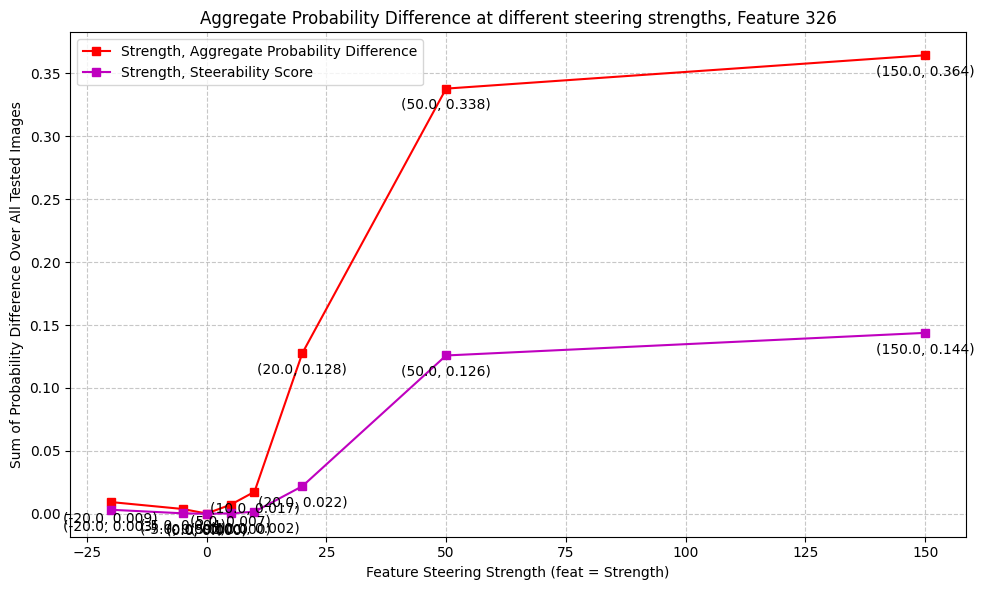

326
150.0 ['gary' 'craig' 'tradition' 'pat' 'dean' 'hundred' 'trembl' 'greg'
 'sporting' 'log']
150.0 probs tensor([0.3651, 0.0854, 0.0254, 0.0182, 0.0106, 0.0091, 0.0071, 0.0063, 0.0062,
        0.0059], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([1.3274e-01, 6.2842e-03, 8.4524e-04, 3.9452e-04, 1.2199e-04, 1.0844e-04,
        8.0499e-05, 4.7749e-05, 4.4050e-05, 3.5698e-05])
['gary' 'craig' 'tradition' 'pat' 'dean' 'hundred' 'trembl' 'sat'
 'sporting' 'hamilton']


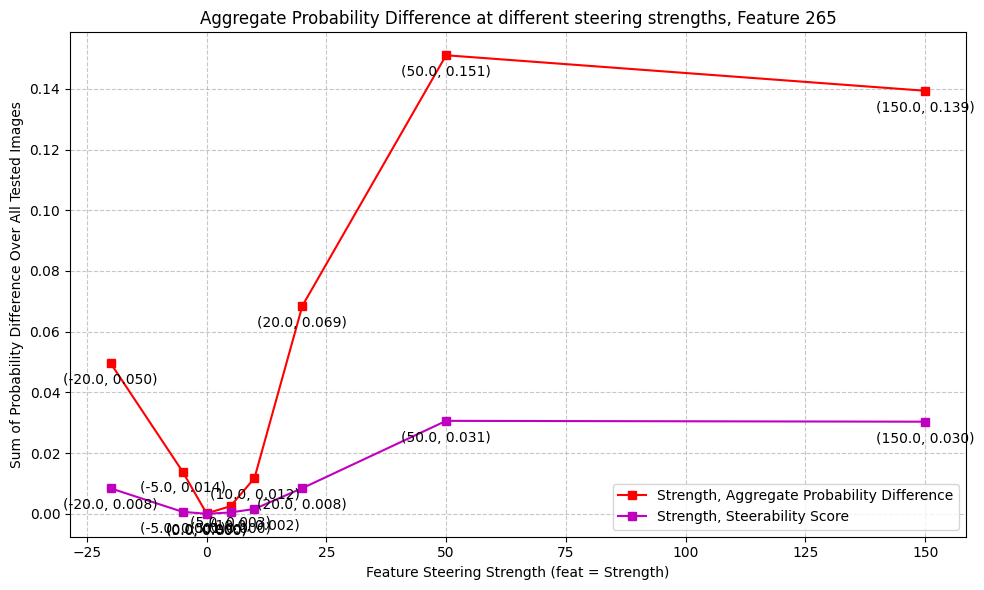

265
150.0 ['java' 'thumbnail' 'sitemap' 'bookmark' 'preview' 'patch' 'oh'
 'directory' 'it' 'named']
150.0 probs tensor([0.1683, 0.0551, 0.0378, 0.0203, 0.0176, 0.0149, 0.0147, 0.0145, 0.0140,
        0.0092], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([1.9419e-02, 4.2527e-03, 1.2714e-03, 4.1221e-04, 3.0801e-04, 2.8736e-04,
        2.5346e-04, 2.3905e-04, 2.1005e-04, 8.5819e-05])
['java' 'thumbnail' 'sitemap' 'bookmark' 'preview' 'it' 'oh' 'directory'
 'patch' 'banner']


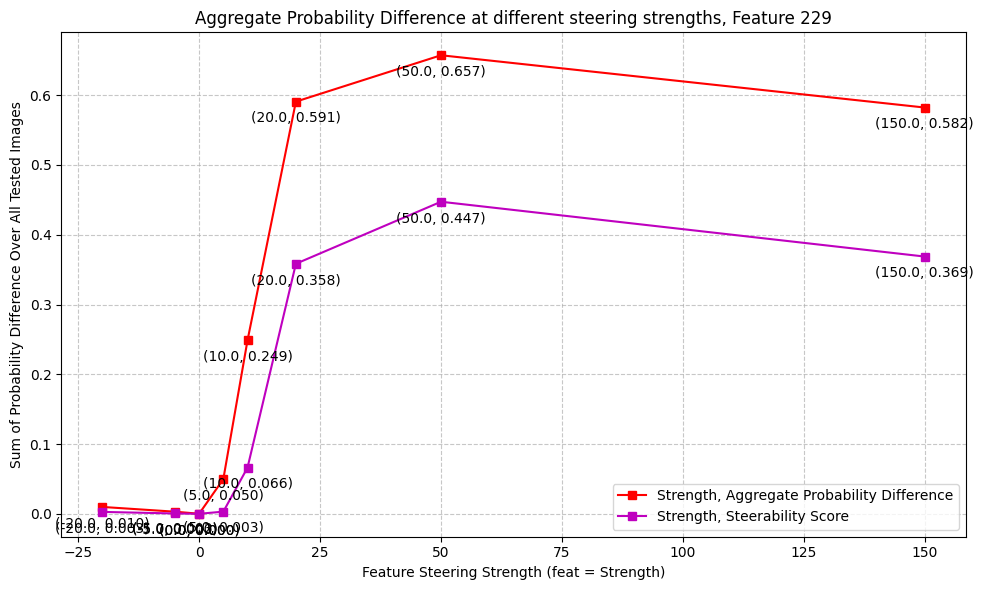

229
150.0 ['photo' 'cumshot' 'video' 'my' 'thumbnail' 'foto' 'mon' 'pic' 'ma'
 'front']
150.0 probs tensor([0.5794, 0.1409, 0.0841, 0.0356, 0.0228, 0.0200, 0.0128, 0.0058, 0.0045,
        0.0040], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([3.3911e-01, 1.6839e-02, 8.0412e-03, 1.0072e-03, 5.8186e-04, 3.5933e-04,
        1.4282e-04, 2.4637e-05, 1.7685e-05, 1.5076e-05])
['photo' 'cumshot' 'video' 'my' 'thumbnail' 'foto' 'mon' 'pic' 'ma' 'me']


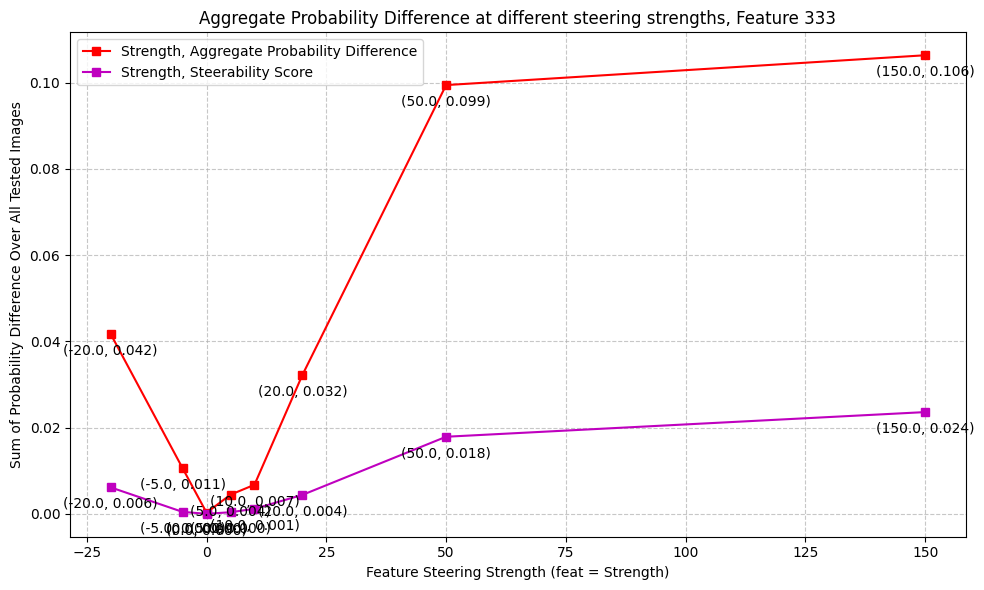

333
150.0 ['screen' 'lcd' 'printable' 'shown' 'front' 'lighting' 'rentals'
 'external' 'honda' 'deck']
150.0 probs tensor([0.0937, 0.0518, 0.0388, 0.0353, 0.0350, 0.0243, 0.0140, 0.0085, 0.0084,
        0.0077], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([1.1310e-02, 2.8667e-03, 1.6058e-03, 1.4177e-03, 1.3176e-03, 1.0397e-03,
        1.5790e-04, 7.4531e-05, 5.8410e-05, 5.5783e-05])
['screen' 'lcd' 'printable' 'shown' 'front' 'lighting' 'rentals' 'polish'
 'packaging' 'external']


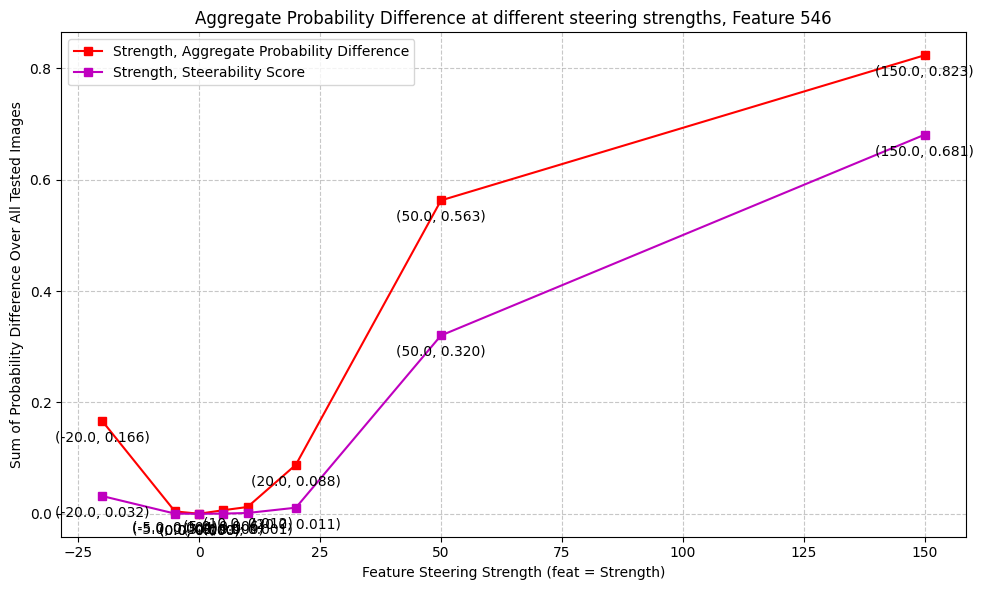

546
150.0 ['purple' 'table' 'tables' 'configuration' 'stars' 'pink' 'three'
 'console' 'swiss' 'cross']
150.0 probs tensor([0.8458, 0.0126, 0.0076, 0.0044, 0.0021, 0.0018, 0.0018, 0.0016, 0.0016,
        0.0015], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([6.7785e-01, 1.5172e-04, 5.5883e-05, 1.6879e-05, 7.2797e-06, 4.0671e-06,
        3.8901e-06, 3.7131e-06, 2.9363e-06, 2.6043e-06])
['purple' 'table' 'tables' 'configuration' 'pink' 'config' 'stars' 'swiss'
 'cross' 'console']


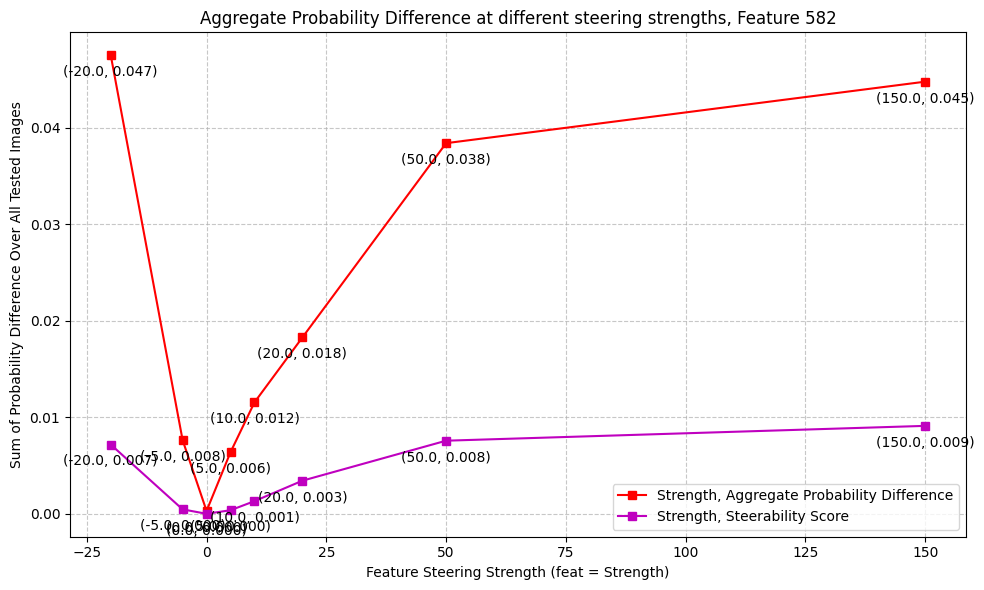

582
150.0 ['roberts' 'mesh' 'mens' 'fetish' 'boot' 'panasonic' 'manner' 'bestiality'
 'models' 'gets']
150.0 probs tensor([0.0431, 0.0383, 0.0259, 0.0169, 0.0137, 0.0135, 0.0132, 0.0127, 0.0123,
        0.0123], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0020, 0.0012, 0.0004, 0.0002, 0.0002, 0.0002, 0.0002, 0.0001, 0.0001,
        0.0001])
['roberts' 'mesh' 'mens' 'fetish' 'models' 'manner' 'panasonic'
 'bestiality' 'boot' 'segment']


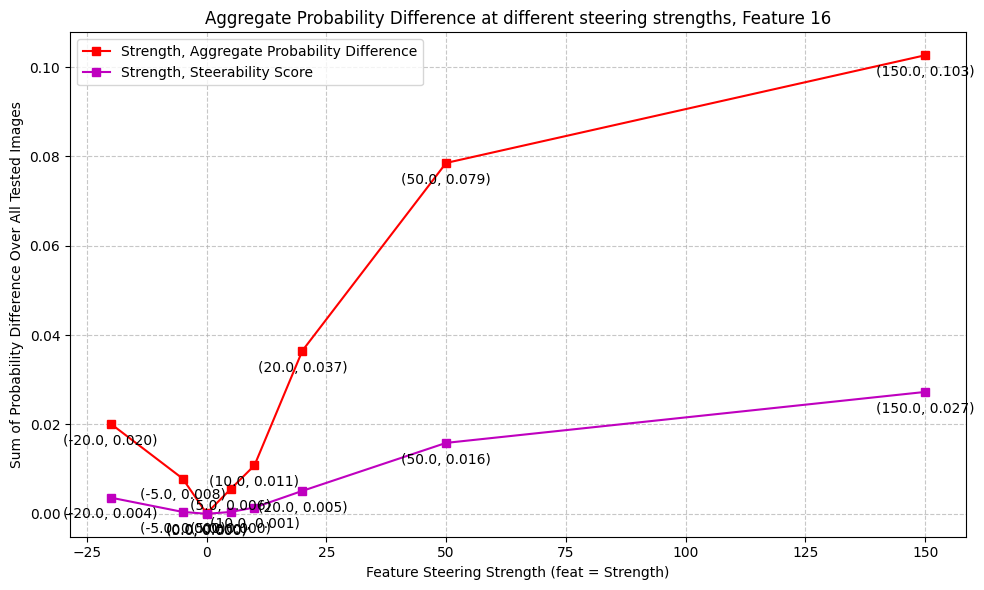

16
150.0 ['oct' 'purple' 'printable' 'suck' 'rack' 'ss' 'cds' 'qty' 'october'
 'obviously']
150.0 probs tensor([0.1007, 0.0976, 0.0447, 0.0343, 0.0269, 0.0241, 0.0179, 0.0138, 0.0120,
        0.0097], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([1.0537e-02, 7.5921e-03, 2.4623e-03, 1.2080e-03, 9.8576e-04, 4.2295e-04,
        2.2253e-04, 1.2598e-04, 1.1601e-04, 9.4020e-05])
['oct' 'purple' 'printable' 'suck' 'rack' 'ss' 'cds' 'october' 'qty'
 'square']


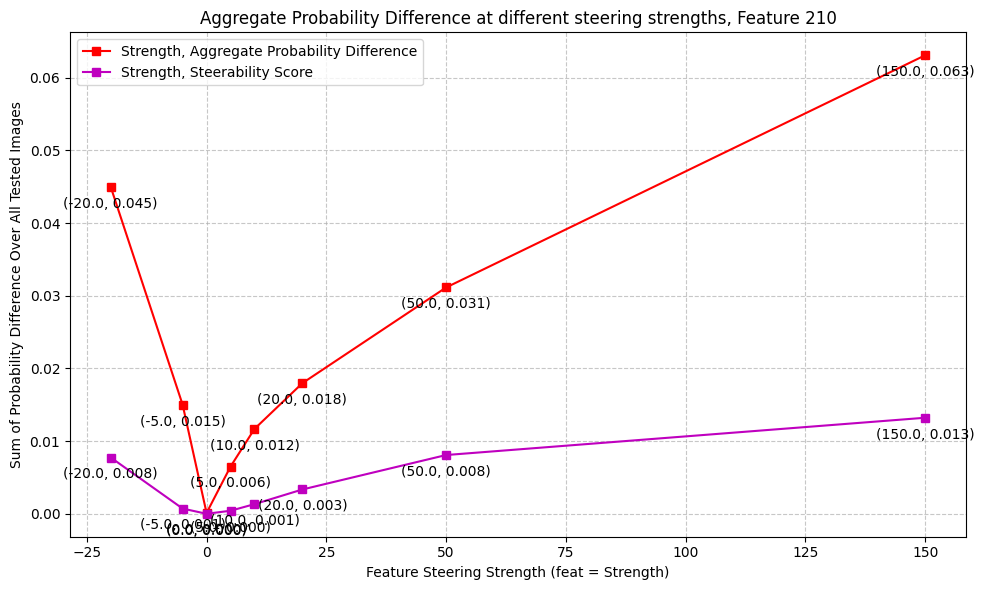

210
150.0 ['bags' 'gifts' 'contribution' 'instruments' 'plants' 'drugs' 'toys'
 'kits' 'parks' 'bonds']
150.0 probs tensor([0.0692, 0.0332, 0.0267, 0.0245, 0.0243, 0.0197, 0.0195, 0.0183, 0.0143,
        0.0142], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0040, 0.0013, 0.0008, 0.0006, 0.0006, 0.0004, 0.0003, 0.0003, 0.0002,
        0.0002])
['bags' 'gifts' 'contribution' 'plants' 'instruments' 'drugs' 'toys'
 'kits' 'crafts' 'parks']


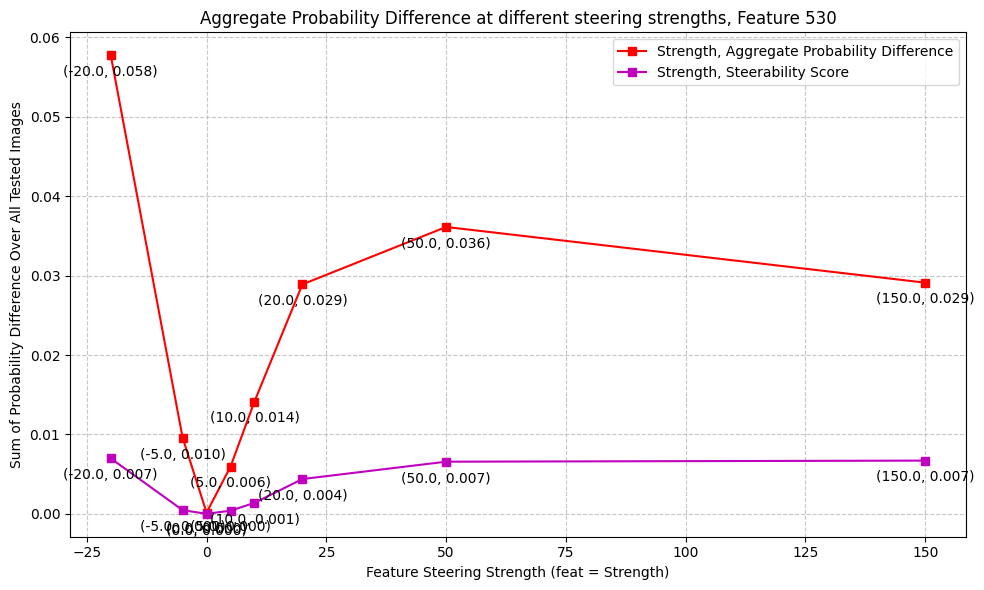

530
150.0 ['set' 'window' 'thermal' 'photo' 'cabinet' 'taiwan' 'aviation' 'windows'
 'chest' 'images']
150.0 probs tensor([0.0357, 0.0208, 0.0193, 0.0161, 0.0150, 0.0122, 0.0119, 0.0111, 0.0104,
        0.0102], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([8.4748e-04, 5.8386e-04, 2.7931e-04, 2.3334e-04, 1.8698e-04, 1.7323e-04,
        1.4861e-04, 1.4244e-04, 1.1398e-04, 9.7499e-05])
['set' 'window' 'thermal' 'cabinet' 'photo' 'windows' 'aircraft'
 'aviation' 'lcd' 'plane']


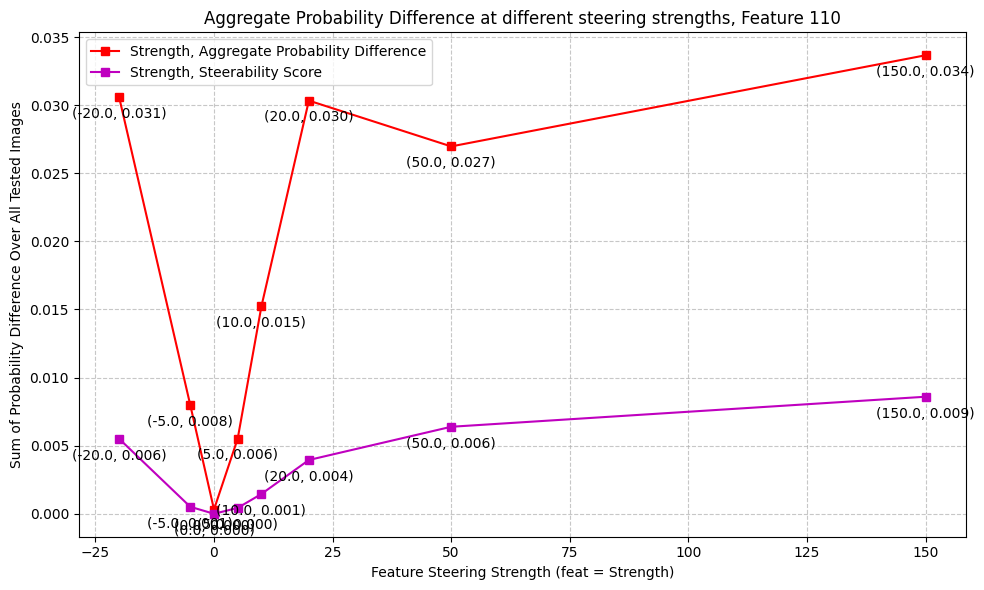

110
150.0 ['sitemap' 'wallpapers' 'ringtones' 'slightly' 'wallpaper' 'group' 'ebony'
 'rings' 'si' 'stream']
150.0 probs tensor([0.0361, 0.0279, 0.0277, 0.0198, 0.0181, 0.0180, 0.0177, 0.0149, 0.0107,
        0.0104], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([1.1331e-03, 9.9753e-04, 8.4614e-04, 4.6991e-04, 4.0896e-04, 3.2842e-04,
        3.1527e-04, 9.3474e-05, 9.2108e-05, 6.5878e-05])
['sitemap' 'wallpapers' 'ringtones' 'wallpaper' 'slightly' 'group' 'ebony'
 'specify' 'si' 'groups']


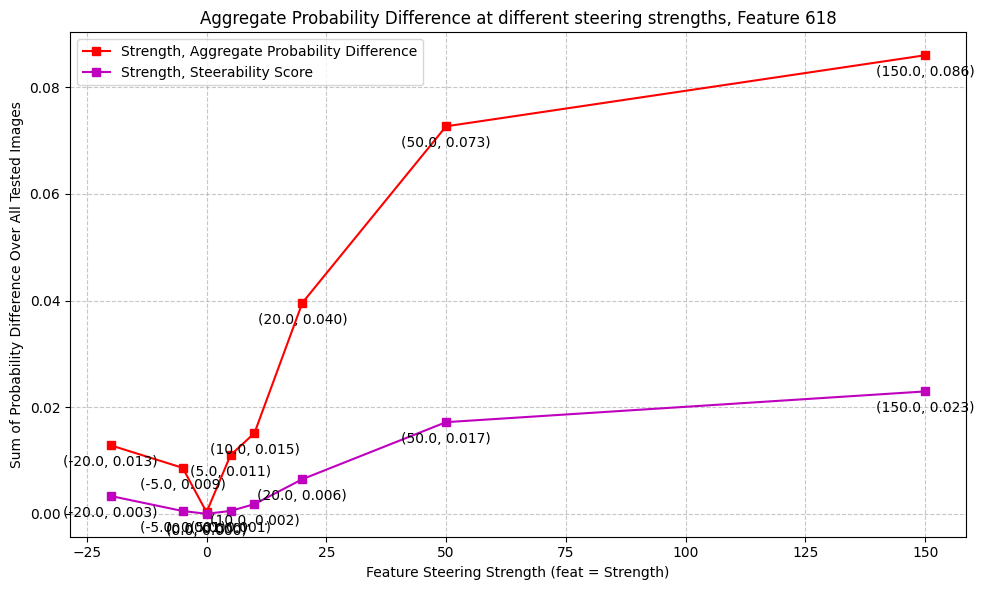

618
150.0 ['womens' 'comfortable' 'brown' 'green' 'classic' 'female' 'purple'
 'colour' 'environmental' 'navy']
150.0 probs tensor([0.0985, 0.0646, 0.0495, 0.0322, 0.0293, 0.0243, 0.0206, 0.0184, 0.0168,
        0.0134], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0074, 0.0053, 0.0025, 0.0016, 0.0011, 0.0004, 0.0004, 0.0003, 0.0002,
        0.0001])
['womens' 'comfortable' 'brown' 'green' 'classic' 'colour' 'female'
 'purple' 'environmental' 'wholesale']


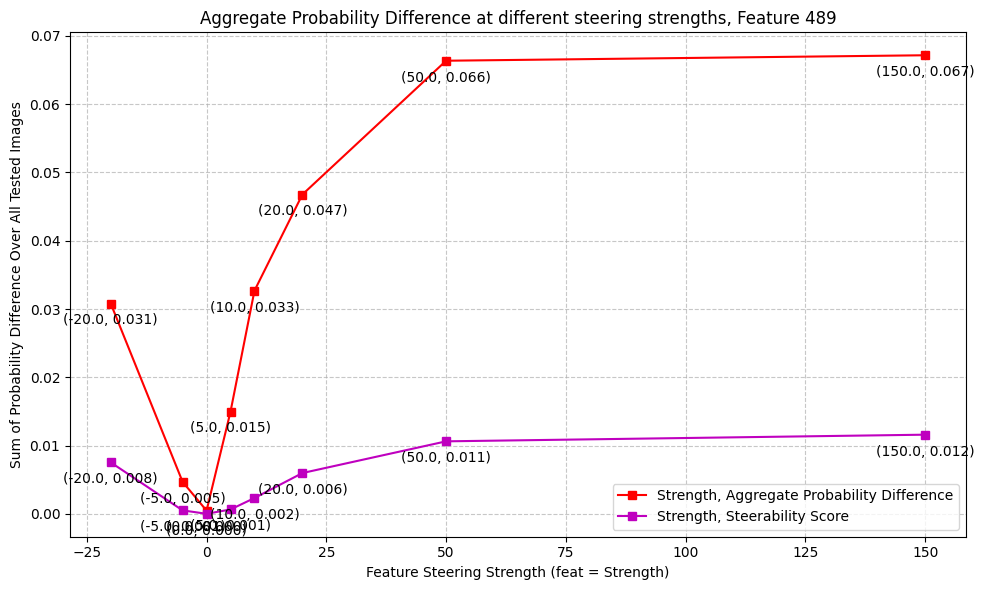

489
150.0 ['ph' 'hi' 'hd' 'wildlife' 'sd' 'http' 'pet' 'bb' 'ap' 'asp']
150.0 probs tensor([0.0648, 0.0390, 0.0206, 0.0204, 0.0161, 0.0154, 0.0134, 0.0119, 0.0106,
        0.0103], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([4.5119e-03, 1.8378e-03, 4.7119e-04, 2.2525e-04, 1.7117e-04, 1.4964e-04,
        1.2295e-04, 1.1266e-04, 6.7270e-05, 6.5110e-05])
['ph' 'hi' 'hd' 'sd' 'pet' 'ap' 'http' 'bb' 'wildlife' 'door']


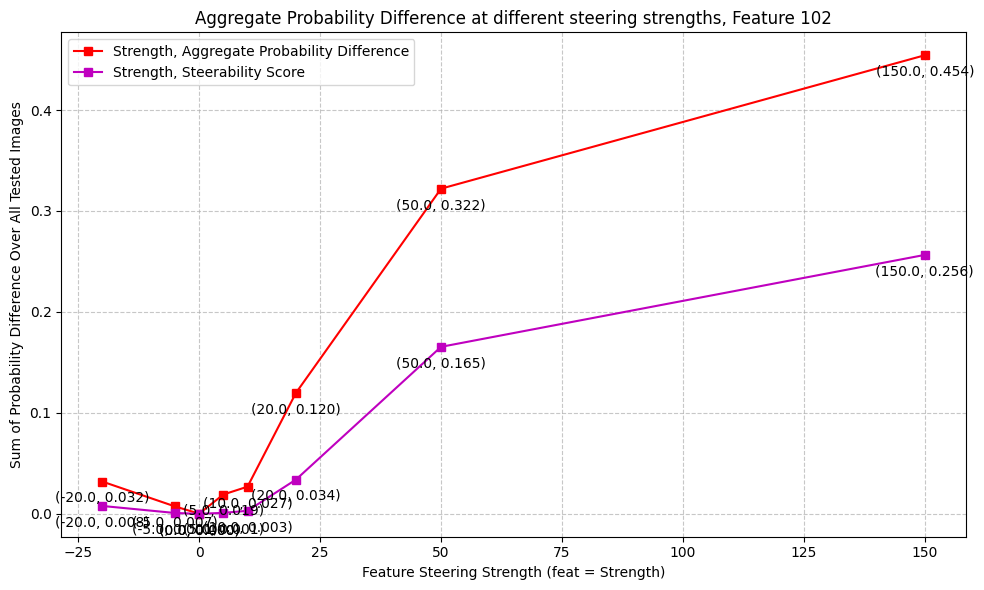

102
150.0 ['printable' 'label' 'button' 'logo' 'recipe' 'black' 'patch' 'recipes'
 'cover' 'named']
150.0 probs tensor([0.4490, 0.1731, 0.0844, 0.0733, 0.0272, 0.0265, 0.0222, 0.0220, 0.0059,
        0.0057], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([2.0634e-01, 3.3550e-02, 7.0018e-03, 4.7323e-03, 5.4927e-04, 5.4433e-04,
        5.0542e-04, 4.1275e-04, 3.6220e-05, 2.5208e-05])
['printable' 'label' 'button' 'logo' 'recipe' 'recipes' 'black' 'patch'
 'cover' 'icon']


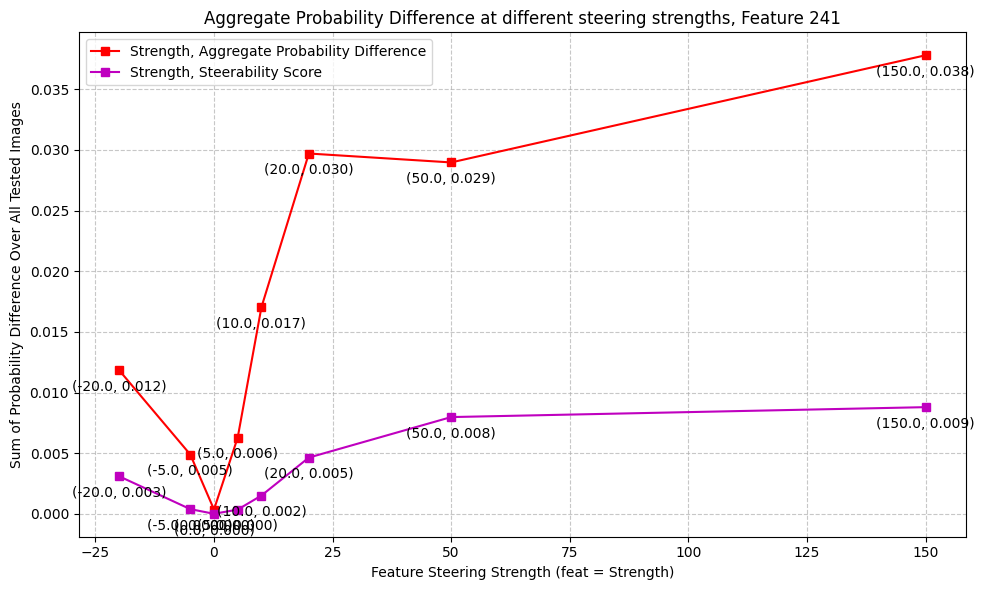

241
150.0 ['sealed' 'lcd' 'screen' 'scan' 'lisa' 'bond' 'sole' 'side'
 'corresponding' 'checks']
150.0 probs tensor([0.0345, 0.0342, 0.0243, 0.0230, 0.0219, 0.0216, 0.0175, 0.0171, 0.0136,
        0.0097], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([1.4286e-03, 8.5476e-04, 6.8984e-04, 6.8702e-04, 4.3685e-04, 3.0737e-04,
        2.9301e-04, 1.5615e-04, 1.2096e-04, 7.1462e-05])
['lcd' 'screen' 'sealed' 'lisa' 'scan' 'bond' 'side' 'corresponding'
 'sole' 'ad']


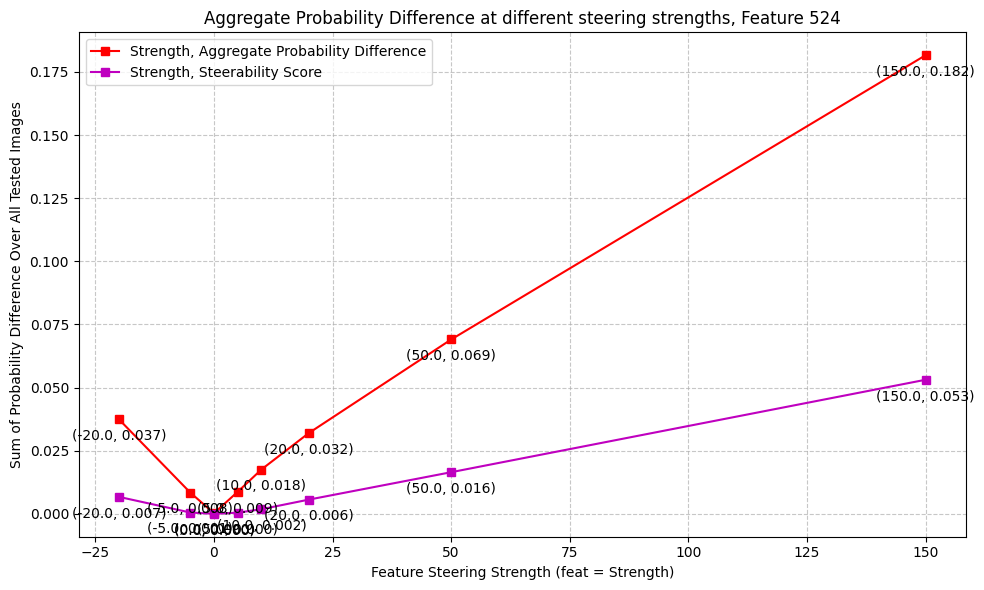

524
150.0 ['printable' 'catalogue' 'card' 'catalog' 'bookmark' 'cup' 'row'
 'certificate' 'oracle' 'newsletter']
150.0 probs tensor([0.1771, 0.0750, 0.0636, 0.0544, 0.0363, 0.0303, 0.0158, 0.0111, 0.0090,
        0.0086], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([3.2979e-02, 6.0625e-03, 4.4302e-03, 3.6039e-03, 1.1319e-03, 1.0756e-03,
        2.0260e-04, 1.1621e-04, 9.4198e-05, 8.5329e-05])
['printable' 'catalogue' 'card' 'catalog' 'bookmark' 'cup' 'row'
 'newsletter' 'certificate' 'pocket']


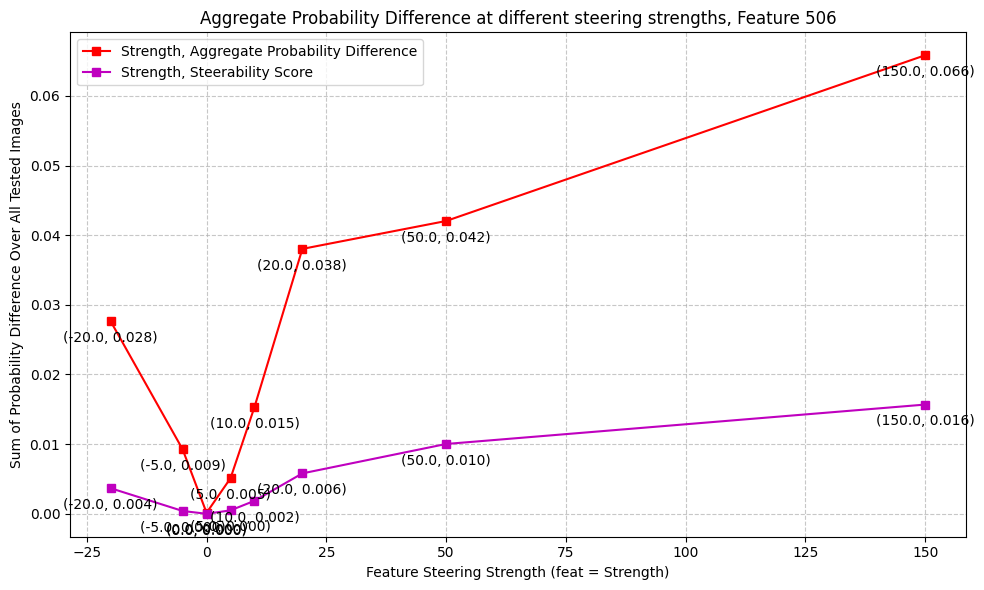

506
150.0 ['header' 'thumbnail' 'banner' 'size' 'laser' 'spanking' 'optical'
 'square' 'video' 'mens']
150.0 probs tensor([0.0595, 0.0573, 0.0381, 0.0246, 0.0244, 0.0183, 0.0126, 0.0093, 0.0092,
        0.0089], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([4.3334e-03, 3.8577e-03, 1.5589e-03, 7.6896e-04, 5.9582e-04, 4.6346e-04,
        1.6972e-04, 9.7337e-05, 9.4191e-05, 8.0490e-05])
['header' 'thumbnail' 'banner' 'laser' 'size' 'spanking' 'optical' 'video'
 'square' 'reducing']


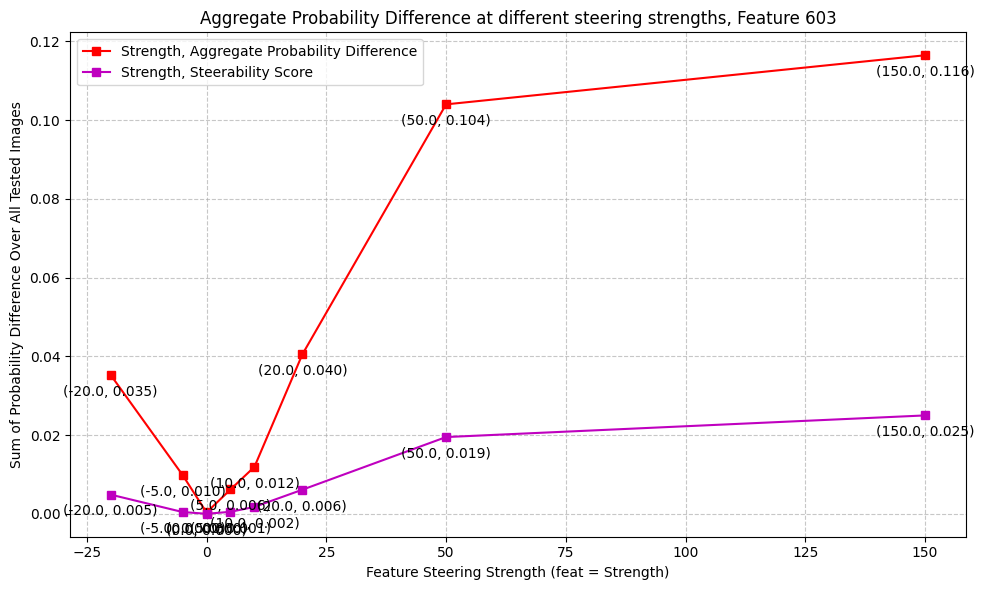

603
150.0 ['board' 'limousines' 'sheets' 'bedrooms' 'charges' 'camping' 'stupid'
 'womens' 'uniprotkb' 'yard']
150.0 probs tensor([0.1197, 0.0483, 0.0401, 0.0351, 0.0335, 0.0251, 0.0181, 0.0165, 0.0161,
        0.0141], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0136, 0.0029, 0.0013, 0.0009, 0.0007, 0.0006, 0.0005, 0.0004, 0.0002,
        0.0002])
['board' 'limousines' 'sheets' 'charges' 'bedrooms' 'camping' 'stupid'
 'uniprotkb' 'womens' 'background']


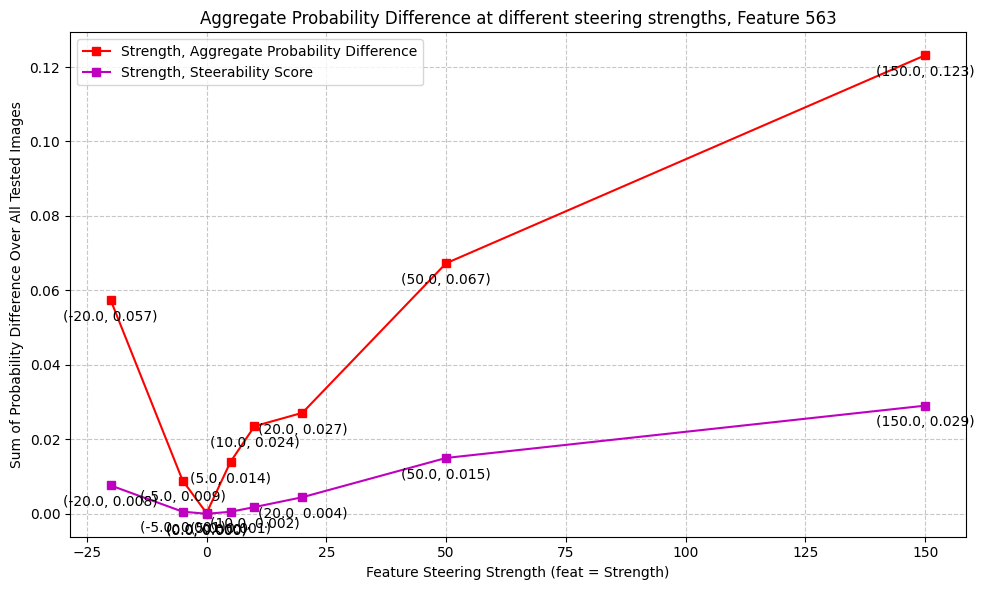

563
150.0 ['batteries' 'accessory' 'accessories' 'battery' 'louisiana' 'bulk'
 'amounts' 'milk' 'hand' 'listings']
150.0 probs tensor([0.1335, 0.0687, 0.0621, 0.0427, 0.0163, 0.0121, 0.0120, 0.0085, 0.0076,
        0.0074], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([1.5167e-02, 4.5711e-03, 3.4190e-03, 1.5665e-03, 1.8628e-04, 1.6309e-04,
        1.6223e-04, 1.5495e-04, 1.0104e-04, 8.0997e-05])
['batteries' 'accessory' 'accessories' 'battery' 'amounts' 'louisiana'
 'bulk' 'milk' 'pennsylvania' 'hand']


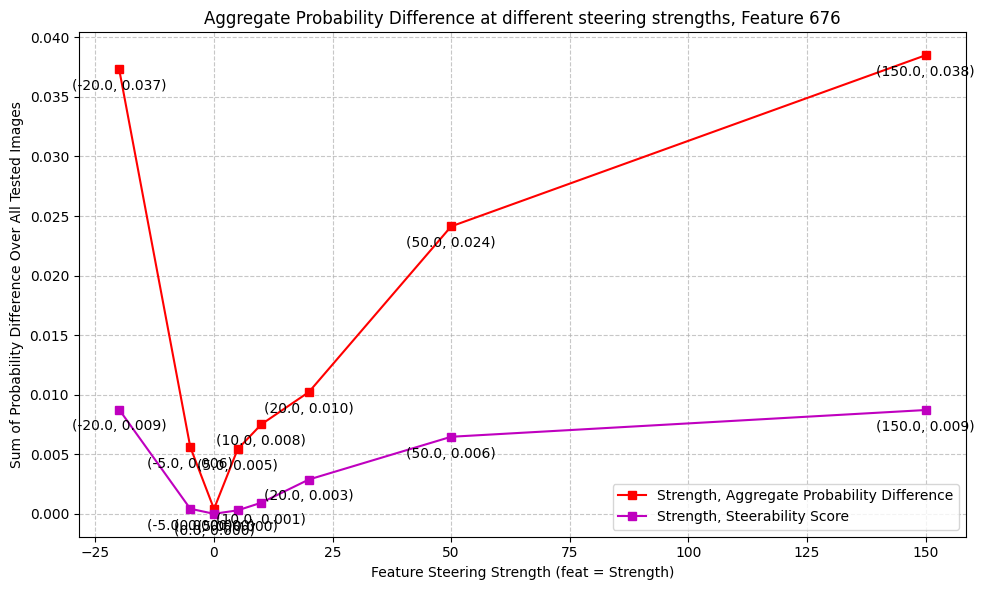

676
150.0 ['purple' 'thumbnail' 'want' 's' 'plain' 'wi' 'michigan' 'states' 'stated'
 'scripts']
150.0 probs tensor([0.0438, 0.0253, 0.0202, 0.0199, 0.0194, 0.0188, 0.0166, 0.0152, 0.0137,
        0.0108], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0015, 0.0009, 0.0007, 0.0005, 0.0004, 0.0002, 0.0002, 0.0002, 0.0001,
        0.0001])
['purple' 'thumbnail' 'wi' 'want' 'plain' 'states' 'stated' 'michigan'
 'gain' 's']


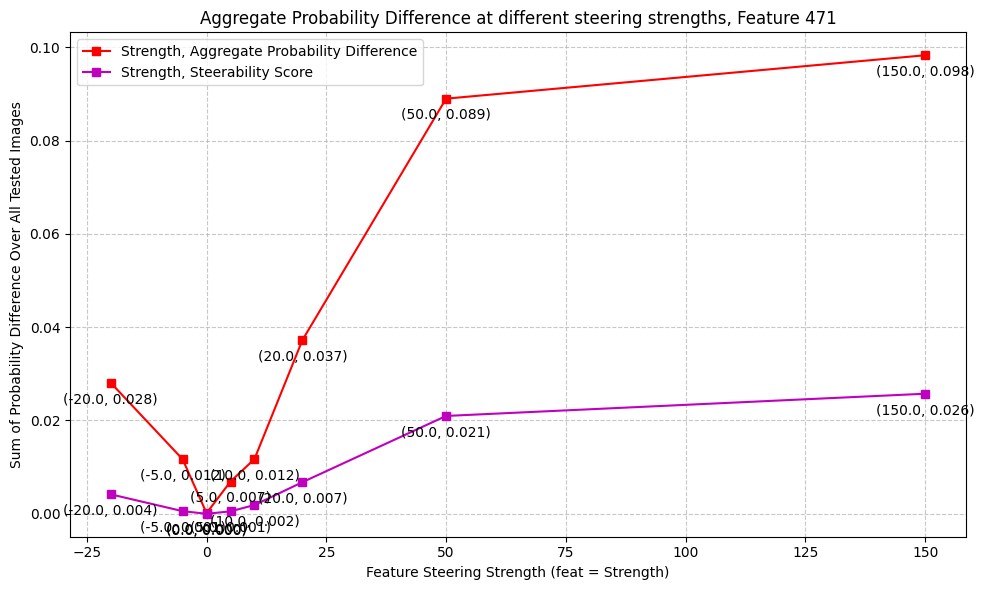

471
150.0 ['si' 'stands' 'cds' 'paperback' 'womens' 'sit' 'isbn' 'bags' 'dual' 'gb']
150.0 probs tensor([0.1089, 0.0889, 0.0468, 0.0332, 0.0308, 0.0282, 0.0220, 0.0192, 0.0117,
        0.0100], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([9.6593e-03, 6.6718e-03, 1.5260e-03, 1.1936e-03, 1.1841e-03, 7.6807e-04,
        6.4454e-04, 2.9944e-04, 1.2112e-04, 8.6379e-05])
['si' 'stands' 'cds' 'paperback' 'sit' 'womens' 'isbn' 'bags' 'dual' 'vi']


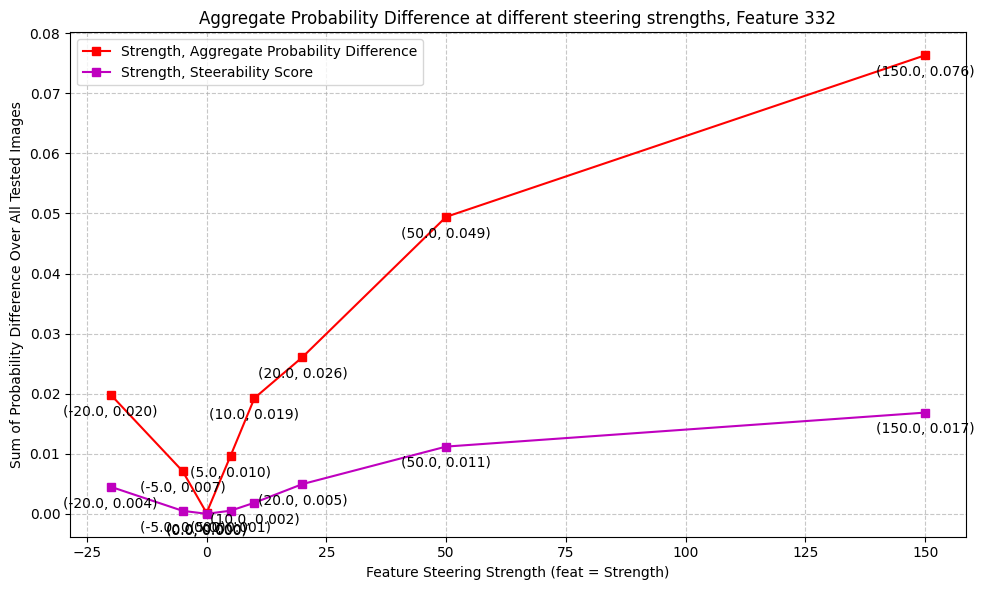

332
150.0 ['front' 'want' 'watches' 'jewelry' 'lcd' 'shown' 'oh' 'womens' 'cookies'
 'classification']
150.0 probs tensor([0.0705, 0.0408, 0.0338, 0.0325, 0.0283, 0.0253, 0.0236, 0.0200, 0.0181,
        0.0160], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0058, 0.0021, 0.0009, 0.0008, 0.0006, 0.0006, 0.0005, 0.0004, 0.0003,
        0.0002])
['front' 'want' 'lcd' 'shown' 'oh' 'watches' 'jewelry' 'pick' 'womens'
 'for']


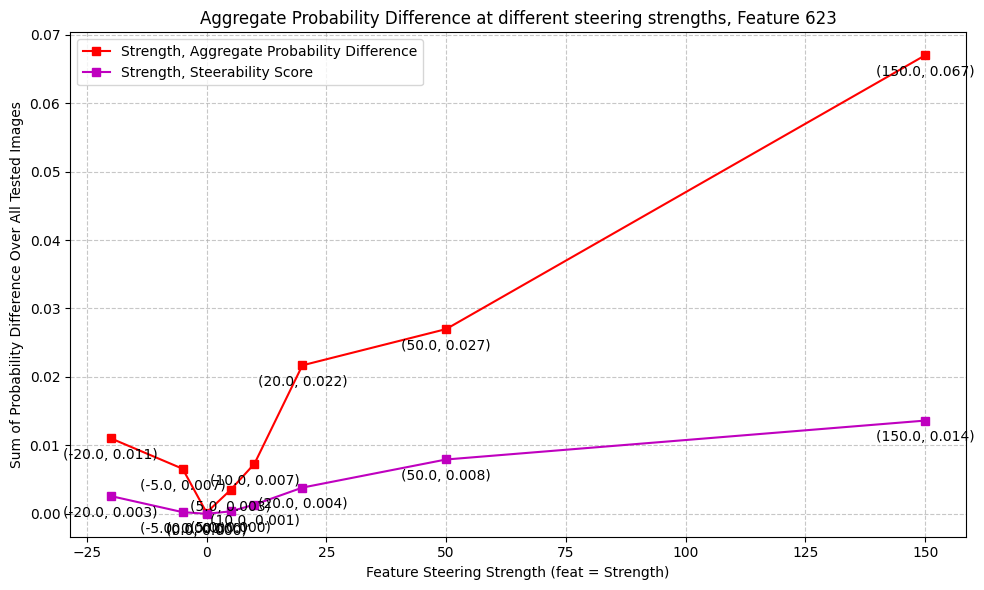

623
150.0 ['printable' 'ad' 'simpson' 'jean' 'ads' 'dean' 'card' 'cast' 'purple'
 'ea']
150.0 probs tensor([0.0630, 0.0293, 0.0284, 0.0263, 0.0249, 0.0239, 0.0197, 0.0192, 0.0179,
        0.0164], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0045, 0.0010, 0.0007, 0.0006, 0.0004, 0.0004, 0.0004, 0.0003, 0.0003,
        0.0003])
['printable' 'simpson' 'ad' 'dean' 'card' 'jean' 'ads' 'homepage' 'cast'
 'ea']


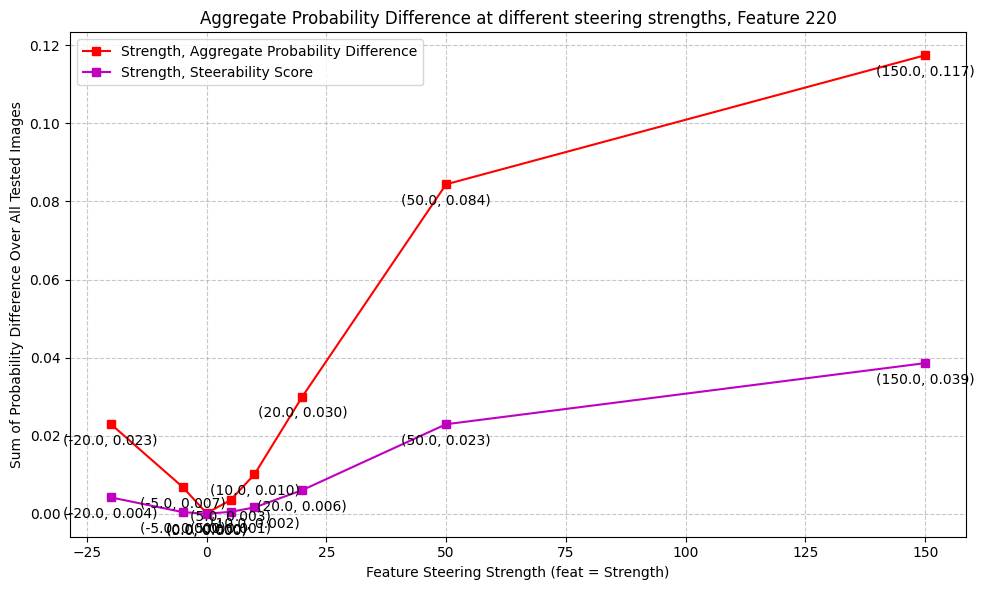

220
150.0 ['grey' 'gray' 'oct' 'stamps' 'poll' 'bit' 'stainless' 'extensive'
 'extremely' 'silver']
150.0 probs tensor([0.1368, 0.1266, 0.0507, 0.0371, 0.0343, 0.0298, 0.0261, 0.0190, 0.0173,
        0.0143], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0138, 0.0129, 0.0029, 0.0016, 0.0014, 0.0009, 0.0007, 0.0003, 0.0003,
        0.0002])
['gray' 'grey' 'oct' 'poll' 'stamps' 'bit' 'stainless' 'extensive'
 'extremely' 'silver']


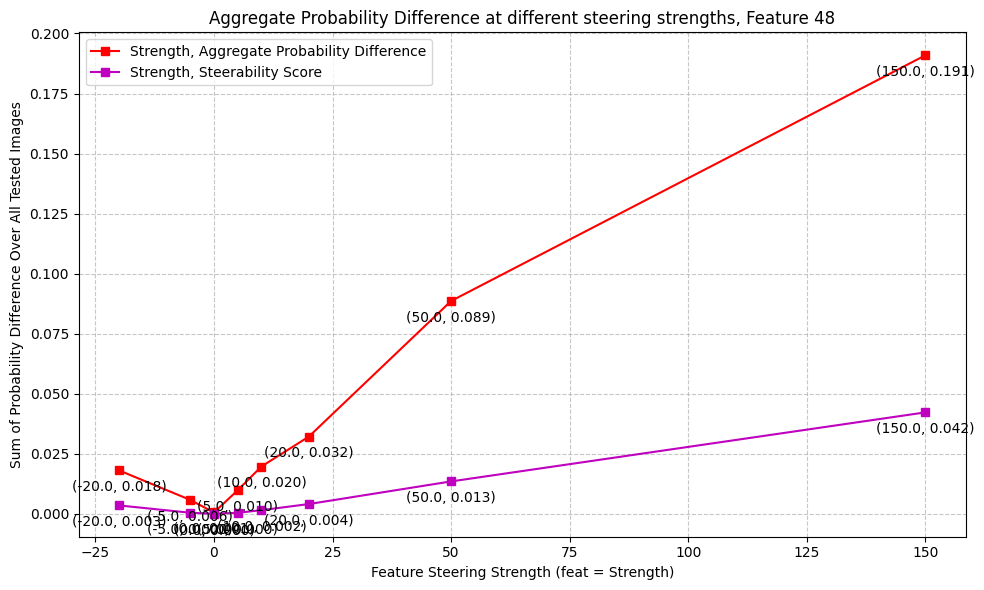

48
150.0 ['icon' 'thongs' 'w' 'clip' 'item' 'xxx' 'en' 'ten' 'menu' 'mesh']
150.0 probs tensor([0.1418, 0.0446, 0.0197, 0.0185, 0.0178, 0.0154, 0.0152, 0.0151, 0.0123,
        0.0104], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([3.6455e-02, 4.2532e-04, 4.1279e-04, 3.1208e-04, 2.7671e-04, 2.6281e-04,
        1.7185e-04, 1.2287e-04, 1.0087e-04, 8.2906e-05])
['icon' 'thongs' 'w' 'clip' 'item' 'en' 'ten' 'menu' 'xxx' 'mesh']


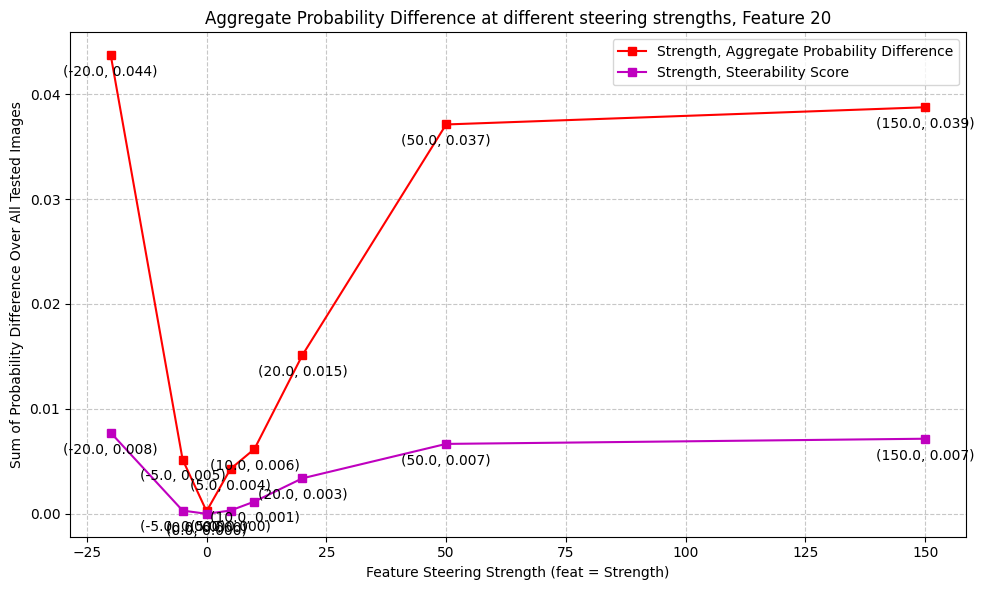

20
150.0 ['layer' 'dry' 'grey' 'blue' 'gray' 'opened' 'vary' 'least' 'connecticut'
 'nj']
150.0 probs tensor([0.0452, 0.0242, 0.0154, 0.0141, 0.0137, 0.0131, 0.0129, 0.0117, 0.0106,
        0.0102], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0015, 0.0004, 0.0002, 0.0002, 0.0001, 0.0001, 0.0001, 0.0001, 0.0001,
        0.0001])
['layer' 'dry' 'vary' 'wisconsin' 'gray' 'grey' 'connecticut' 'least'
 'blue' 'opened']


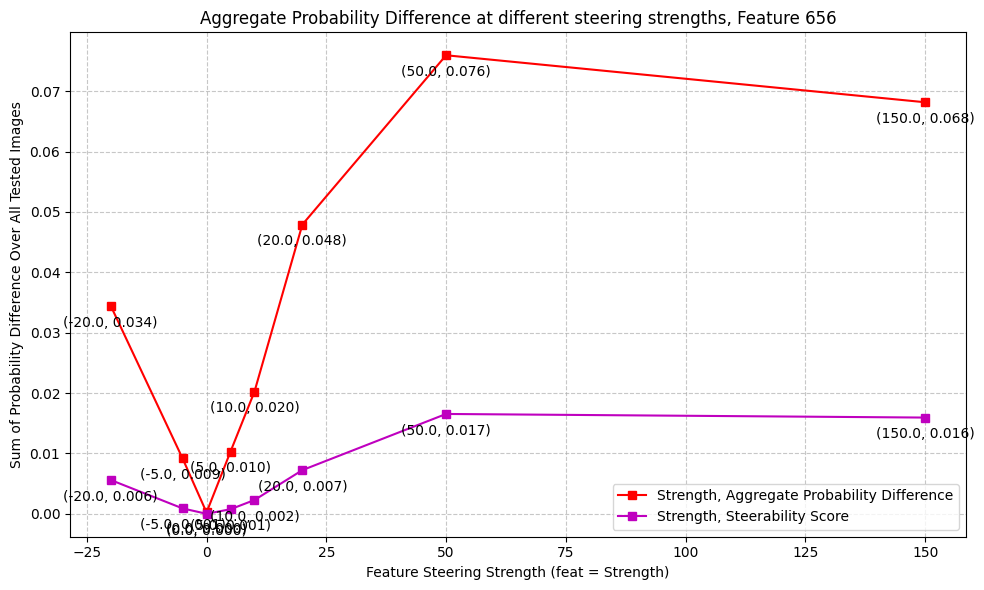

656
150.0 ['completed' 'pci' 'corresponding' 'numbers' 'puzzle' 'golf' 'simpson'
 'polish' 'poll' 'calculator']
150.0 probs tensor([0.0728, 0.0674, 0.0306, 0.0217, 0.0216, 0.0198, 0.0181, 0.0178, 0.0147,
        0.0146], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0046, 0.0038, 0.0008, 0.0005, 0.0004, 0.0004, 0.0004, 0.0003, 0.0002,
        0.0002])
['pci' 'completed' 'corresponding' 'polish' 'simpson' 'golf' 'puzzle'
 'poll' 'calculator' 'numbers']


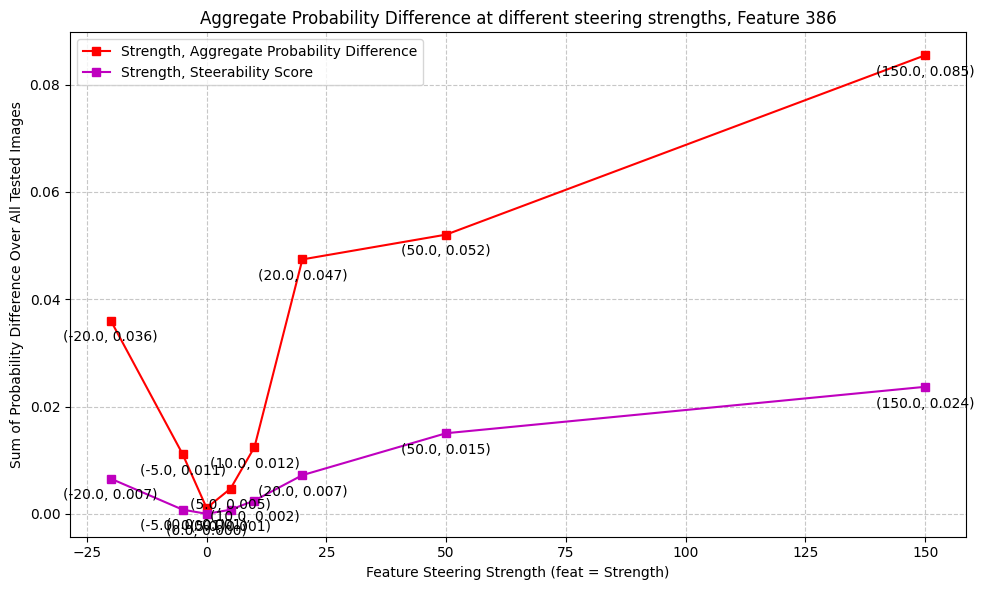

386
150.0 ['quotes' 'poster' 'posters' 'disney' 'sign' 'front' 'gardens' 'me'
 'shirts' 'oh']
150.0 probs tensor([0.0867, 0.0578, 0.0433, 0.0400, 0.0388, 0.0314, 0.0282, 0.0279, 0.0275,
        0.0214], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0073, 0.0028, 0.0016, 0.0013, 0.0011, 0.0010, 0.0008, 0.0008, 0.0007,
        0.0007])
['quotes' 'poster' 'posters' 'disney' 'front' 'me' 'sign' 'shirts' 'pink'
 'gardens']


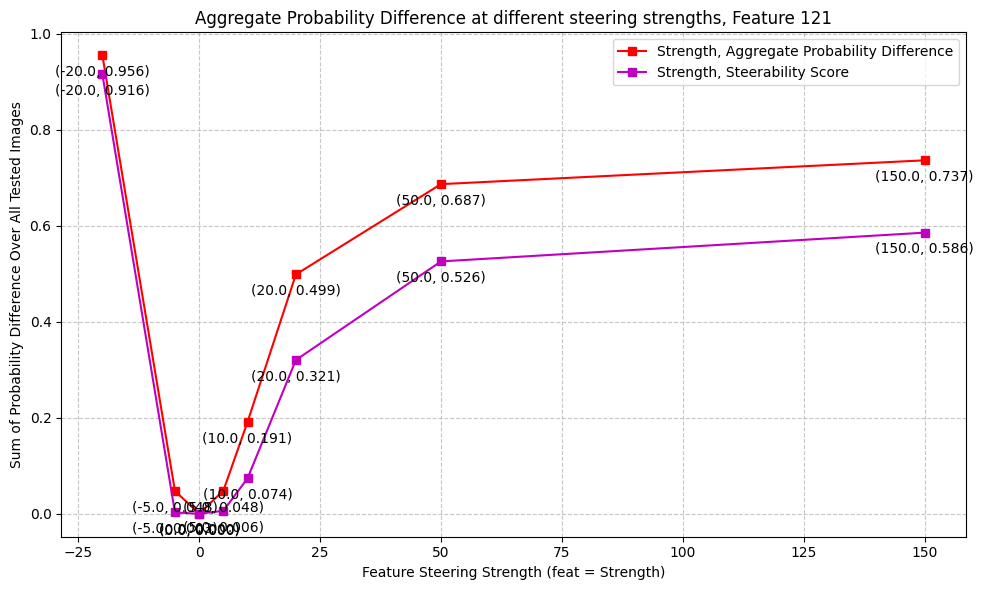

121
150.0 ['yellow' 'gold' 'orange' 'brown' 'golden' 'brass' 'copper' 'antique'
 'red' 'vintage']
150.0 probs tensor([7.3731e-01, 2.0474e-01, 4.1596e-02, 9.1374e-03, 5.0462e-03, 6.5165e-04,
        4.3071e-04, 3.5988e-04, 9.7619e-05, 7.7223e-05], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([ 5.4275e-01,  3.8196e-02,  2.3648e-03,  7.0729e-05,  2.9645e-08,
         9.1963e-09, -5.6347e-14, -7.1403e-14, -3.6970e-13, -3.7979e-13])
['yellow' 'gold' 'orange' 'brown' 'antique' 'brass' 'quotes' 'countries'
 'logos' 'pubmed']


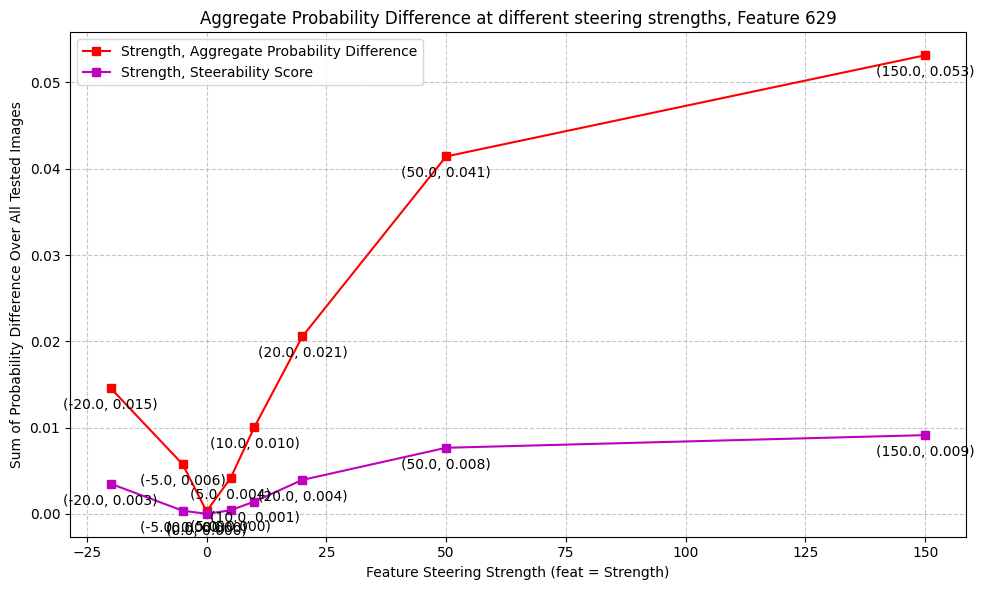

629
150.0 ['representative' 'und' 'kits' 'pet' 'centers' 'institutional' 'wyoming'
 'cooling' 'white' 'pets']
150.0 probs tensor([0.0374, 0.0225, 0.0175, 0.0152, 0.0134, 0.0124, 0.0115, 0.0113, 0.0113,
        0.0109], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0028, 0.0006, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0001, 0.0001,
        0.0001])
['representative' 'und' 'kits' 'institutional' 'pet' 'incorporated'
 'centers' 'cooling' 'white' 'thumbnail']


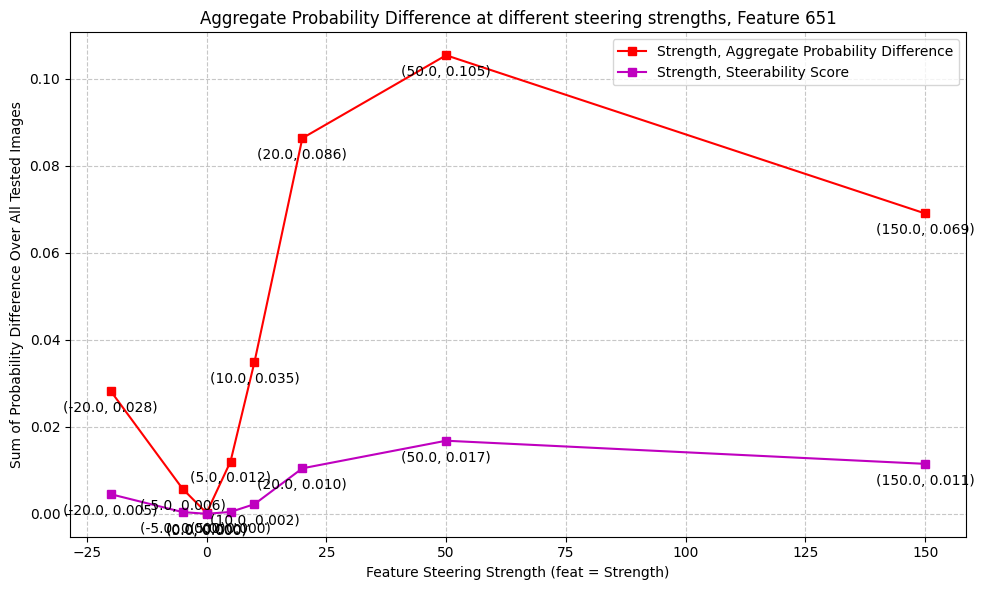

651
150.0 ['stick' 'stock' 'percentage' 'trees' 'posts' 'counter' 'pick' 'vs'
 'pocket' 'pull']
150.0 probs tensor([0.0666, 0.0322, 0.0218, 0.0175, 0.0145, 0.0144, 0.0143, 0.0129, 0.0124,
        0.0112], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0048, 0.0009, 0.0006, 0.0004, 0.0003, 0.0003, 0.0002, 0.0002, 0.0001,
        0.0001])
['stick' 'stock' 'trees' 'pick' 'pocket' 'percentage' 'pull' 'posts'
 'counter' 'vs']


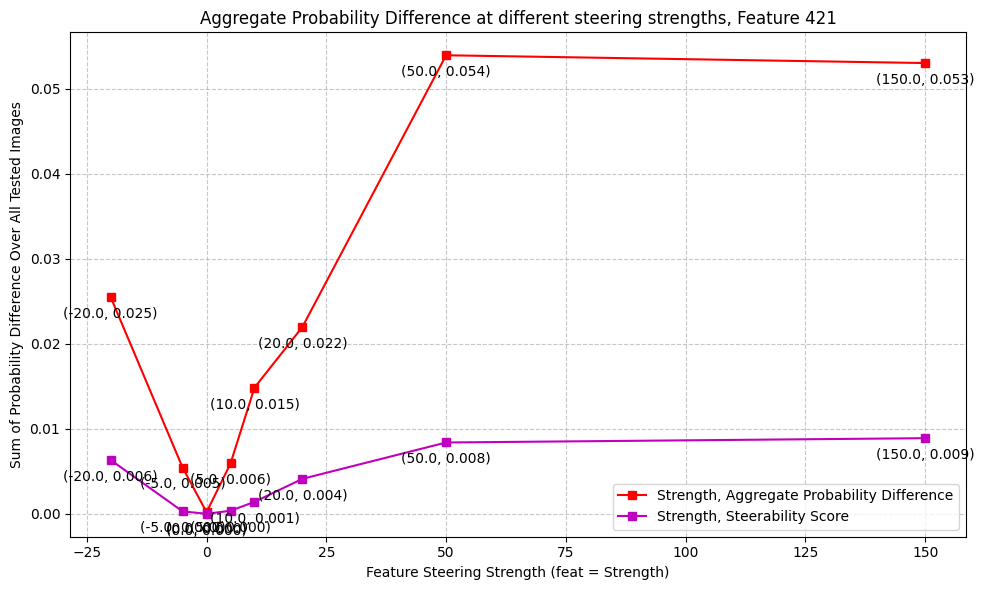

421
150.0 ['arm' 'stainless' 'hearing' 'payment' 'agreement' 'euro' 'ericsson'
 'stream' 'address' 'silver']
150.0 probs tensor([0.0524, 0.0248, 0.0205, 0.0181, 0.0149, 0.0136, 0.0131, 0.0113, 0.0109,
        0.0104], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([2.8123e-03, 5.9787e-04, 4.7425e-04, 2.5003e-04, 1.7082e-04, 1.5889e-04,
        1.3105e-04, 1.1270e-04, 1.0982e-04, 9.4374e-05])
['arm' 'stainless' 'hearing' 'ericsson' 'payment' 'agreement' 'address'
 'treatment' 'instrument' 'manager']


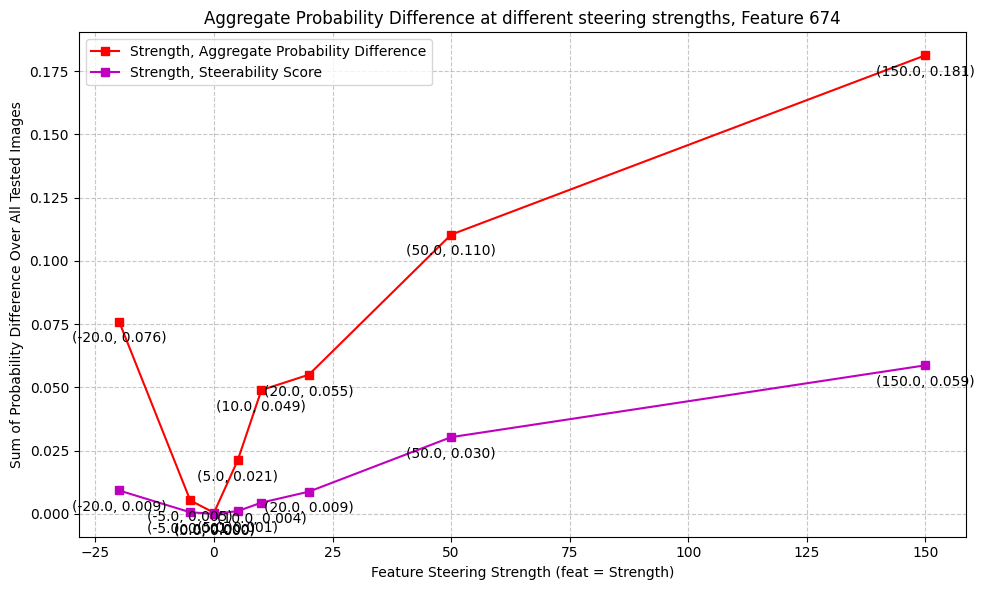

674
150.0 ['mens' 'plates' 'plate' 'laptops' 'drivers' 'monitors' 'employees'
 'audience' 'participants' 'guides']
150.0 probs tensor([0.2077, 0.0852, 0.0782, 0.0525, 0.0378, 0.0242, 0.0240, 0.0206, 0.0201,
        0.0195], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0329, 0.0076, 0.0068, 0.0031, 0.0019, 0.0008, 0.0007, 0.0006, 0.0005,
        0.0004])
['mens' 'plates' 'plate' 'laptops' 'drivers' 'audience' 'employees'
 'monitors' 'guides' 'participants']


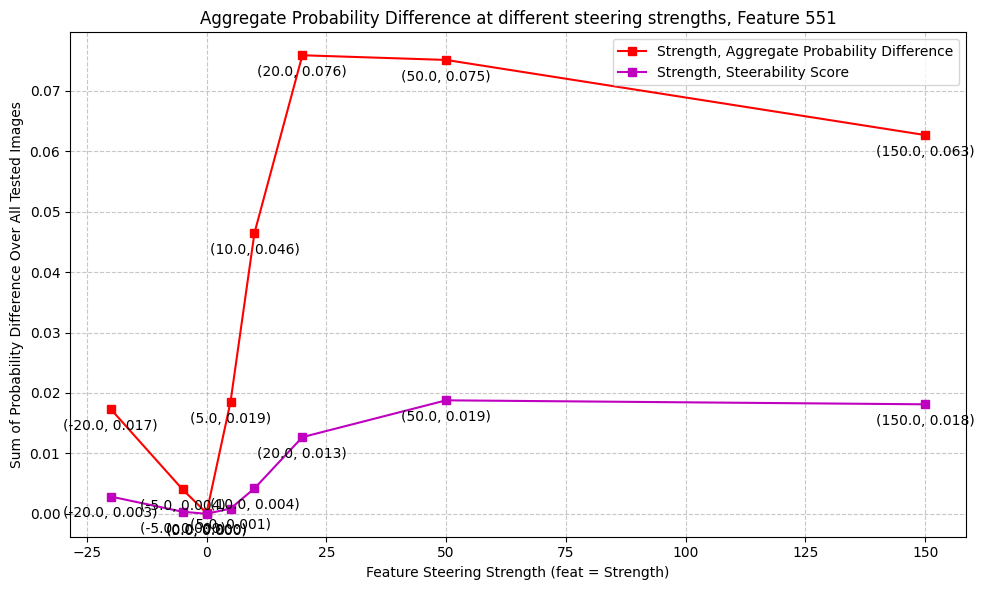

551
150.0 ['stewart' 'ri' 'shown' 'rear' 'male' 'holder' 'short' 'mens' 'pair'
 'sign']
150.0 probs tensor([0.0737, 0.0592, 0.0479, 0.0433, 0.0314, 0.0249, 0.0241, 0.0226, 0.0198,
        0.0176], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0039, 0.0035, 0.0031, 0.0014, 0.0011, 0.0005, 0.0004, 0.0003, 0.0002,
        0.0001])
['stewart' 'ri' 'shown' 'rear' 'holder' 'short' 'mens' 'male' 'sign'
 'navy']


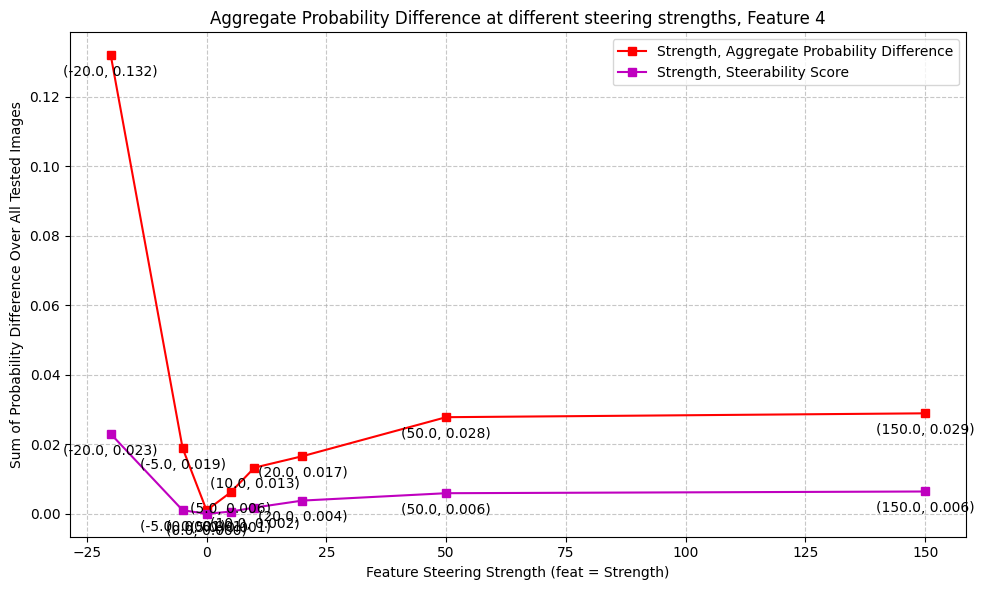

4
150.0 ['wow' 'back' 'family' 'old' 'bold' 'tion' 'from' 'slot' 'video' 'got']
150.0 probs tensor([0.0249, 0.0163, 0.0147, 0.0136, 0.0131, 0.0127, 0.0116, 0.0104, 0.0103,
        0.0101], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0008, 0.0003, 0.0002, 0.0002, 0.0002, 0.0001, 0.0001, 0.0001, 0.0001,
        0.0001])
['wow' 'back' 'tion' 'family' 'from' 'video' 'bold' 'old' 'shown' 'you']


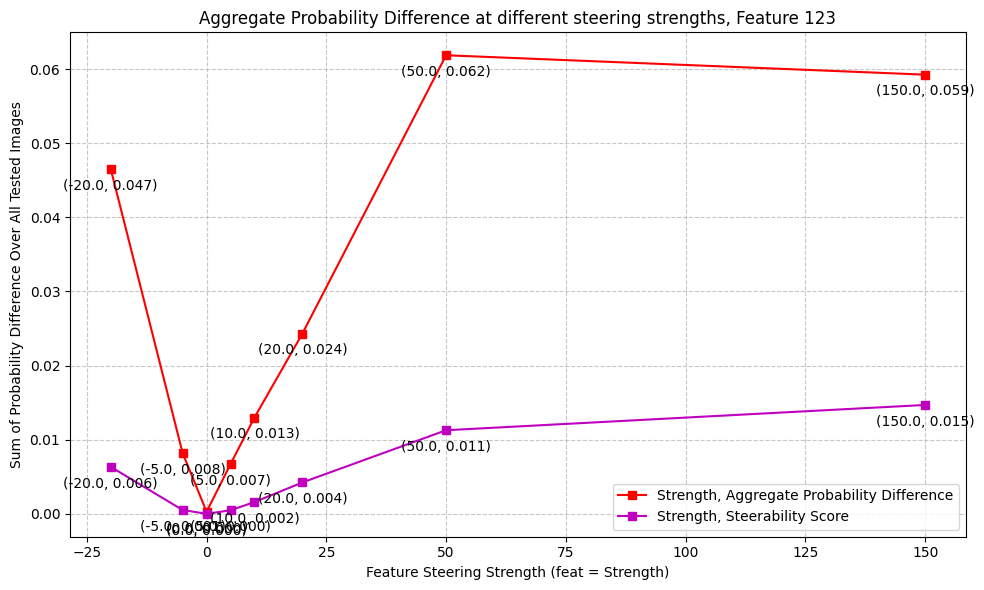

123
150.0 ['extension' 'testimonials' 'laptops' 'monitors' 'pst' 'front' 'lg' 'cap'
 'gps' 'book']
150.0 probs tensor([0.0597, 0.0502, 0.0335, 0.0245, 0.0234, 0.0208, 0.0189, 0.0161, 0.0153,
        0.0151], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0035, 0.0031, 0.0010, 0.0005, 0.0005, 0.0005, 0.0003, 0.0003, 0.0002,
        0.0002])
['extension' 'testimonials' 'laptops' 'pst' 'monitors' 'front' 'cap' 'lg'
 'gps' 'book']


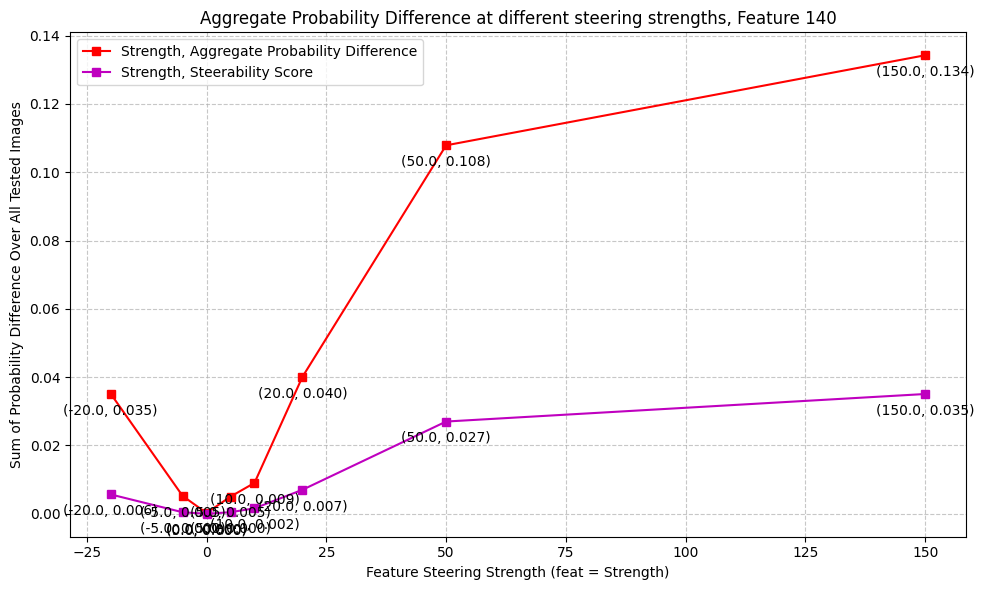

140
150.0 ['l' 'lo' 'u' 'lbs' 'b' 'd' 'historic' 'o' 'oh' 'ha']
150.0 probs tensor([0.1365, 0.0975, 0.0291, 0.0230, 0.0189, 0.0164, 0.0154, 0.0146, 0.0128,
        0.0119], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0180, 0.0103, 0.0006, 0.0005, 0.0004, 0.0002, 0.0002, 0.0002, 0.0002,
        0.0002])
['l' 'lo' 'u' 'lbs' 'historic' 'b' 'ha' 'oh' 'il' 'd']


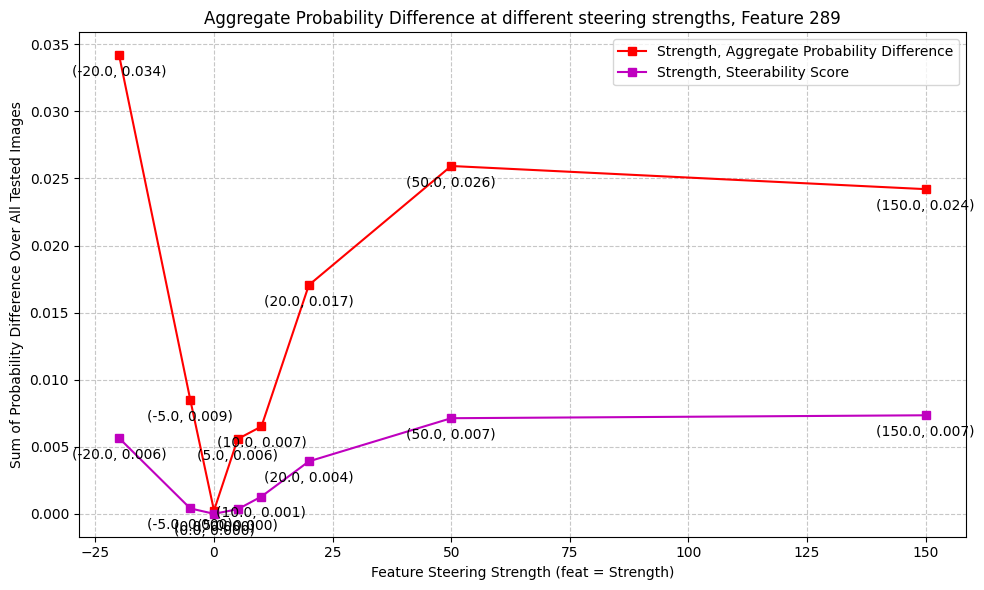

289
150.0 ['rings' 'bondage' 'misc' 'marshall' 'nice' 'wide' 'dodge' 'wire' 'ring'
 'linked']
150.0 probs tensor([0.0273, 0.0248, 0.0228, 0.0192, 0.0192, 0.0185, 0.0177, 0.0160, 0.0118,
        0.0104], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0006, 0.0005, 0.0005, 0.0003, 0.0003, 0.0002, 0.0002, 0.0002, 0.0002,
        0.0002])
['marshall' 'misc' 'bondage' 'nice' 'wide' 'dodge' 'rings' 'thousand'
 'massive' 'wire']


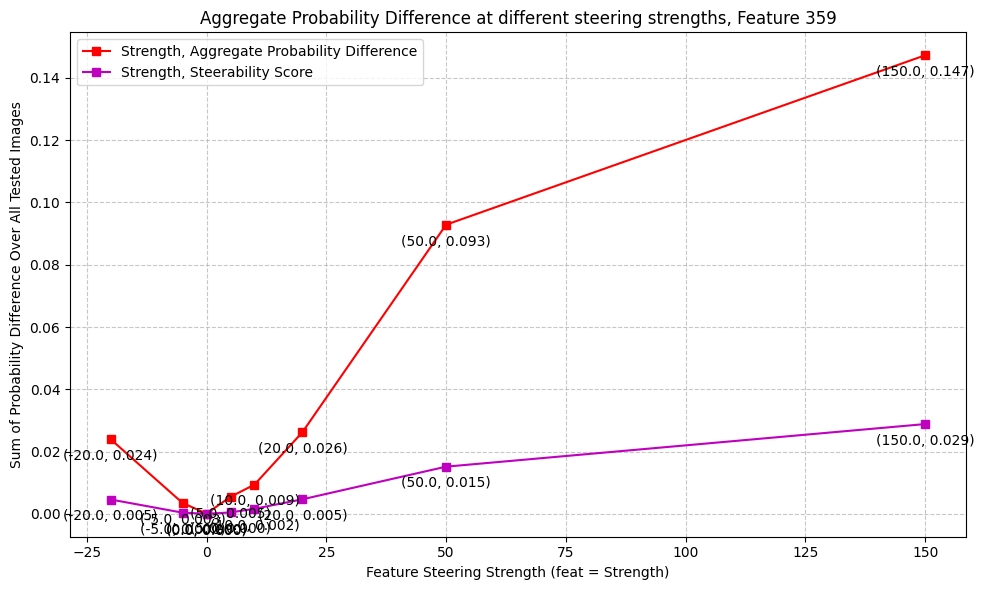

359
150.0 ['front' 'cover' 'convert' 'pull' 'cheap' 'version' 'bit' 'thumbnail'
 'correctly' 'charger']
150.0 probs tensor([0.1430, 0.0267, 0.0263, 0.0200, 0.0186, 0.0166, 0.0148, 0.0141, 0.0139,
        0.0119], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0217, 0.0008, 0.0007, 0.0005, 0.0004, 0.0002, 0.0002, 0.0002, 0.0002,
        0.0001])
['front' 'cover' 'convert' 'pull' 'cheap' 'thumbnail' 'version' 'bit'
 'correctly' 'cleaning']


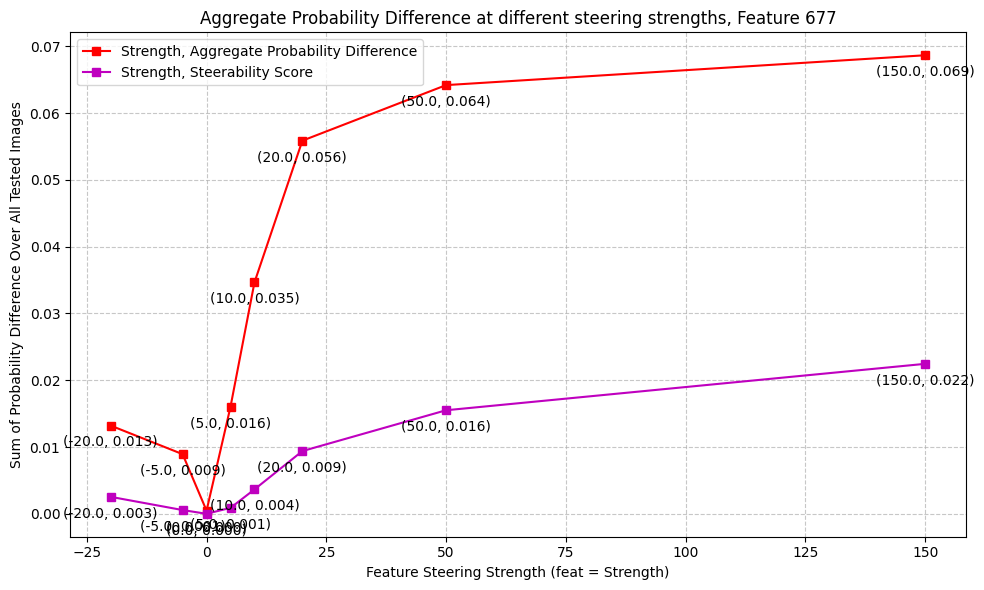

677
150.0 ['download' 'thumbnail' 'mph' 'front' 'page' 'smith' 'rw' 'ray' 'cover'
 'downloads']
150.0 probs tensor([0.0592, 0.0564, 0.0547, 0.0526, 0.0300, 0.0256, 0.0221, 0.0214, 0.0164,
        0.0156], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0047, 0.0039, 0.0036, 0.0030, 0.0008, 0.0008, 0.0006, 0.0003, 0.0003,
        0.0002])
['download' 'thumbnail' 'mph' 'front' 'page' 'smith' 'rw' 'cover'
 'downloads' 'printable']


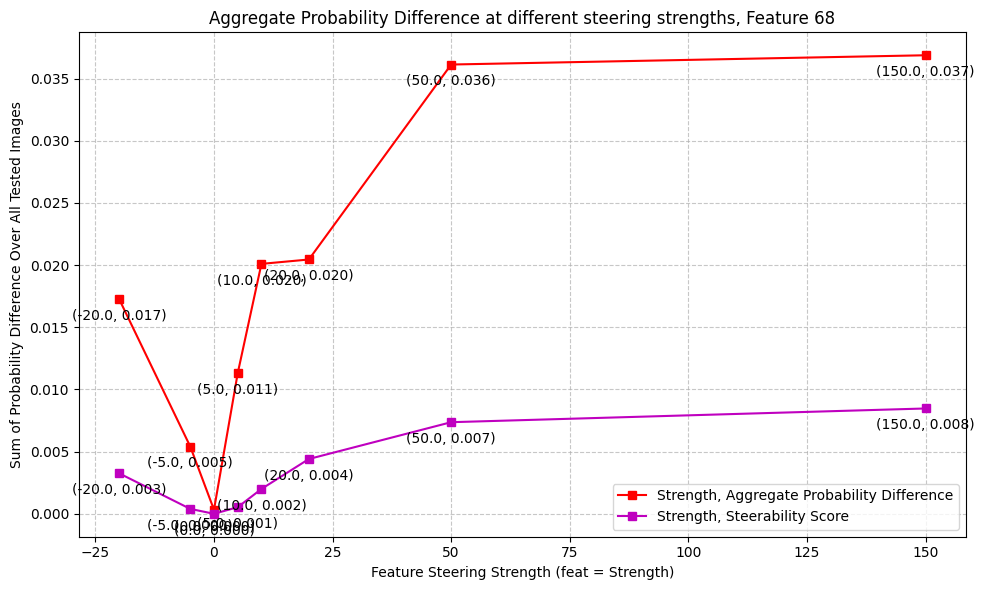

68
150.0 ['cup' 'dave' 'nba' 'd' 'ing' 'ky' 'pdf' 'edward' 'davis' 'e']
150.0 probs tensor([0.0312, 0.0276, 0.0218, 0.0202, 0.0157, 0.0156, 0.0150, 0.0146, 0.0128,
        0.0110], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([1.3595e-03, 1.0998e-03, 3.6665e-04, 2.8173e-04, 2.5463e-04, 2.3348e-04,
        2.2621e-04, 2.2253e-04, 1.9914e-04, 8.7362e-05])
['cup' 'dave' 'nba' 'ing' 'edward' 'pdf' 'd' 'davis' 'ky' 'bookmark']


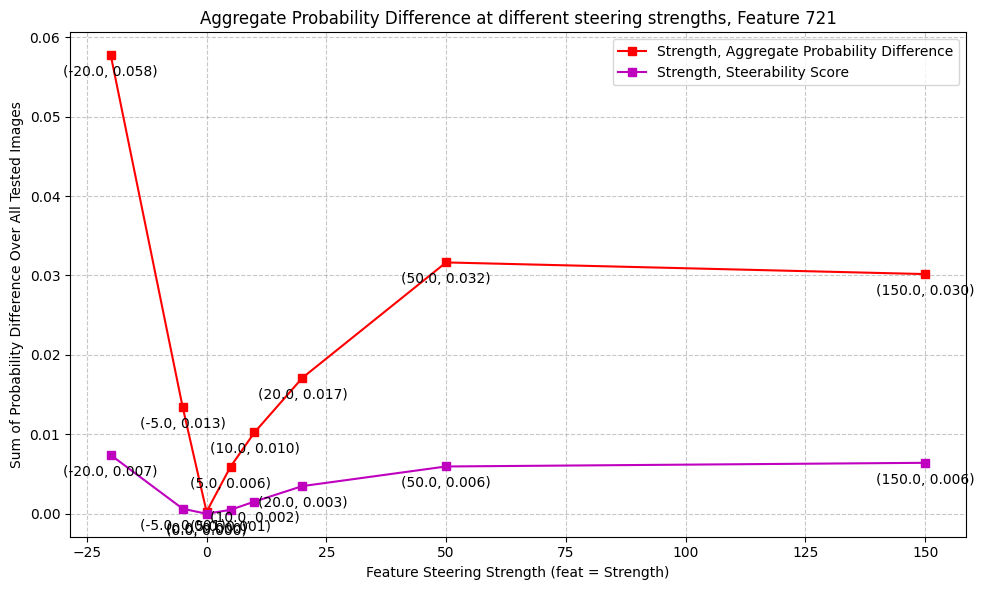

721
150.0 ['extensive' 'pa' 'layout' 'extreme' 'shown' 'per' 'par' 'pair'
 'permalink' 'attribute']
150.0 probs tensor([0.0309, 0.0239, 0.0163, 0.0162, 0.0153, 0.0113, 0.0110, 0.0104, 0.0100,
        0.0099], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([9.1072e-04, 7.5162e-04, 2.8091e-04, 1.9402e-04, 1.4230e-04, 1.3340e-04,
        1.2713e-04, 1.0750e-04, 9.1727e-05, 8.4728e-05])
['pa' 'extensive' 'shown' 'extreme' 'layout' 'attribute' 'per' 'par'
 'example' 'permalink']


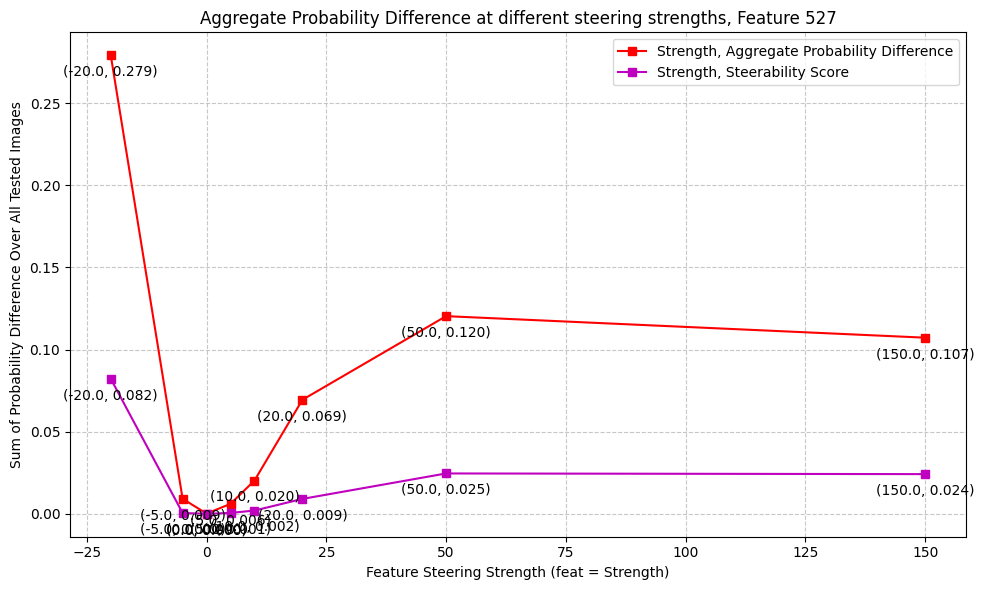

527
150.0 ['racing' 'clubs' 'cars' 'golf' 'relief' 'winning' 'driving' 'games'
 'recommendations' 'gaming']
150.0 probs tensor([0.1152, 0.0593, 0.0454, 0.0447, 0.0259, 0.0152, 0.0145, 0.0144, 0.0111,
        0.0107], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0115, 0.0038, 0.0021, 0.0010, 0.0007, 0.0003, 0.0002, 0.0002, 0.0002,
        0.0001])
['racing' 'clubs' 'golf' 'cars' 'relief' 'winning' 'driving' 'games'
 'recommendations' 'gaming']


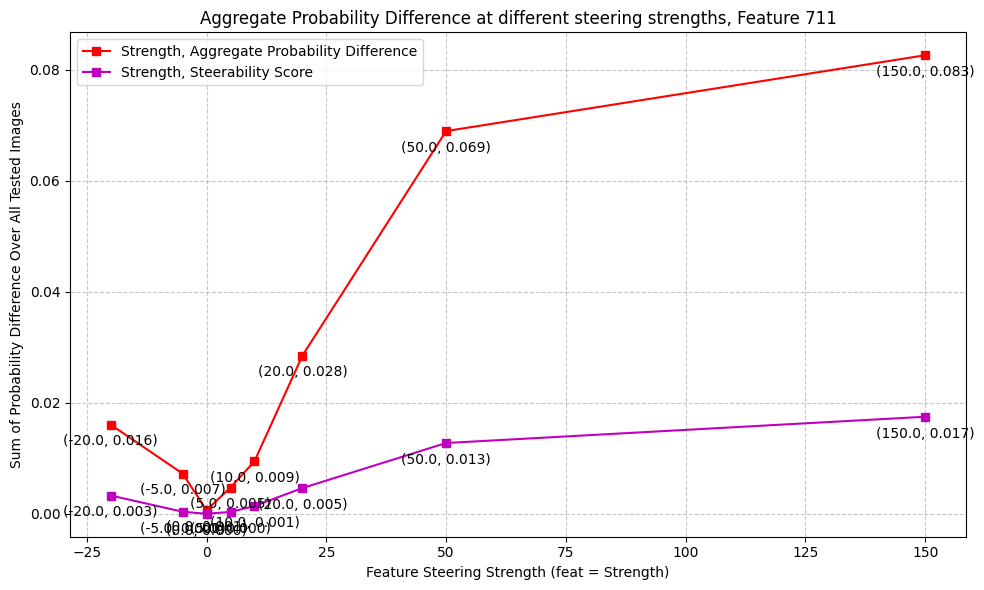

711
150.0 ['verify' 'template' 'apparel' 'sample' 'completed' 'quarter' 'tobacco'
 'before' 'womens' 'wear']
150.0 probs tensor([0.0942, 0.0459, 0.0438, 0.0336, 0.0199, 0.0188, 0.0172, 0.0141, 0.0139,
        0.0123], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0068, 0.0025, 0.0016, 0.0010, 0.0005, 0.0003, 0.0003, 0.0002, 0.0001,
        0.0001])
['verify' 'apparel' 'template' 'sample' 'tobacco' 'quarter' 'completed'
 'hat' 'womens' 'wear']


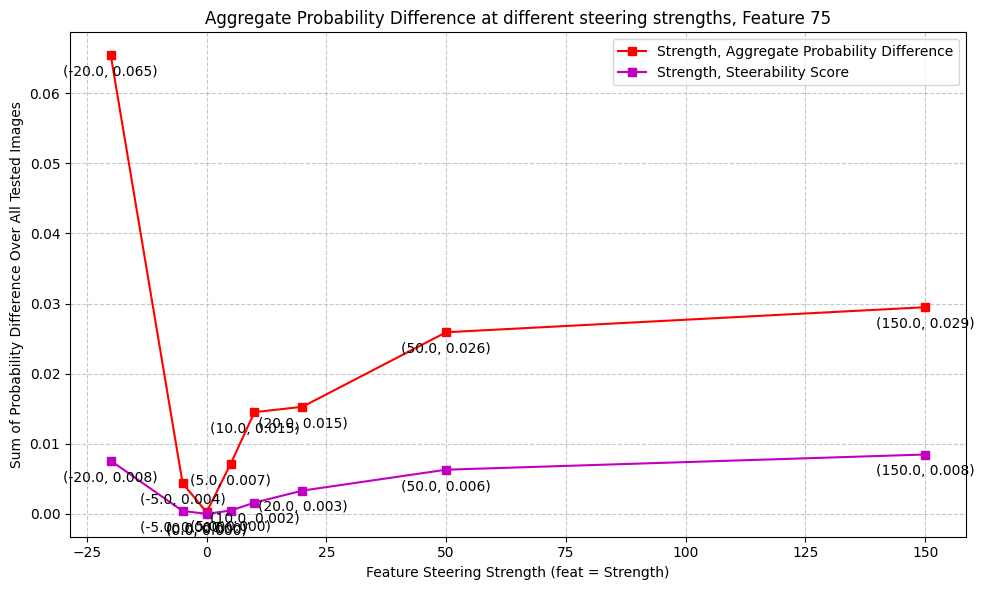

75
150.0 ['flags' 'sheet' 'ie' 'template' 'product' 'named' 'list' 'header' 'lists'
 'avg']
150.0 probs tensor([0.0297, 0.0286, 0.0262, 0.0221, 0.0182, 0.0168, 0.0153, 0.0144, 0.0136,
        0.0129], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0009, 0.0009, 0.0004, 0.0004, 0.0003, 0.0003, 0.0002, 0.0002, 0.0002,
        0.0002])
['flags' 'sheet' 'product' 'template' 'header' 'ie' 'named' 'list' 'avg'
 'lists']


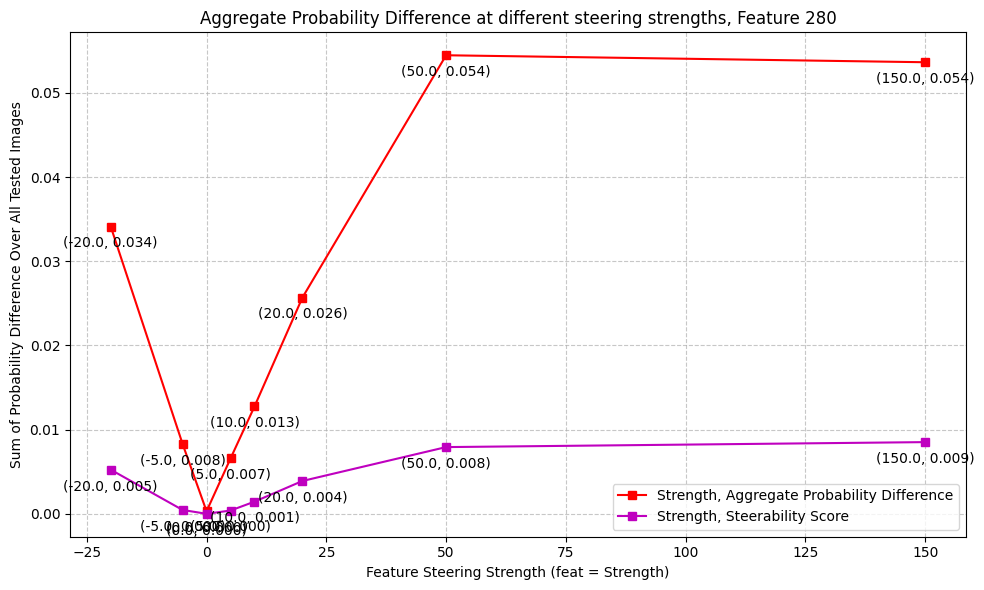

280
150.0 ['comfortable' 'miami' 'reference' 'receiver' 'lcd' 'mens' 'reserve'
 'upcoming' 'recipe' 'counter']
150.0 probs tensor([0.0496, 0.0215, 0.0150, 0.0148, 0.0148, 0.0126, 0.0123, 0.0112, 0.0098,
        0.0095], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([2.8786e-03, 3.4356e-04, 2.3736e-04, 2.3268e-04, 1.5630e-04, 1.5446e-04,
        9.9127e-05, 9.7982e-05, 9.6943e-05, 8.2595e-05])
['comfortable' 'reference' 'lcd' 'receiver' 'reserve' 'miami' 'mens'
 'upcoming' 'hist' 'comfort']


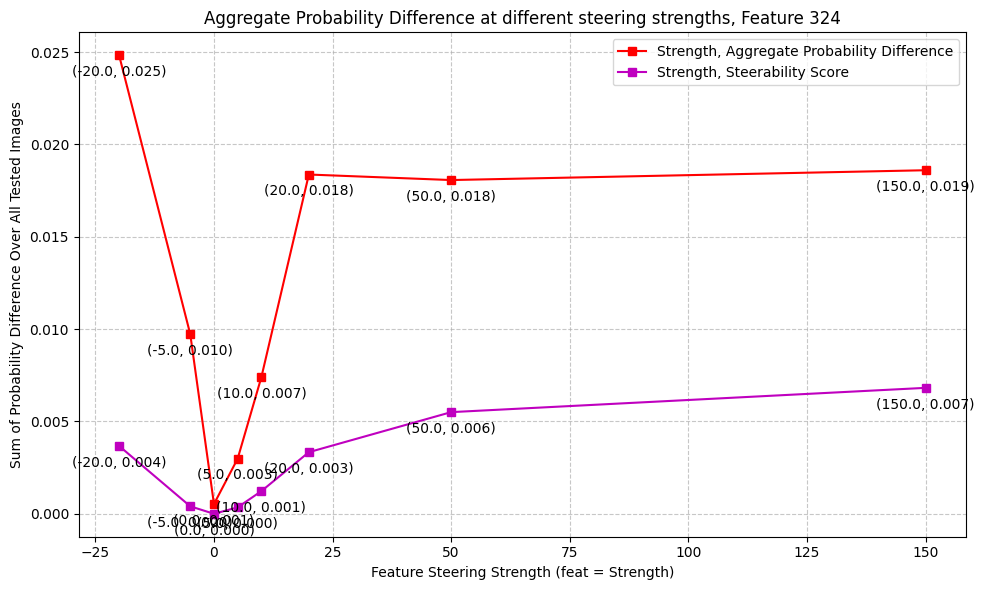

324
150.0 ['ad' 'hardcover' 'lord' 'led' 'carry' 'cover' 'bond' 'book' 'view' 'adds']
150.0 probs tensor([0.0178, 0.0159, 0.0156, 0.0151, 0.0151, 0.0144, 0.0143, 0.0142, 0.0135,
        0.0134], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0003, 0.0003, 0.0003, 0.0003, 0.0003, 0.0002, 0.0002, 0.0002, 0.0002,
        0.0001])
['led' 'hardcover' 'lord' 'ad' 'carry' 'cover' 'book' 'view' 'adds' 'bond']


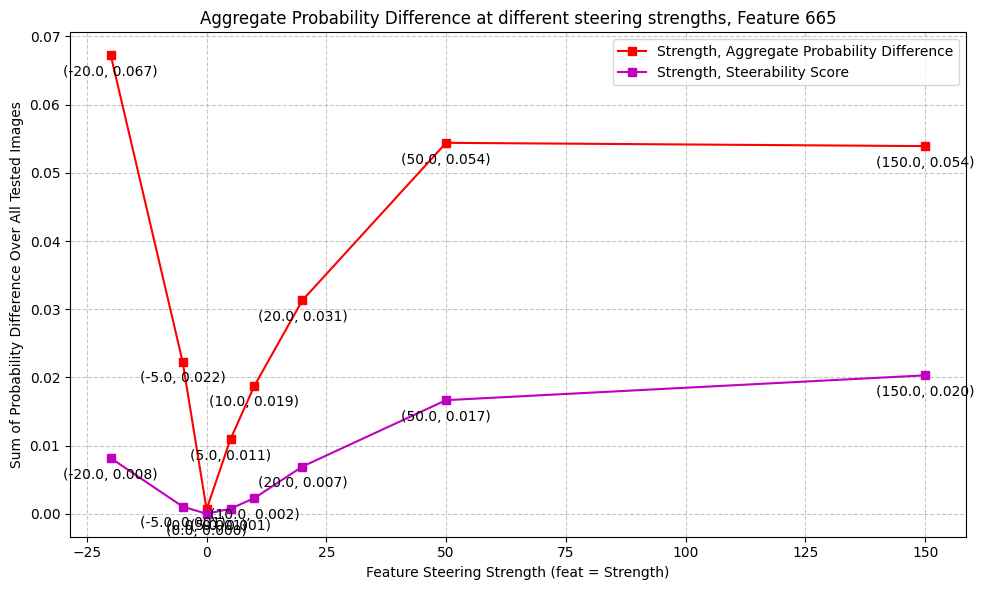

665
150.0 ['rings' 'balls' 'these' 'sizes' 'wholesale' 'yellow' 'stainless' 'trucks'
 'gross' 'printable']
150.0 probs tensor([0.0963, 0.0589, 0.0451, 0.0408, 0.0363, 0.0346, 0.0330, 0.0274, 0.0261,
        0.0245], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0029, 0.0024, 0.0022, 0.0019, 0.0019, 0.0016, 0.0011, 0.0008, 0.0006,
        0.0005])
['rings' 'balls' 'wholesale' 'these' 'sizes' 'yellow' 'stainless'
 'printable' 'gross' 'trucks']


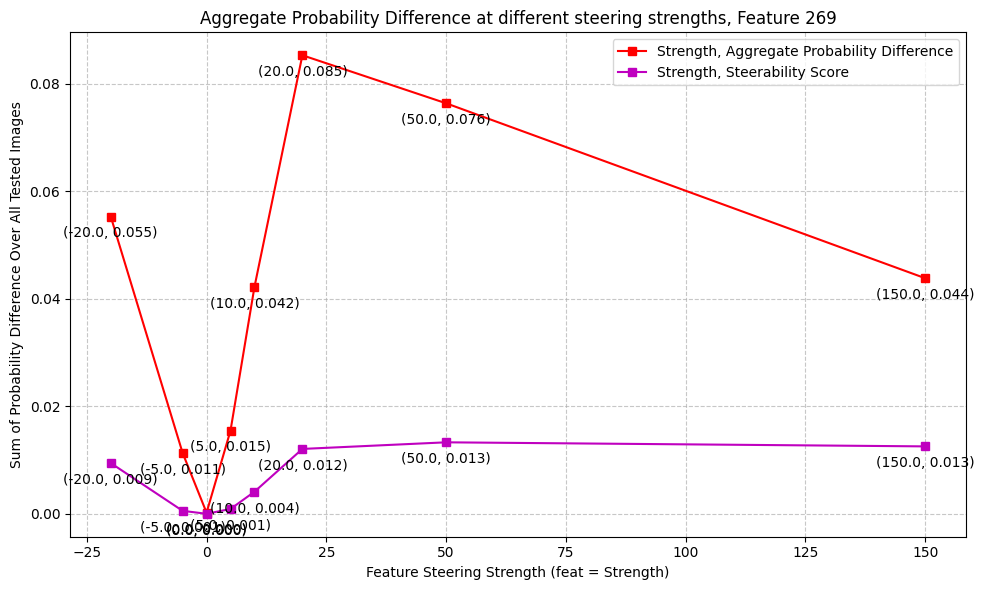

269
150.0 ['mens' 'tiny' 'hotels' 'employee' 'name' 'before' 'pin' 'employees'
 'listed' 'named']
150.0 probs tensor([0.0538, 0.0350, 0.0314, 0.0307, 0.0264, 0.0221, 0.0216, 0.0176, 0.0158,
        0.0157], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0019, 0.0015, 0.0014, 0.0009, 0.0006, 0.0005, 0.0004, 0.0002, 0.0002,
        0.0002])
['mens' 'tiny' 'employee' 'hotels' 'name' 'pin' 'employees' 'listed'
 'before' 'named']


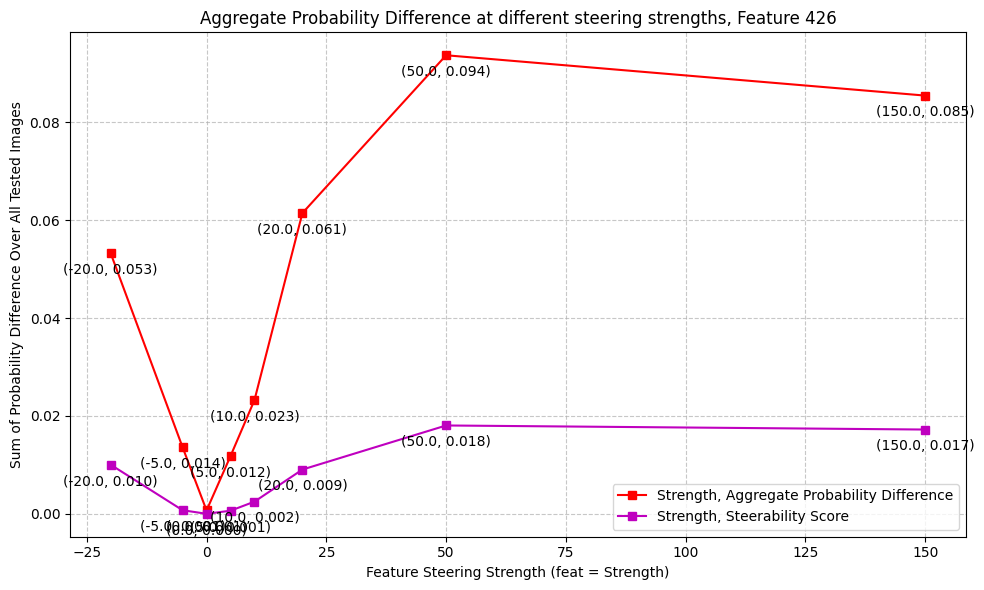

426
150.0 ['dildo' 'debian' 'ml' 'and' 'min' 'in' 'with' 'im' 'includes' 'hi']
150.0 probs tensor([0.0680, 0.0538, 0.0406, 0.0319, 0.0187, 0.0185, 0.0179, 0.0146, 0.0145,
        0.0112], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0073, 0.0029, 0.0008, 0.0005, 0.0004, 0.0003, 0.0003, 0.0003, 0.0002,
        0.0001])
['dildo' 'ml' 'and' 'min' 'with' 'includes' 'in' 'debian' 'im' 'na']


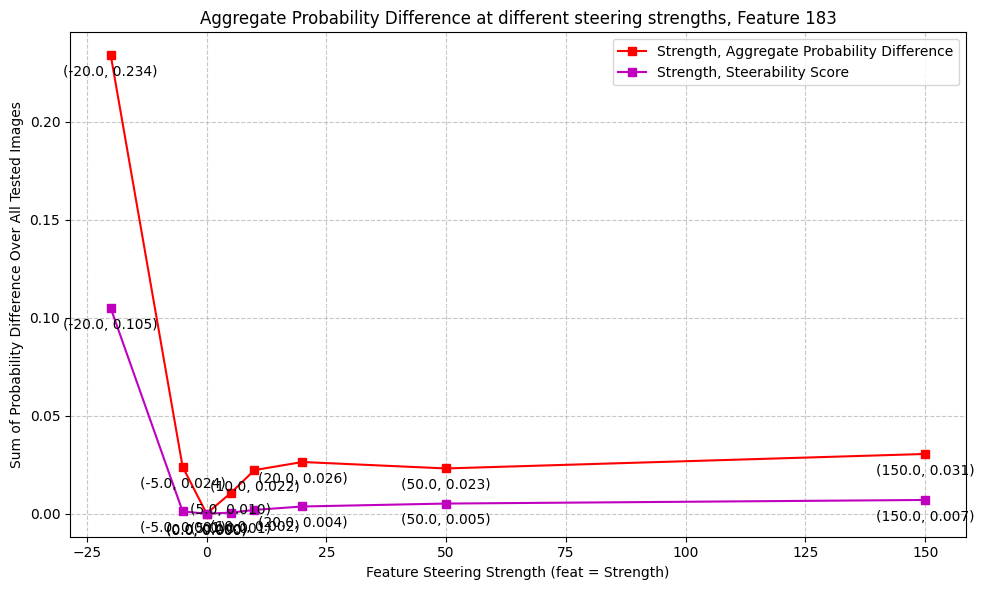

183
150.0 ['newspapers' 'stainless' 'classifieds' 'wheels' 'limousines' 'laptops'
 'leather' 'magazines' 'font' 'furniture']
150.0 probs tensor([0.0329, 0.0314, 0.0278, 0.0179, 0.0108, 0.0104, 0.0099, 0.0091, 0.0085,
        0.0084], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([9.3142e-04, 9.2470e-04, 8.6987e-04, 1.4077e-04, 1.1353e-04, 1.0645e-04,
        9.2813e-05, 9.1239e-05, 8.5603e-05, 7.9738e-05])
['classifieds' 'newspapers' 'stainless' 'wheels' 'limousines' 'chocolate'
 'laptops' 'magazines' 'leather' 'manufacturers']


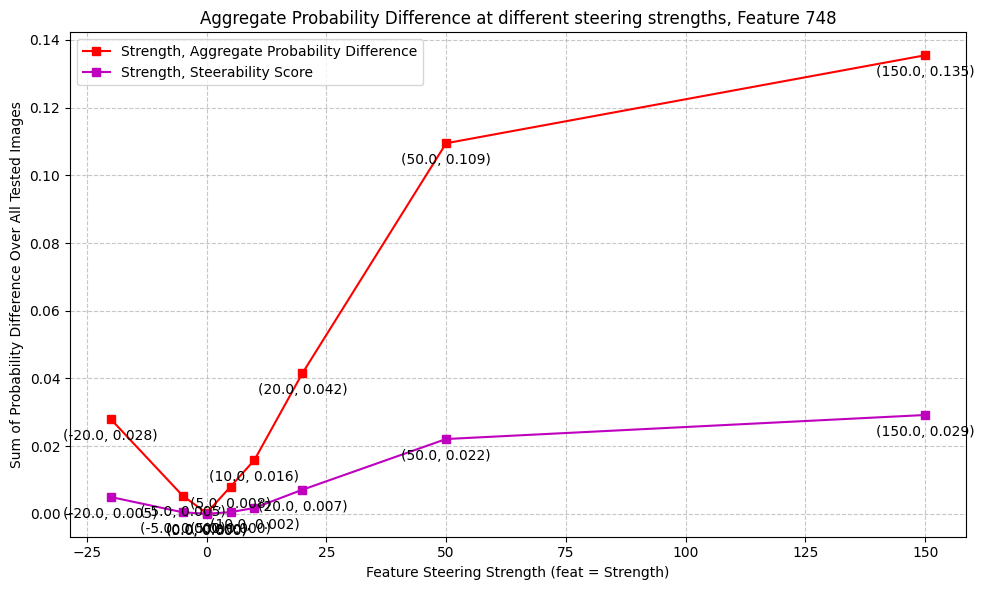

748
150.0 ['epson' 'canon' 'panasonic' 'set' 'sheets' 'gcc' 'sheet' 'gb' 'toshiba'
 'lg']
150.0 probs tensor([0.1346, 0.0611, 0.0307, 0.0269, 0.0243, 0.0241, 0.0206, 0.0170, 0.0156,
        0.0135], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0184, 0.0034, 0.0009, 0.0005, 0.0005, 0.0005, 0.0005, 0.0002, 0.0002,
        0.0002])
['epson' 'canon' 'panasonic' 'set' 'sheets' 'gcc' 'sheet' 'gb' 'toshiba'
 'lg']


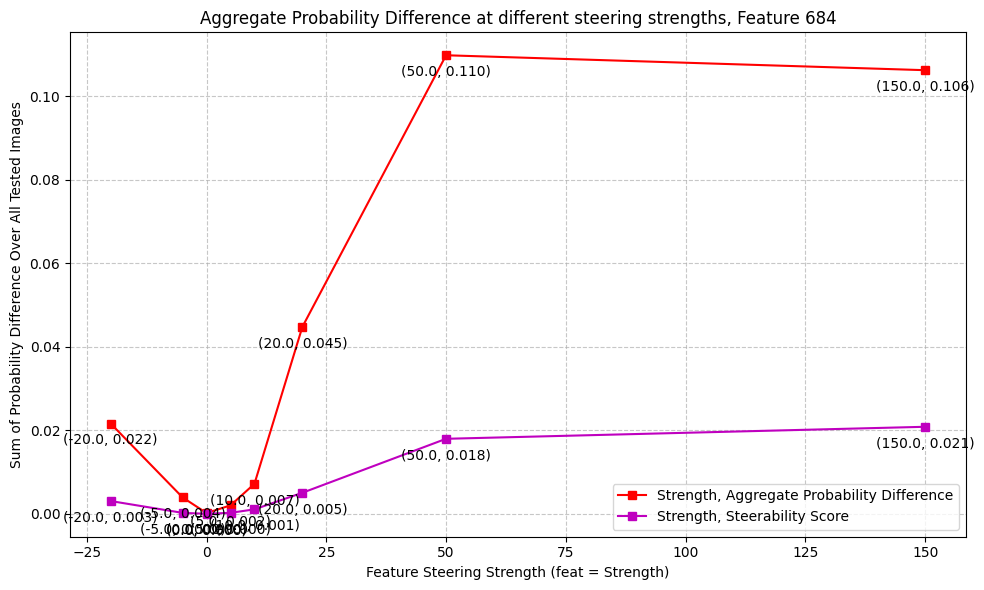

684
150.0 ['zip' 'thumbnail' 'map' 'poster' 'homepage' 'rc' 'sri' 'sizes' 'walls'
 'google']
150.0 probs tensor([0.1179, 0.0469, 0.0343, 0.0227, 0.0160, 0.0156, 0.0094, 0.0092, 0.0086,
        0.0080], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([1.1280e-02, 3.1792e-03, 1.4923e-03, 4.7021e-04, 3.3933e-04, 1.9237e-04,
        9.2213e-05, 8.4626e-05, 5.9173e-05, 4.4749e-05])
['zip' 'thumbnail' 'map' 'poster' 'homepage' 'rc' 'sizes' 'walls' 'size'
 'label']


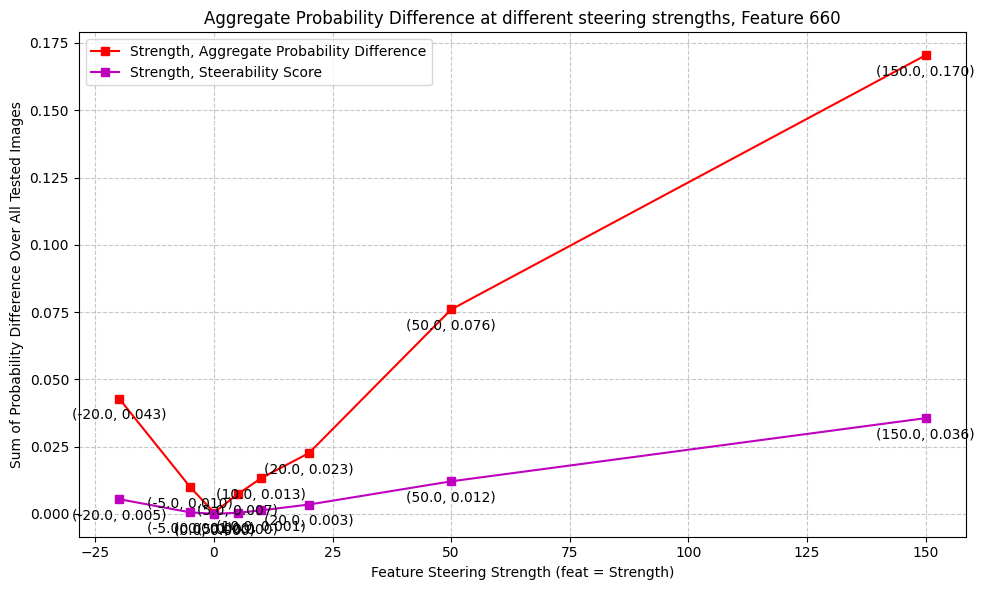

660
150.0 ['sign' 'me' 'drawing' 'board' 'cumshot' 'tube' 'night' 'lighting' 'icon'
 'ring']
150.0 probs tensor([0.2220, 0.0296, 0.0216, 0.0153, 0.0125, 0.0120, 0.0112, 0.0093, 0.0083,
        0.0081], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([2.9050e-02, 1.4467e-03, 4.4578e-04, 2.5366e-04, 1.8882e-04, 1.7103e-04,
        1.5015e-04, 1.4022e-04, 1.1939e-04, 7.4118e-05])
['sign' 'me' 'drawing' 'board' 'lighting' 'cumshot' 'night' 'icon' 'tube'
 'video']


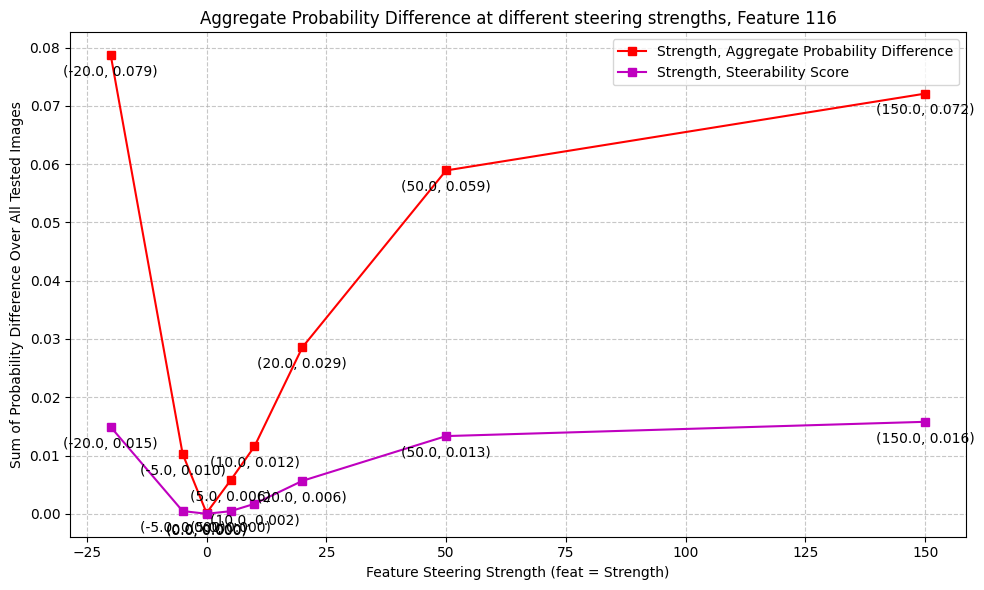

116
150.0 ['blue' 'these' 'named' 'shown' 'label' 'grey' 'front' 'pin' 'naked'
 'silver']
150.0 probs tensor([0.0891, 0.0603, 0.0301, 0.0247, 0.0162, 0.0162, 0.0150, 0.0149, 0.0147,
        0.0141], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0052, 0.0031, 0.0008, 0.0007, 0.0003, 0.0003, 0.0002, 0.0002, 0.0002,
        0.0002])
['blue' 'these' 'shown' 'named' 'label' 'front' 'pink' 'pin' 'naked'
 'grey']


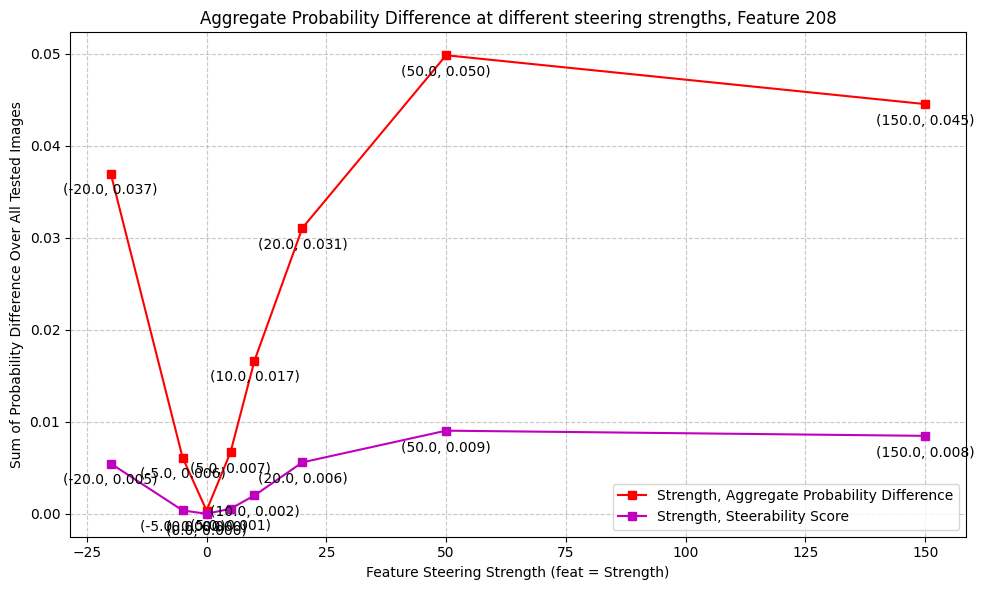

208
150.0 ['buffalo' 'shape' 'fetish' 'thermal' 'checks' 'breasts' 'taiwan' 'cells'
 'stamps' 'infection']
150.0 probs tensor([0.0444, 0.0253, 0.0236, 0.0188, 0.0182, 0.0124, 0.0117, 0.0114, 0.0113,
        0.0111], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([1.9834e-03, 9.5299e-04, 4.8340e-04, 2.9160e-04, 2.0923e-04, 1.5935e-04,
        1.3118e-04, 1.2129e-04, 1.2106e-04, 9.3342e-05])
['buffalo' 'shape' 'fetish' 'thermal' 'checks' 'breasts' 'notification'
 'cells' 'stamps' 'infection']


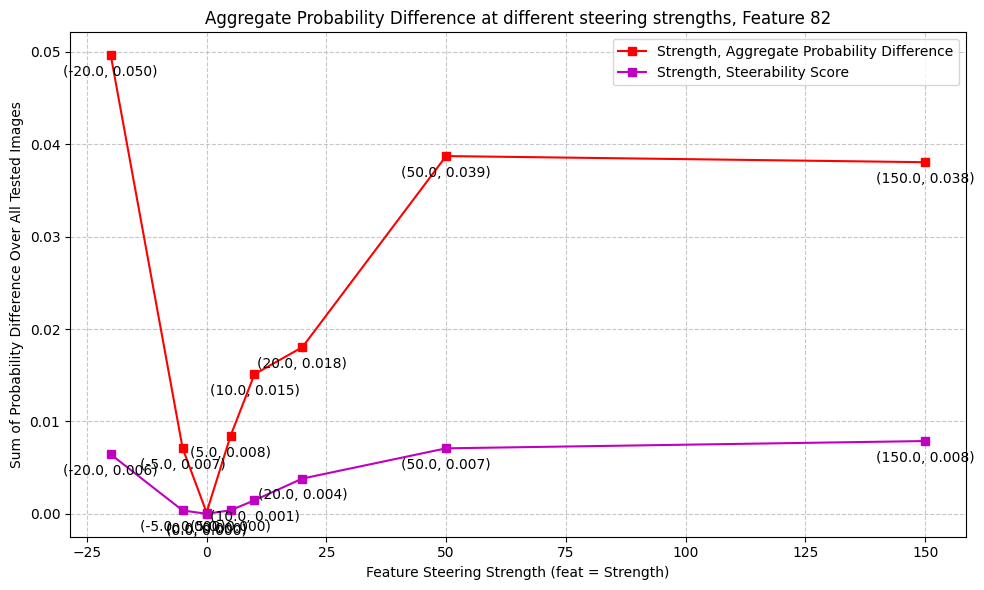

82
150.0 ['nine' 'blue' 'inter' 'nd' 'mid' 'double' 'd' 'co' 'fine' 'go']
150.0 probs tensor([0.0469, 0.0408, 0.0194, 0.0193, 0.0161, 0.0119, 0.0098, 0.0098, 0.0097,
        0.0096], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([1.4489e-03, 1.1181e-03, 3.4005e-04, 2.8623e-04, 2.8154e-04, 1.2889e-04,
        8.9648e-05, 8.1872e-05, 7.6195e-05, 6.5802e-05])
['nine' 'blue' 'nd' 'inter' 'mid' 'fine' 'co' 'double' 'go' 'sd']


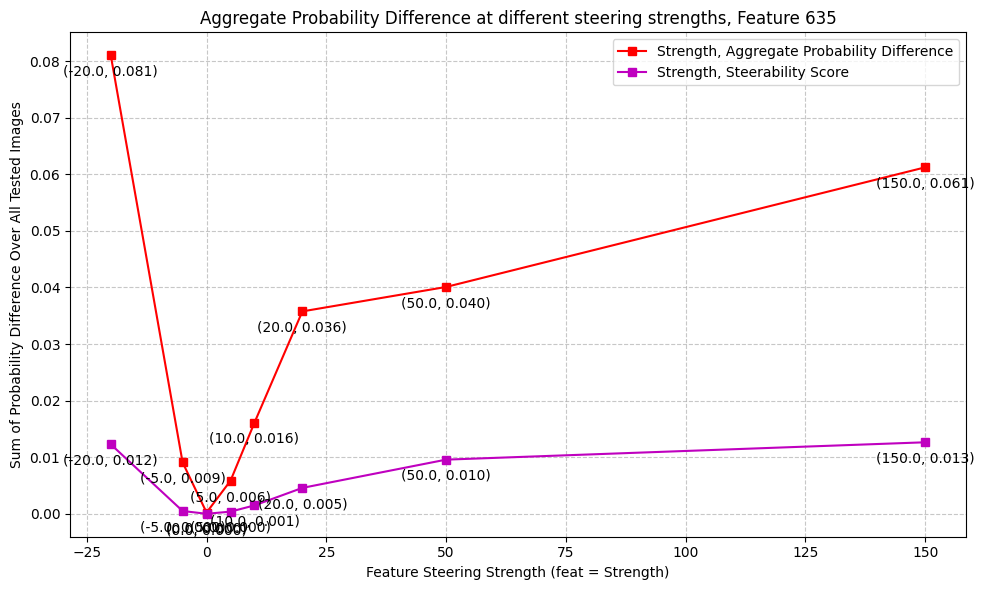

635
150.0 ['t' 'j' 'cute' 'z' 'justice' 'nj' 'r' 'want' 'dean' 'd']
150.0 probs tensor([0.0633, 0.0541, 0.0238, 0.0210, 0.0210, 0.0177, 0.0168, 0.0151, 0.0149,
        0.0146], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0037, 0.0018, 0.0007, 0.0004, 0.0003, 0.0003, 0.0002, 0.0002, 0.0002,
        0.0002])
['t' 'j' 'cute' 'justice' 'want' 'dean' 'z' 'ea' 'l' 'y']


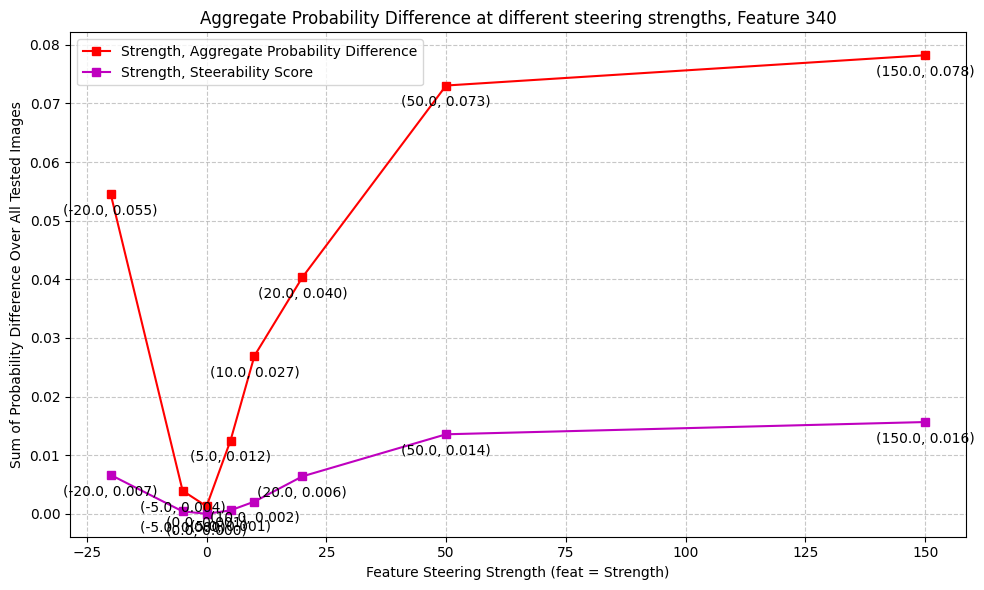

340
150.0 ['pp' 'dc' 'paper' 'paperback' 'pair' 'pack' 'pl' 'pet' 'pages' 'columbia']
150.0 probs tensor([0.0881, 0.0345, 0.0334, 0.0290, 0.0262, 0.0209, 0.0185, 0.0175, 0.0158,
        0.0152], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0061, 0.0013, 0.0011, 0.0009, 0.0005, 0.0004, 0.0003, 0.0002, 0.0002,
        0.0002])
['pp' 'paper' 'dc' 'paperback' 'pack' 'pl' 'pet' 'pages' 'columbia'
 'permalink']


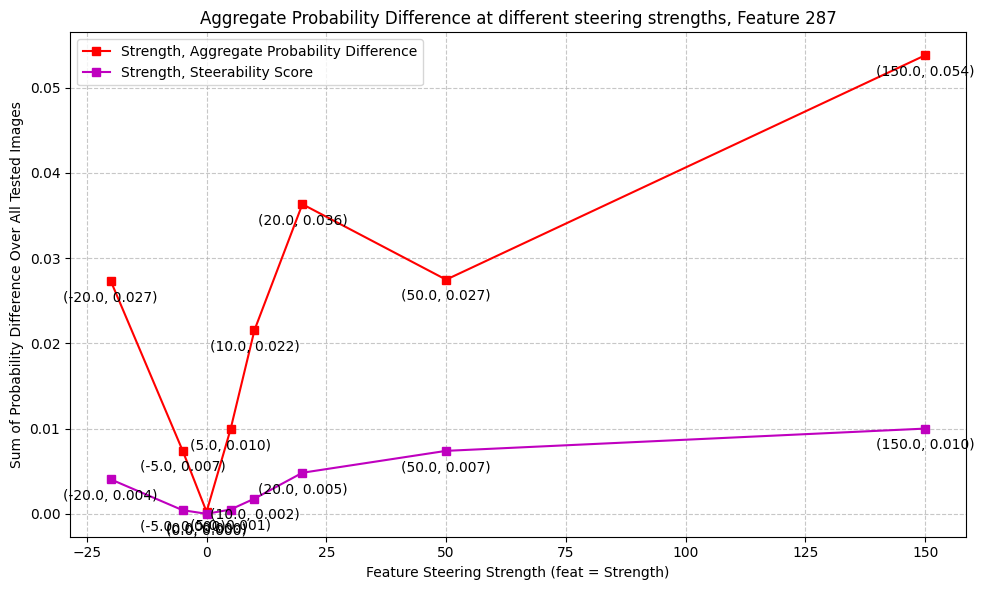

287
150.0 ['lighting' 'pair' 'wire' 'or' 'apr' 'pink' 'steel' 'asp' 'best' 'cable']
150.0 probs tensor([0.0383, 0.0274, 0.0233, 0.0212, 0.0193, 0.0193, 0.0165, 0.0157, 0.0154,
        0.0152], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0029, 0.0009, 0.0004, 0.0003, 0.0002, 0.0002, 0.0002, 0.0002, 0.0001,
        0.0001])
['lighting' 'pink' 'apr' 'wire' 'or' 'steel' 'best' 'my' 'asp' 'product']


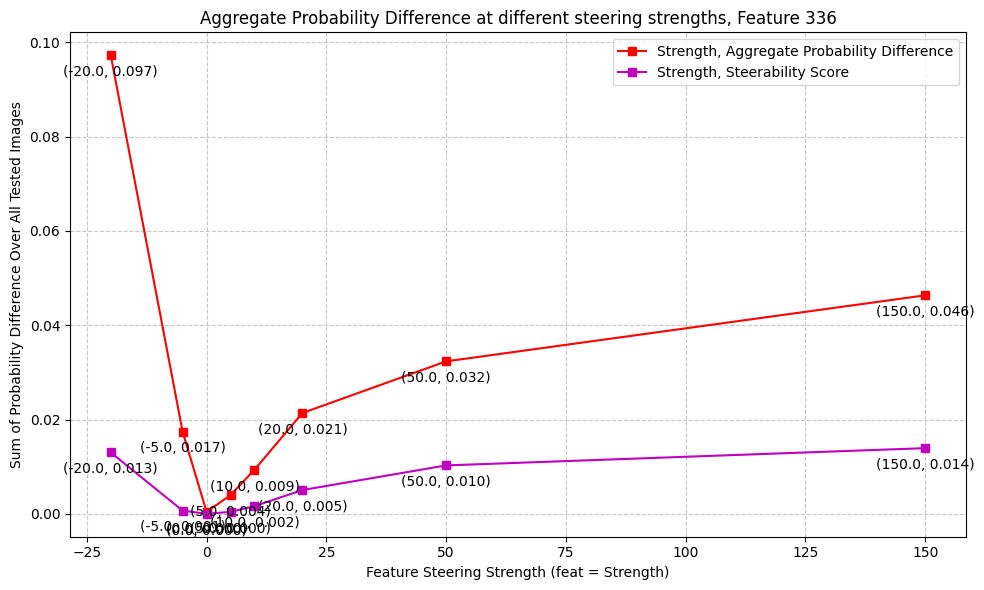

336
150.0 ['navy' 'epson' 'printers' 'newsletters' 'bag' 'mailing' 'apparel'
 'wallpapers' 'publication' 'journal']
150.0 probs tensor([0.0680, 0.0319, 0.0271, 0.0266, 0.0219, 0.0214, 0.0200, 0.0198, 0.0190,
        0.0183], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0021, 0.0010, 0.0009, 0.0006, 0.0005, 0.0005, 0.0005, 0.0005, 0.0004,
        0.0004])
['navy' 'epson' 'newsletters' 'newsletter' 'printers' 'apparel'
 'wallpapers' 'publication' 'bag' 'wallpaper']


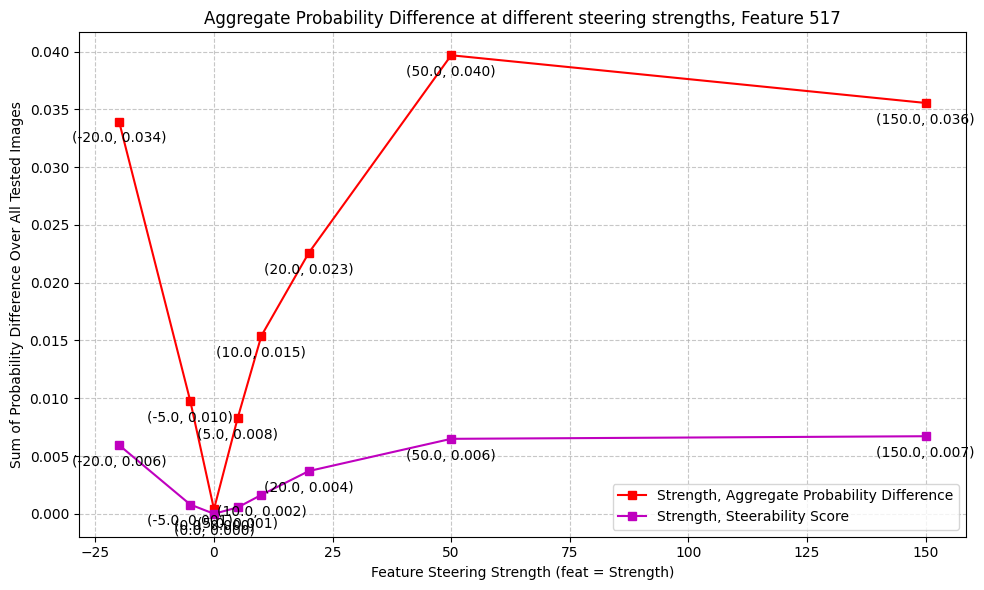

517
150.0 ['austin' 'cross' 'bars' 'editing' 'commons' 'debian' 'script' 'button'
 'good' 'console']
150.0 probs tensor([0.0383, 0.0242, 0.0135, 0.0128, 0.0124, 0.0111, 0.0106, 0.0102, 0.0090,
        0.0084], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([1.2642e-03, 6.0512e-04, 2.7204e-04, 2.4023e-04, 1.8507e-04, 1.1420e-04,
        8.2610e-05, 8.1968e-05, 6.8996e-05, 5.7852e-05])
['austin' 'cross' 'editing' 'commons' 'bars' 'button' 'pen' 'good'
 'console' 'reverse']


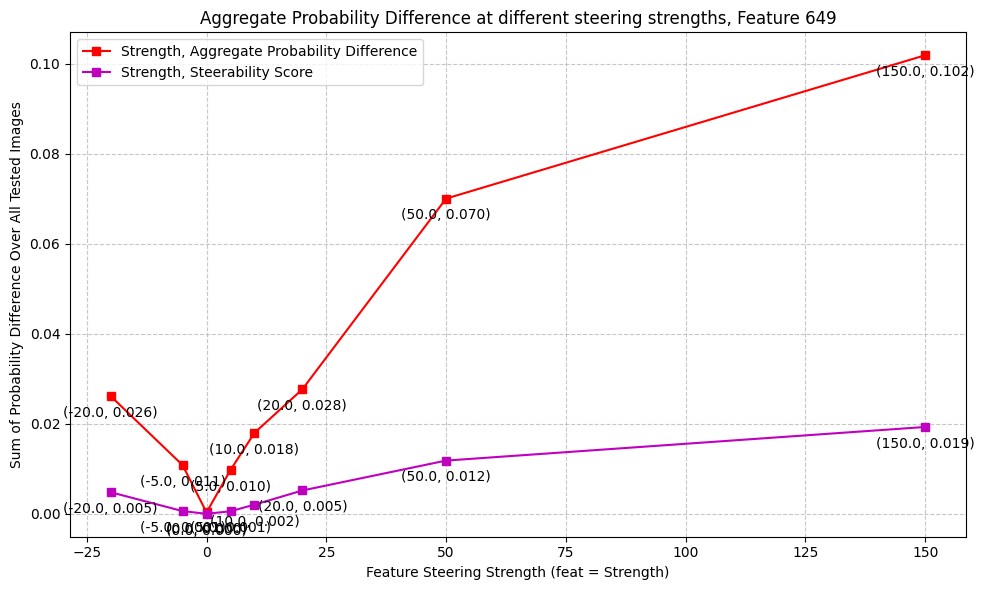

649
150.0 ['green' 'monitors' 'gray' 'portion' 'pair' 'brands' 'grey' 'large'
 'eating' 'breakfast']
150.0 probs tensor([0.0831, 0.0481, 0.0399, 0.0315, 0.0204, 0.0187, 0.0171, 0.0156, 0.0133,
        0.0129], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0104, 0.0020, 0.0012, 0.0007, 0.0003, 0.0003, 0.0003, 0.0002, 0.0002,
        0.0002])
['green' 'monitors' 'gray' 'portion' 'brands' 'large' 'orange' 'breakfast'
 'produce' 'grey']


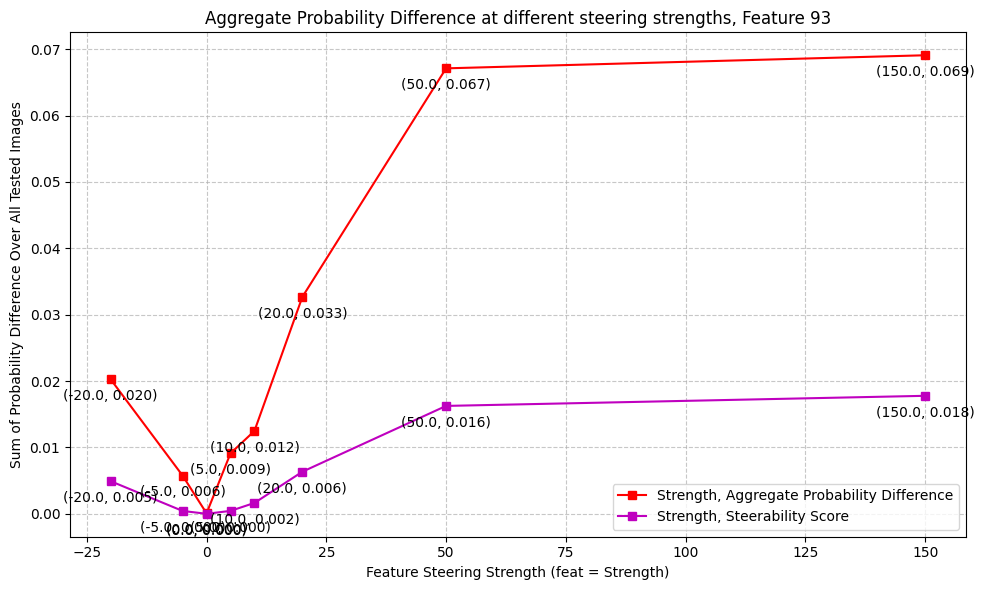

93
150.0 ['hurricane' 'pretty' 'contacts' 'serial' 'phoenix' 'privacy' 'proposal'
 'beauty' 'protect' 'protection']
150.0 probs tensor([0.0632, 0.0603, 0.0428, 0.0399, 0.0270, 0.0210, 0.0210, 0.0196, 0.0170,
        0.0144], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0048, 0.0027, 0.0020, 0.0012, 0.0009, 0.0006, 0.0005, 0.0003, 0.0003,
        0.0002])
['pretty' 'hurricane' 'contacts' 'serial' 'phoenix' 'privacy' 'beauty'
 'proposal' 'protect' 'protected']


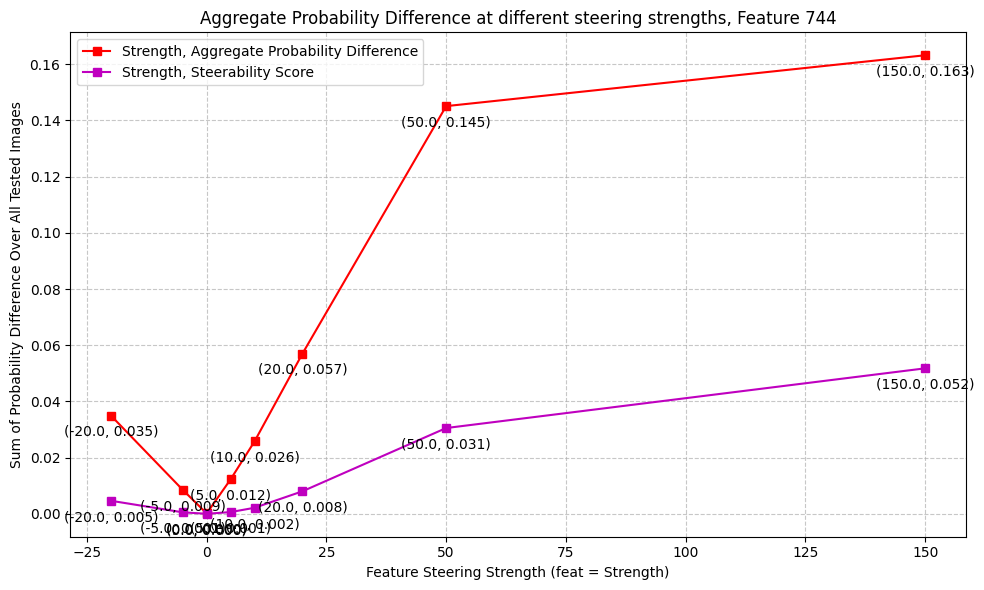

744
150.0 ['lincoln' 'printable' 'paper' 'hungary' 'pair' 'fruit' 'recipe' 'table'
 'prints' 'irish']
150.0 probs tensor([0.1519, 0.1507, 0.0350, 0.0279, 0.0260, 0.0229, 0.0132, 0.0124, 0.0121,
        0.0099], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([2.6631e-02, 1.8782e-02, 1.4210e-03, 6.9986e-04, 5.1824e-04, 1.2377e-04,
        1.1302e-04, 1.0598e-04, 1.0298e-04, 9.4662e-05])
['printable' 'lincoln' 'paper' 'hungary' 'fruit' 'recipe' 'prints' 'pair'
 'table' 'irish']


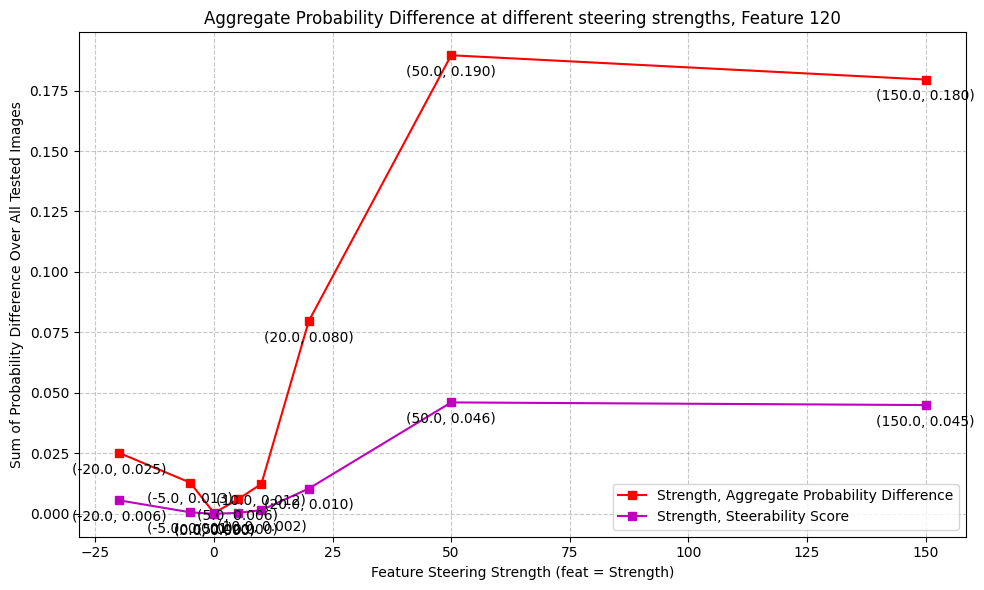

120
150.0 ['sensor' 'philadelphia' 'kentucky' 'clothing' 'font' 'verzeichnis'
 'cartridge' 'outstanding' 'shorts' 'tennessee']
150.0 probs tensor([0.1569, 0.0702, 0.0517, 0.0266, 0.0219, 0.0201, 0.0112, 0.0108, 0.0103,
        0.0099], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([3.2240e-02, 4.5296e-03, 2.6969e-03, 9.0854e-04, 3.2306e-04, 2.7071e-04,
        1.5996e-04, 1.2828e-04, 1.1692e-04, 7.3633e-05])
['sensor' 'philadelphia' 'kentucky' 'clothing' 'font' 'verzeichnis'
 'outstanding' 'tennessee' 'cartridge' 'shirt']


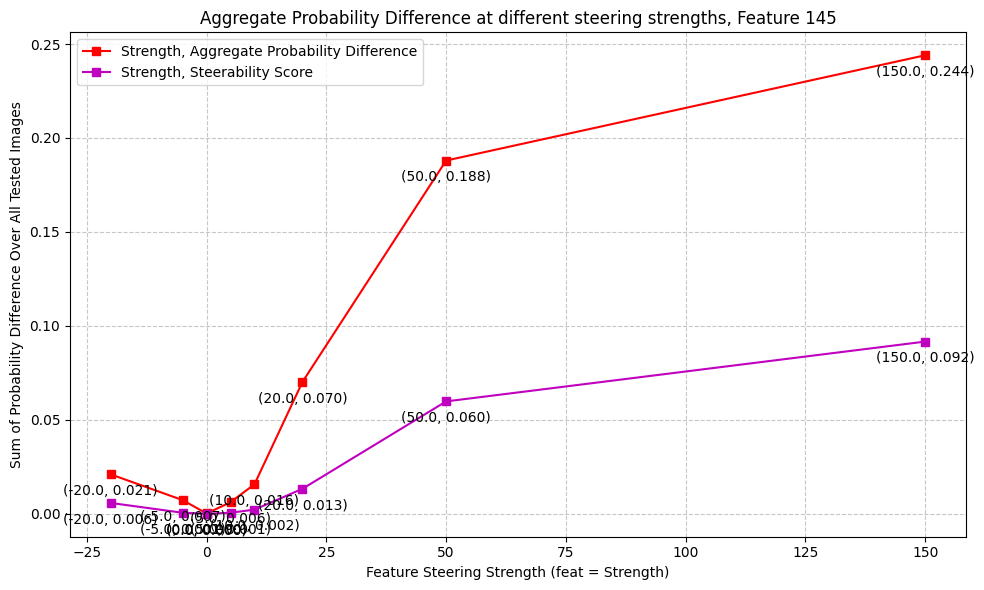

145
150.0 ['white' 'silver' 'bowl' 'grey' 'green' 'gray' 'pearl' 'platinum' 'clay'
 'livecam']
150.0 probs tensor([0.2264, 0.1439, 0.0859, 0.0701, 0.0471, 0.0364, 0.0252, 0.0116, 0.0107,
        0.0105], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([5.9551e-02, 1.6109e-02, 4.8040e-03, 3.2074e-03, 3.1678e-03, 1.0375e-03,
        5.4299e-04, 1.3602e-04, 1.0065e-04, 8.9882e-05])
['white' 'silver' 'bowl' 'green' 'grey' 'gray' 'pearl' 'platinum' 'clay'
 'testimonials']


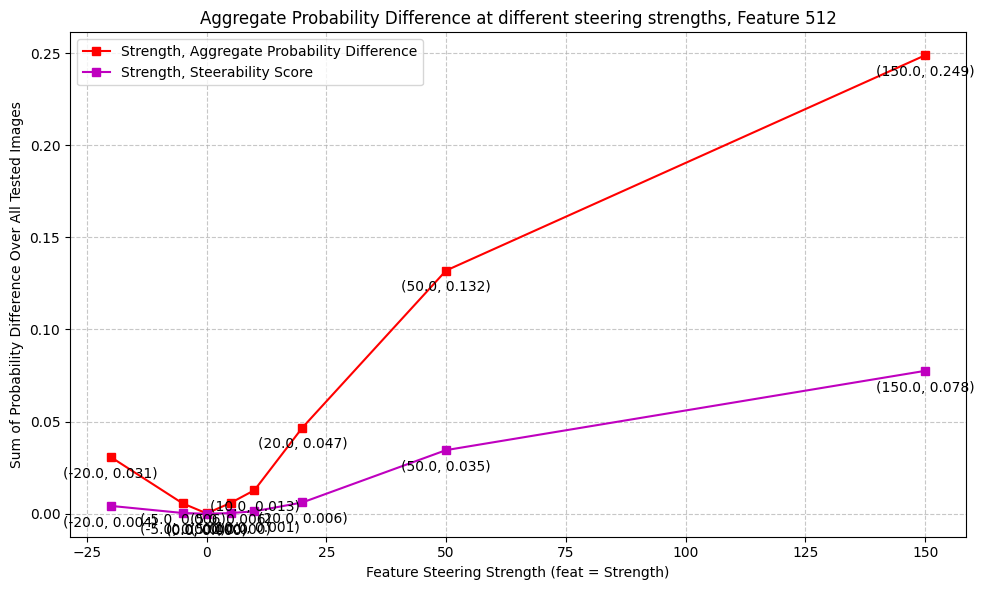

512
150.0 ['pink' 'before' 'measurements' 'red' 'bookmark' 'rear' 'front' 'remote'
 'equipment' 'epson']
150.0 probs tensor([0.1753, 0.0834, 0.0635, 0.0367, 0.0316, 0.0264, 0.0250, 0.0242, 0.0240,
        0.0211], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0619, 0.0043, 0.0026, 0.0025, 0.0008, 0.0006, 0.0004, 0.0004, 0.0004,
        0.0002])
['pink' 'measurements' 'before' 'red' 'bookmark' 'front' 'rear' 'epson'
 'remote' 'equipment']


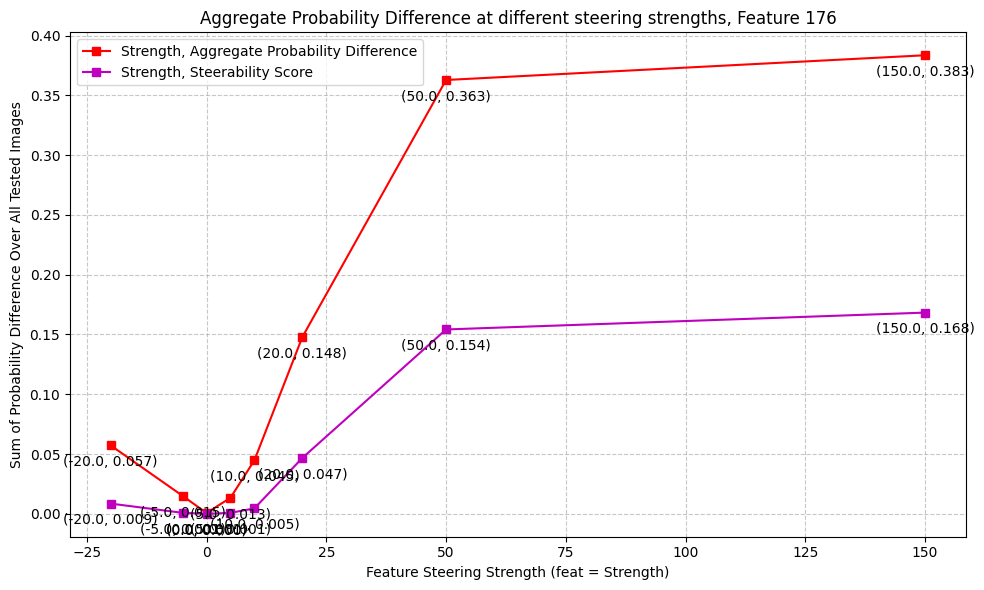

176
150.0 ['site' 'listings' 'field' 'rear' 'landscape' 'view' 'certificate'
 'location' 'buildings' 'lake']
150.0 probs tensor([0.4624, 0.0732, 0.0709, 0.0427, 0.0188, 0.0174, 0.0151, 0.0151, 0.0151,
        0.0135], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.1471, 0.0068, 0.0062, 0.0020, 0.0005, 0.0004, 0.0004, 0.0003, 0.0003,
        0.0002])
['site' 'listings' 'field' 'rear' 'landscape' 'view' 'location'
 'buildings' 'certificate' 'specifications']


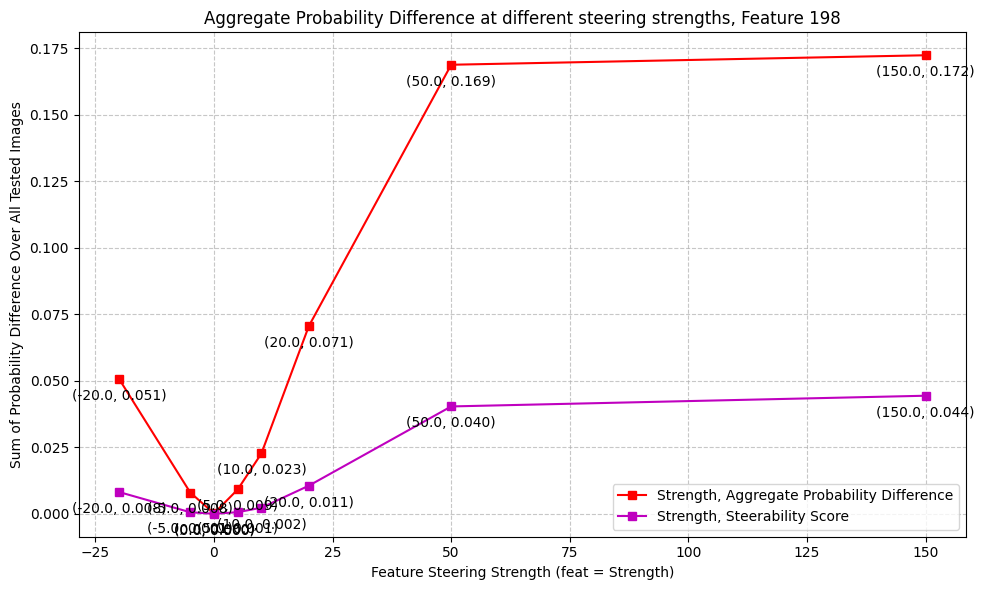

198
150.0 ['split' 'sd' 'express' 'roberts' 'sp' 'harris' 'leads' 'epinions'
 'executive' 'northwest']
150.0 probs tensor([0.2039, 0.1058, 0.0173, 0.0162, 0.0154, 0.0136, 0.0121, 0.0118, 0.0101,
        0.0082], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([2.9680e-02, 9.8265e-03, 3.7890e-04, 2.9926e-04, 1.9026e-04, 1.8669e-04,
        1.4368e-04, 1.3517e-04, 1.1479e-04, 5.1405e-05])
['split' 'sd' 'express' 'roberts' 'sp' 'executive' 'leads' 'harris'
 'northwest' 'steve']


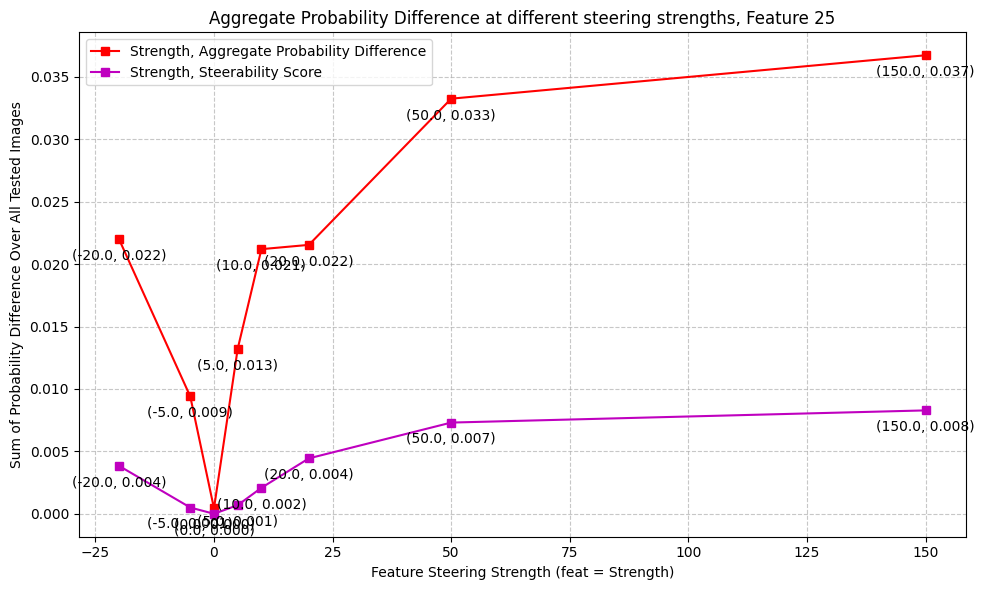

25
150.0 ['bluetooth' 'raw' 'ha' 'cars' 'filters' 'dutch' 'virgin' 'mini' 'de'
 'cooling']
150.0 probs tensor([0.0350, 0.0262, 0.0252, 0.0246, 0.0212, 0.0169, 0.0107, 0.0094, 0.0093,
        0.0092], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([1.3497e-03, 7.7793e-04, 7.3020e-04, 5.7323e-04, 3.0658e-04, 2.6093e-04,
        1.0369e-04, 8.4254e-05, 8.3448e-05, 8.2436e-05])
['bluetooth' 'ha' 'raw' 'filters' 'dutch' 'cars' 'virgin' 'johnson'
 'cooling' 'de']


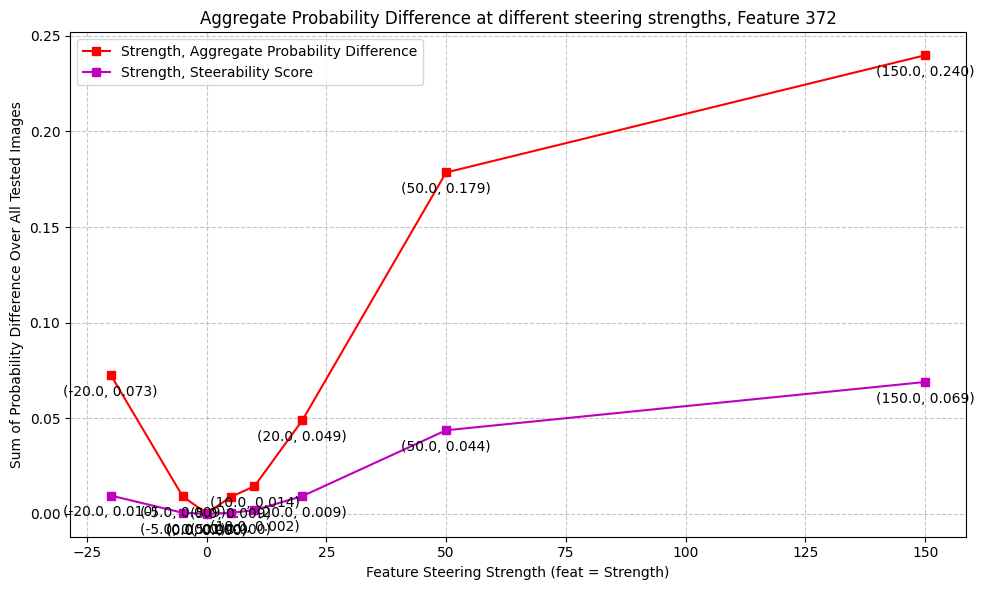

372
150.0 ['glass' 'glasses' 'laser' 'mesh' 'back' 'spread' 'neck' 'each' 'breasts'
 'clear']
150.0 probs tensor([0.2259, 0.0516, 0.0466, 0.0466, 0.0188, 0.0173, 0.0159, 0.0115, 0.0106,
        0.0093], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([5.7526e-02, 2.8407e-03, 2.3408e-03, 1.6535e-03, 3.3564e-04, 2.5236e-04,
        1.9642e-04, 1.2045e-04, 9.7184e-05, 9.0624e-05])
['glass' 'laser' 'glasses' 'mesh' 'back' 'spread' 'neck' 'breast'
 'breasts' 'each']


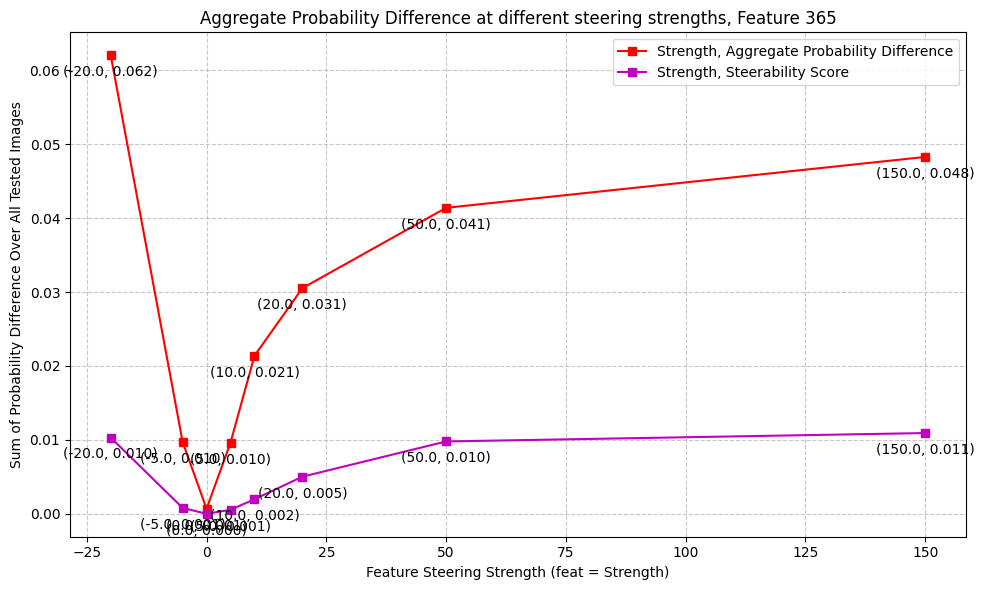

365
150.0 ['orders' 'discovery' 'mid' 'order' 'bird' 'birds' 'dish' 'mercury' 'pin'
 'baker']
150.0 probs tensor([0.0501, 0.0456, 0.0396, 0.0204, 0.0190, 0.0190, 0.0141, 0.0113, 0.0111,
        0.0111], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0023, 0.0015, 0.0014, 0.0004, 0.0003, 0.0003, 0.0002, 0.0001, 0.0001,
        0.0001])
['orders' 'mid' 'discovery' 'order' 'dish' 'birds' 'bird' 'launch'
 'directory' 'baker']


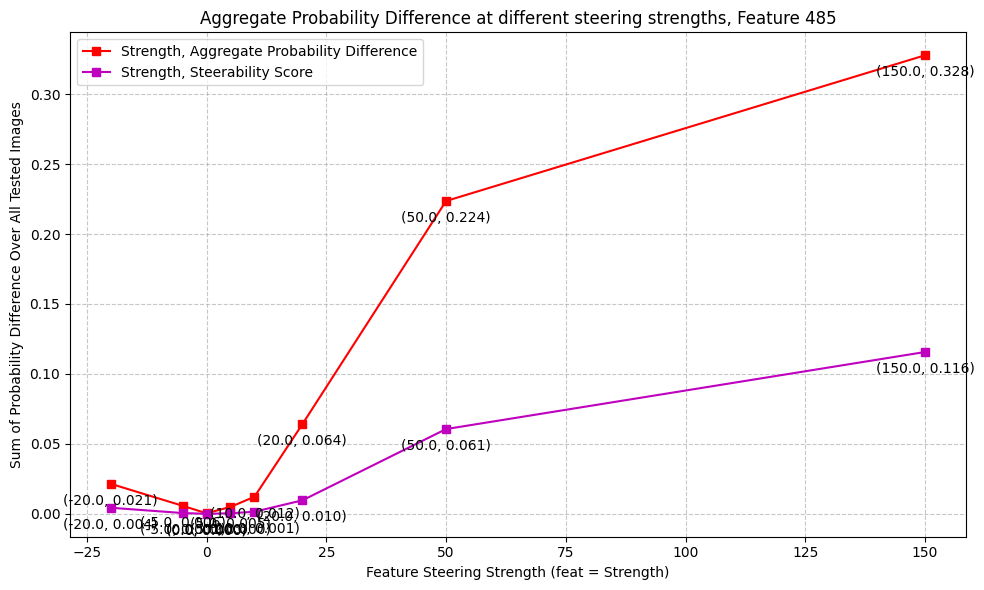

485
150.0 ['stainless' 'walker' 'rubber' 'plates' 'reliable' 'reliability'
 'flexible' 'table' 'stability' 'laptops']
150.0 probs tensor([0.3390, 0.0485, 0.0249, 0.0249, 0.0207, 0.0193, 0.0147, 0.0118, 0.0086,
        0.0085], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([1.0748e-01, 2.7824e-03, 6.3161e-04, 5.7324e-04, 4.3322e-04, 2.1987e-04,
        9.9440e-05, 9.5710e-05, 7.3270e-05, 6.8137e-05])
['stainless' 'walker' 'plates' 'reliable' 'reliability' 'rubber'
 'flexible' 'table' 'stability' 'laptops']


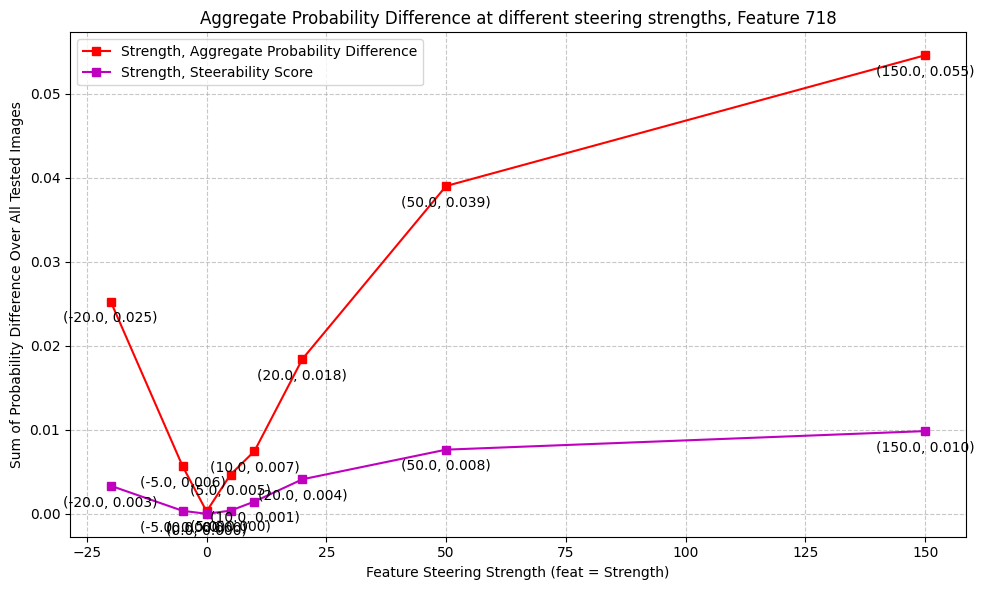

718
150.0 ['configuration' 'comparison' 'si' 'configure' 'specifications'
 'respective' 'nt' 'red' 'got' 'specification']
150.0 probs tensor([0.0701, 0.0355, 0.0202, 0.0159, 0.0150, 0.0138, 0.0136, 0.0129, 0.0125,
        0.0122], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0030, 0.0009, 0.0003, 0.0003, 0.0003, 0.0003, 0.0002, 0.0002, 0.0002,
        0.0002])
['configuration' 'comparison' 'si' 'red' 'specifications' 'configure'
 'subjects' 'specification' 'nt' 'respective']


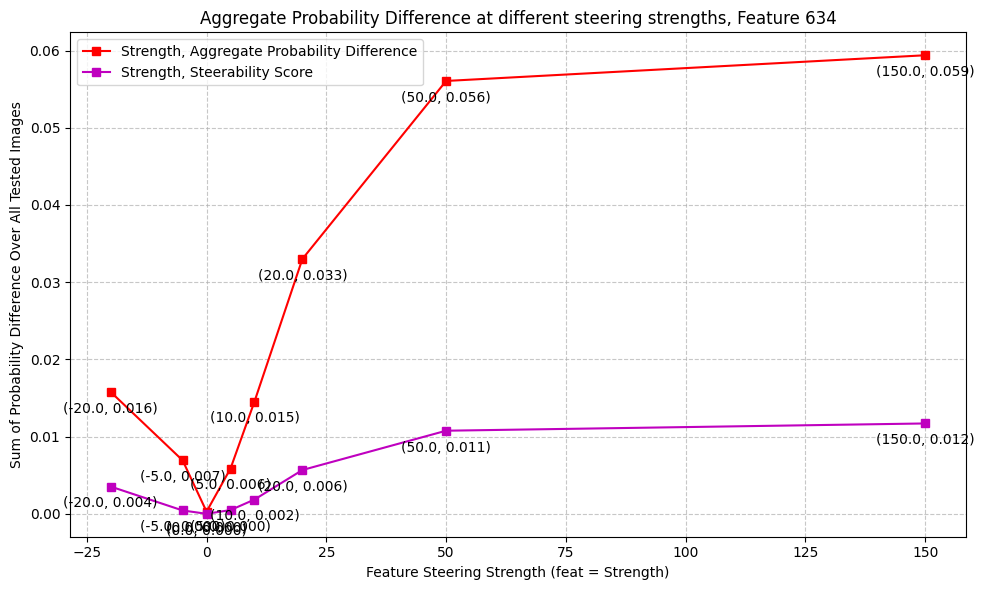

634
150.0 ['walker' 'rear' 'leg' 'patches' 'pin' 'toe' 'yard' 'site' 'boot' 'front']
150.0 probs tensor([0.0548, 0.0392, 0.0322, 0.0305, 0.0239, 0.0171, 0.0151, 0.0146, 0.0141,
        0.0133], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0035, 0.0012, 0.0010, 0.0007, 0.0006, 0.0002, 0.0002, 0.0002, 0.0002,
        0.0002])
['walker' 'rear' 'leg' 'patches' 'pin' 'toe' 'cam' 'front' 'yard' 'boot']


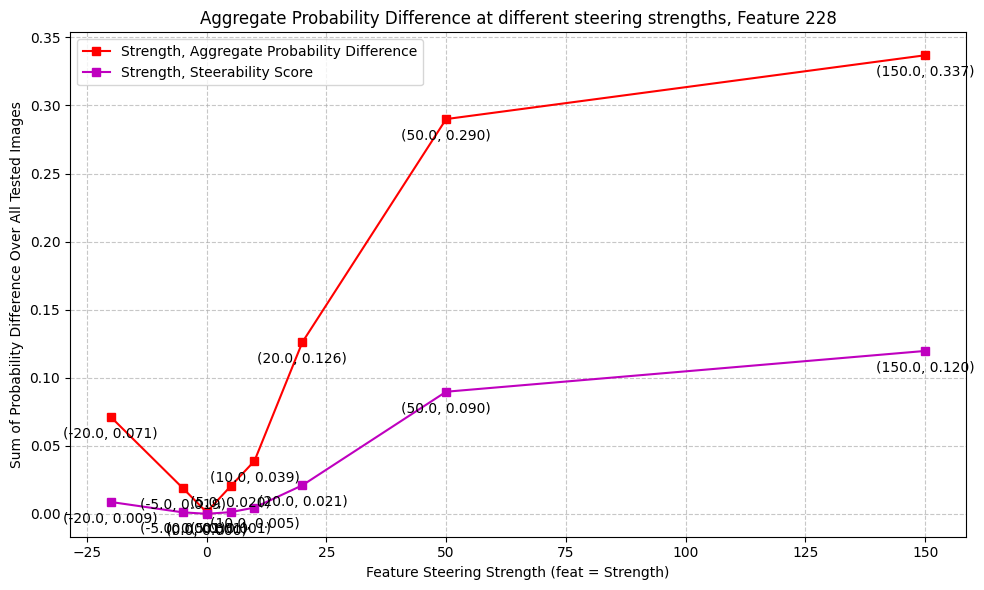

228
150.0 ['rear' 'back' 'packaging' 'quickly' 'russell' 'research' 'recipe'
 'checking' 'receipt' 'binding']
150.0 probs tensor([0.3821, 0.0396, 0.0198, 0.0123, 0.0102, 0.0095, 0.0095, 0.0090, 0.0084,
        0.0079], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([1.1349e-01, 1.7301e-03, 5.4251e-04, 1.4289e-04, 1.1916e-04, 1.1472e-04,
        9.3033e-05, 7.5194e-05, 6.3692e-05, 5.5881e-05])
['rear' 'back' 'packaging' 'quickly' 'research' 'russell' 'checking'
 'receipt' 'recipe' 'binding']


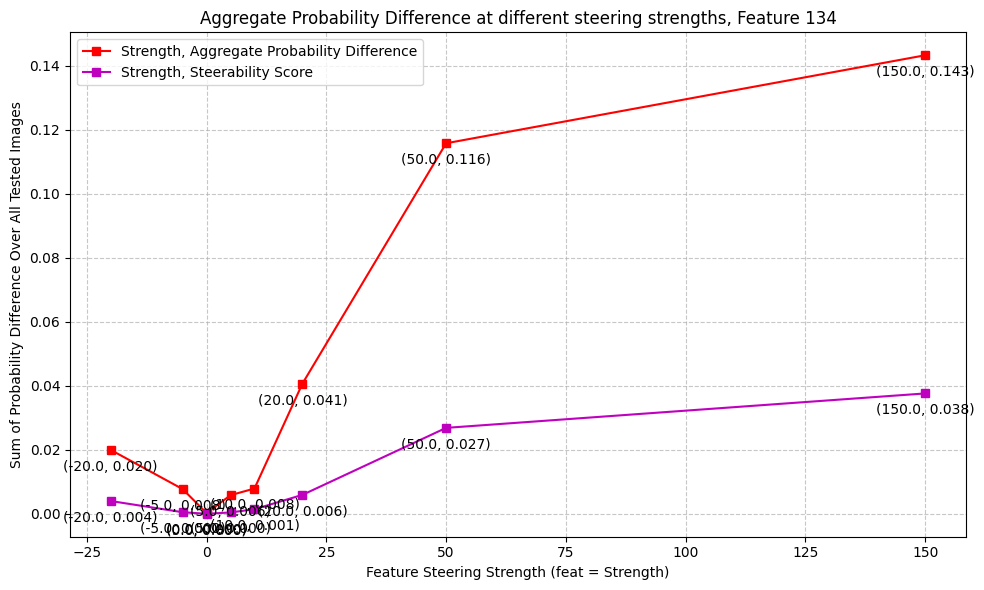

134
150.0 ['fans' 'fan' 'wheels' 'womens' 'mesh' 'lights' 'result' 'motor'
 'specifications' 'night']
150.0 probs tensor([0.1219, 0.0689, 0.0585, 0.0571, 0.0377, 0.0162, 0.0126, 0.0092, 0.0091,
        0.0086], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([2.0516e-02, 8.2138e-03, 2.3341e-03, 1.2158e-03, 1.1398e-03, 3.3587e-04,
        1.3356e-04, 1.0507e-04, 7.0785e-05, 6.6487e-05])
['fans' 'fan' 'womens' 'wheels' 'mesh' 'lights' 'result' 'specifications'
 'night' 'motor']


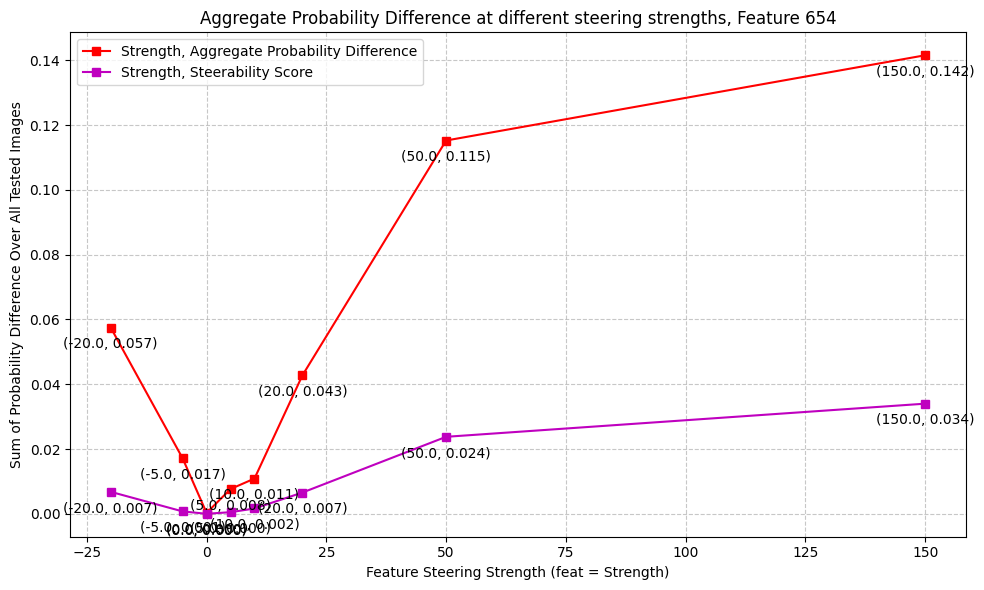

654
150.0 ['epson' 'thumbnail' 'dell' 'desktop' 'poster' 'video' 'skip' 'livecam'
 'samsung' 'online']
150.0 probs tensor([0.1453, 0.0737, 0.0340, 0.0309, 0.0226, 0.0200, 0.0182, 0.0152, 0.0139,
        0.0113], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0200, 0.0071, 0.0008, 0.0007, 0.0005, 0.0004, 0.0004, 0.0002, 0.0001,
        0.0001])
['epson' 'thumbnail' 'dell' 'desktop' 'video' 'poster' 'skip' 'livecam'
 'online' 'cumshot']


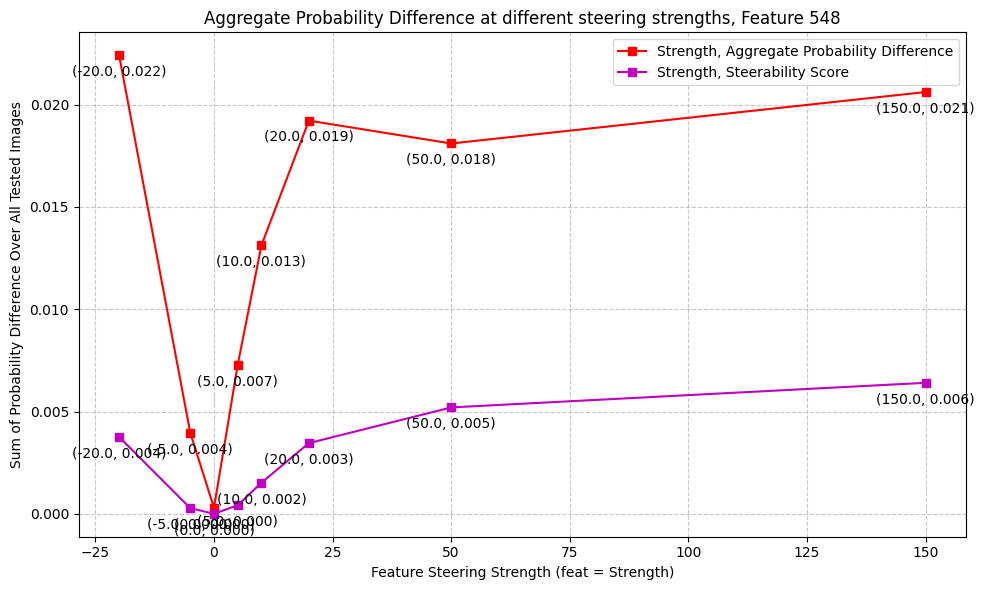

548
150.0 ['mens' 'womens' 'interior' 'shown' 'font' 'bottle' 'blank' 'figure'
 'opened' 'van']
150.0 probs tensor([0.0250, 0.0201, 0.0198, 0.0187, 0.0169, 0.0160, 0.0147, 0.0137, 0.0106,
        0.0099], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([4.2505e-04, 4.2223e-04, 3.3690e-04, 3.0629e-04, 2.5643e-04, 2.2120e-04,
        2.2083e-04, 2.0722e-04, 8.4622e-05, 8.1543e-05])
['shown' 'mens' 'interior' 'womens' 'bottle' 'figure' 'blank' 'font'
 'wilson' 'group']


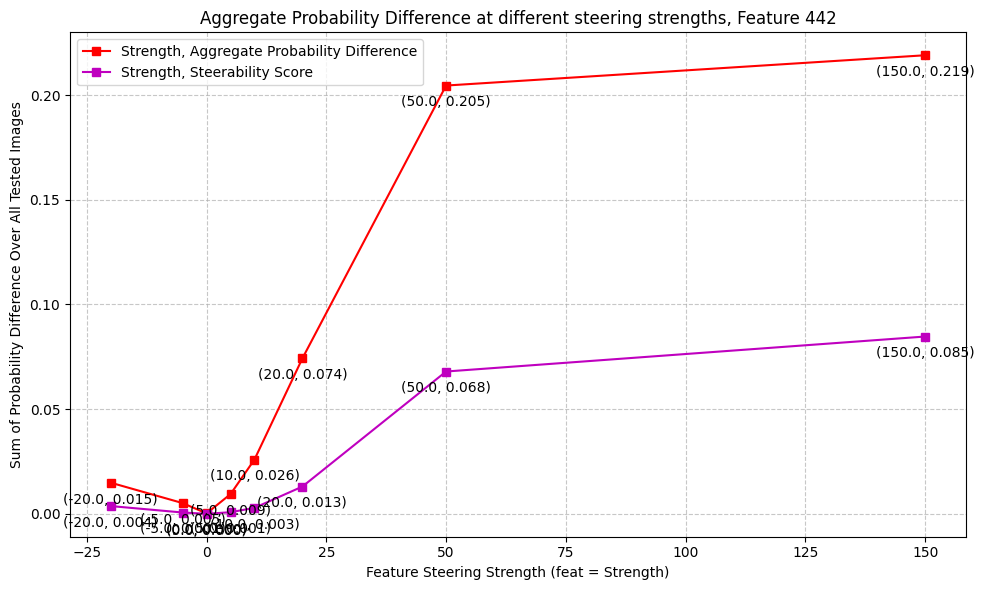

442
150.0 ['guestbook' 'printer' 'notebook' 'printable' 'journal' 'printing'
 'biography' 'publisher' 'hardcover' 'book']
150.0 probs tensor([0.2162, 0.1594, 0.0753, 0.0568, 0.0443, 0.0275, 0.0235, 0.0175, 0.0168,
        0.0139], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0480, 0.0192, 0.0057, 0.0036, 0.0018, 0.0010, 0.0007, 0.0004, 0.0003,
        0.0002])
['guestbook' 'printer' 'notebook' 'printable' 'journal' 'printing'
 'biography' 'publisher' 'hardcover' 'book']


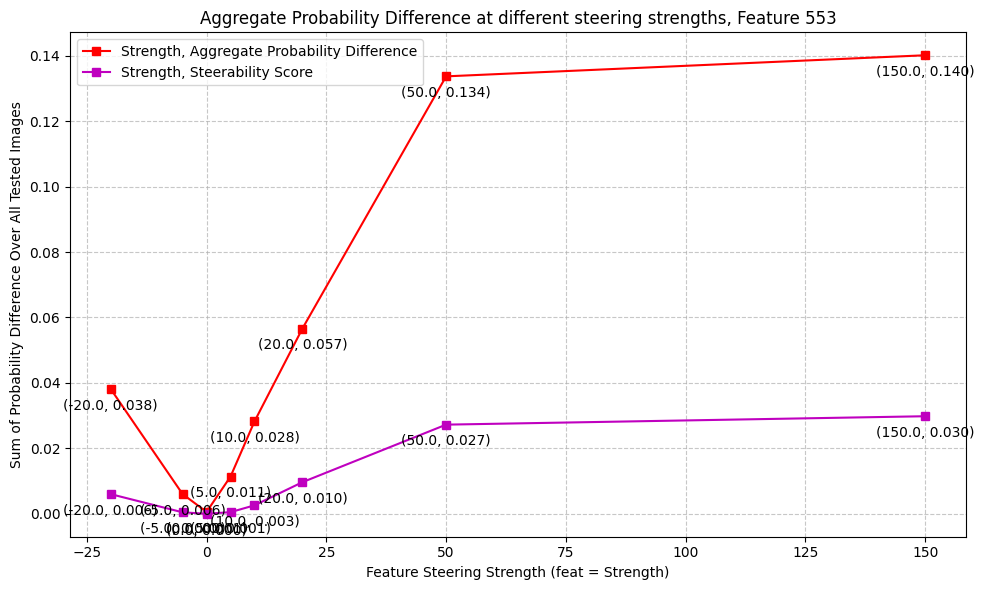

553
150.0 ['jones' 'jose' 'available' 'lawrence' 'hurricane' 'asp' 'anywhere'
 'owner' 'pan' 'attendance']
150.0 probs tensor([0.1375, 0.0475, 0.0439, 0.0397, 0.0223, 0.0188, 0.0172, 0.0112, 0.0094,
        0.0083], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([1.9633e-02, 1.9031e-03, 1.8912e-03, 1.8610e-03, 3.2929e-04, 2.3870e-04,
        1.6927e-04, 1.2699e-04, 1.0356e-04, 8.2554e-05])
['jones' 'available' 'jose' 'lawrence' 'hurricane' 'anywhere' 'asp'
 'owner' 'pan' 'attendance']


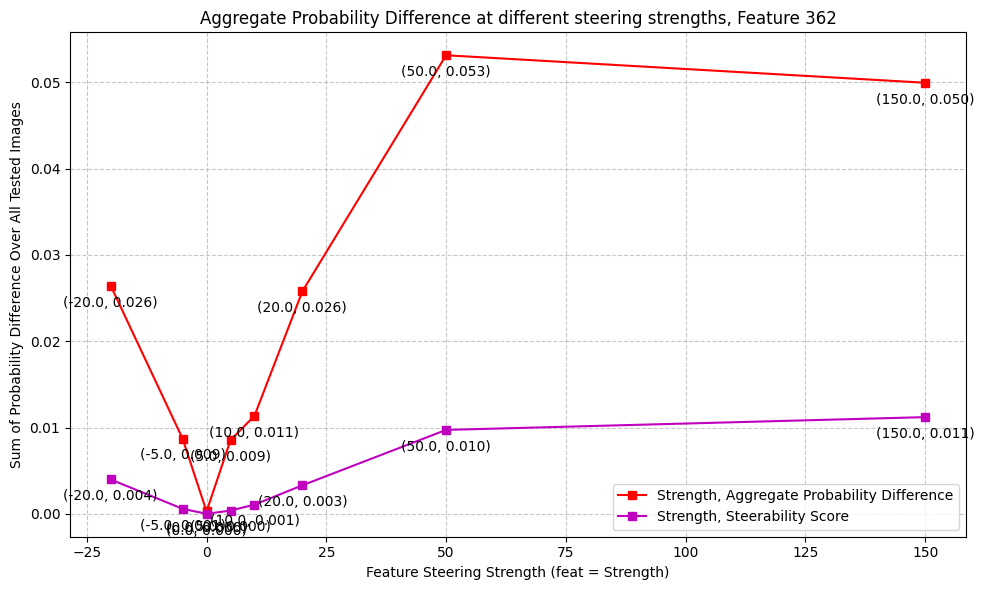

362
150.0 ['nj' 'roll' 'symbol' 'short' 'shorts' 'vermont' 'ri' 'shirts' 'shirt'
 'ny']
150.0 probs tensor([0.0654, 0.0568, 0.0361, 0.0175, 0.0165, 0.0155, 0.0154, 0.0147, 0.0121,
        0.0120], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0025, 0.0020, 0.0007, 0.0006, 0.0003, 0.0003, 0.0003, 0.0002, 0.0002,
        0.0002])
['nj' 'roll' 'symbol' 'vermont' 'short' 'shirts' 'ri' 'shirt' 'shorts'
 'null']


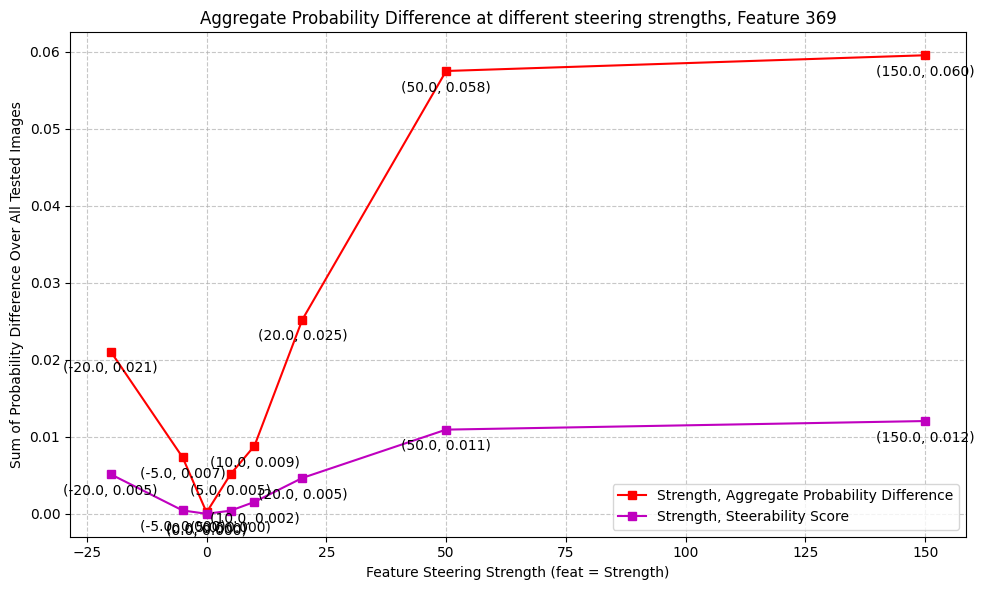

369
150.0 ['scott' 'strip' 'womens' 'williams' 'throw' 'thongs' 'antique' 'tie'
 'johnson' 'business']
150.0 probs tensor([0.0628, 0.0585, 0.0248, 0.0199, 0.0187, 0.0186, 0.0183, 0.0174, 0.0147,
        0.0138], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0035, 0.0019, 0.0005, 0.0005, 0.0004, 0.0004, 0.0003, 0.0002, 0.0002,
        0.0001])
['scott' 'strip' 'williams' 'womens' 'antique' 'throw' 'johnson' 'tie'
 'business' 'rob']


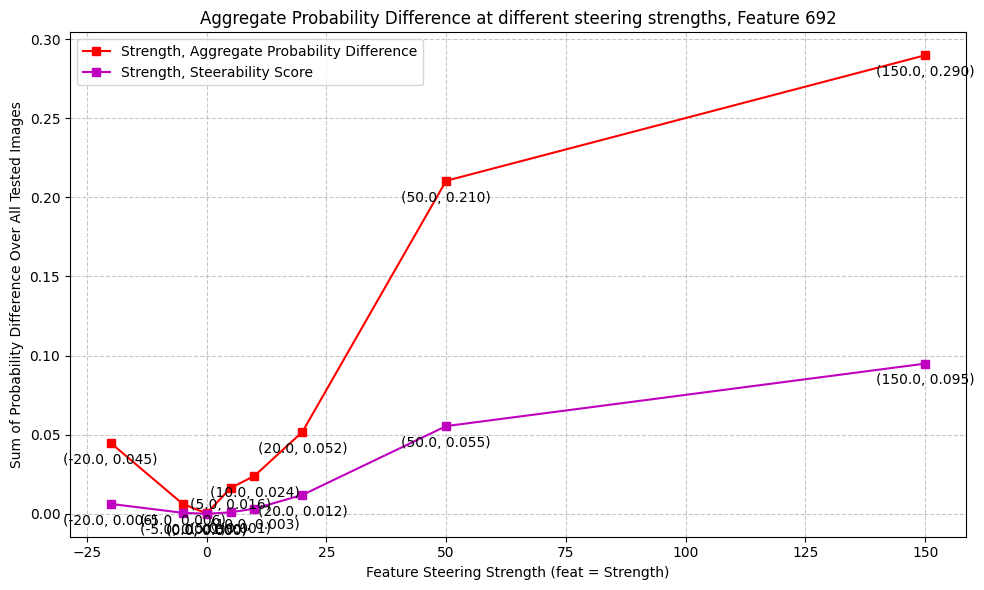

692
150.0 ['thumbnail' 'homepage' 'product' 'belt' 'packaging' 'cluster' 'image'
 'website' 'picture' 'charger']
150.0 probs tensor([0.2679, 0.0455, 0.0455, 0.0301, 0.0223, 0.0191, 0.0171, 0.0169, 0.0141,
        0.0132], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0840, 0.0024, 0.0023, 0.0006, 0.0004, 0.0003, 0.0003, 0.0002, 0.0002,
        0.0002])
['thumbnail' 'product' 'homepage' 'packaging' 'cluster' 'image' 'website'
 'picture' 'belt' 'wallpaper']


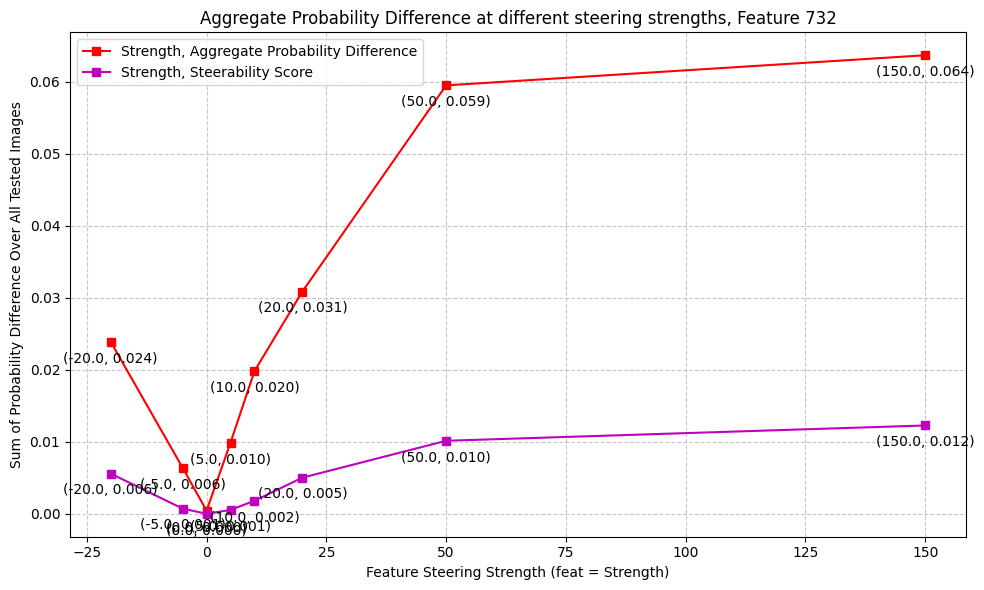

732
150.0 ['ann' 'front' 'land' 'pounds' 'area' 'lamp' 'anna' 'plate' 'asia'
 'africa']
150.0 probs tensor([0.0577, 0.0367, 0.0246, 0.0231, 0.0224, 0.0207, 0.0190, 0.0170, 0.0145,
        0.0142], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0041, 0.0016, 0.0004, 0.0004, 0.0004, 0.0003, 0.0003, 0.0002, 0.0002,
        0.0002])
['ann' 'front' 'area' 'lamp' 'anna' 'land' 'plate' 'pounds' 'brazil'
 'asia']


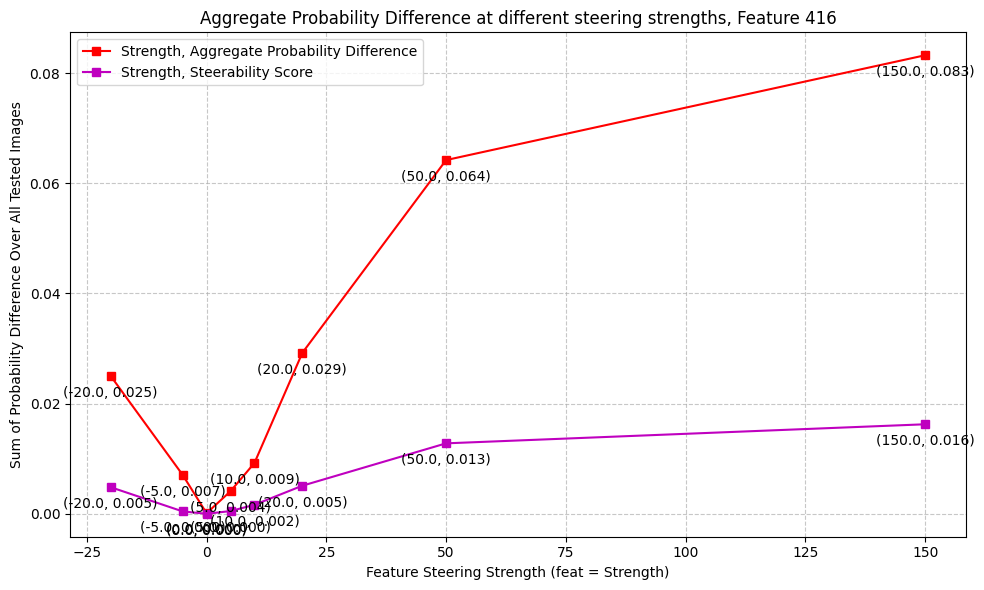

416
150.0 ['units' 'covers' 'models' 'annual' 'back' 'recently' 'belgium' 'initial'
 'bound' 'china']
150.0 probs tensor([0.0765, 0.0433, 0.0367, 0.0230, 0.0200, 0.0180, 0.0148, 0.0132, 0.0101,
        0.0100], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([6.9299e-03, 1.9078e-03, 1.7202e-03, 4.4007e-04, 4.3199e-04, 3.4887e-04,
        2.7464e-04, 1.2553e-04, 8.9549e-05, 8.7414e-05])
['units' 'models' 'covers' 'annual' 'back' 'recently' 'belgium' 'initial'
 'br' 'china']


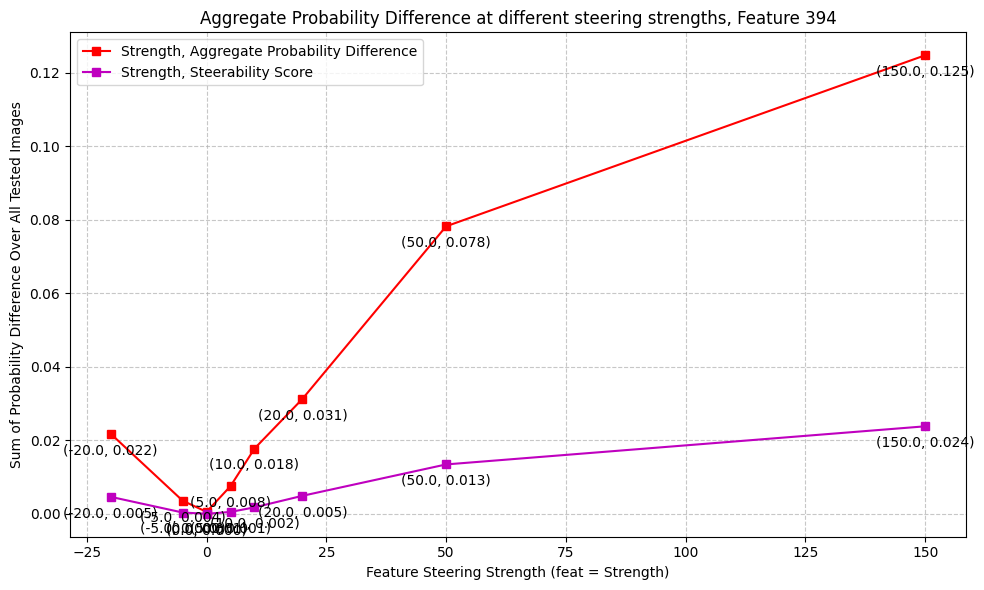

394
150.0 ['front' 'thumbnail' 'sort' 'colour' 'printers' 'cards' 'photo' 'case'
 'poster' 'listings']
150.0 probs tensor([0.1197, 0.0423, 0.0215, 0.0195, 0.0168, 0.0155, 0.0136, 0.0134, 0.0133,
        0.0118], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0156, 0.0022, 0.0005, 0.0004, 0.0003, 0.0002, 0.0002, 0.0002, 0.0001,
        0.0001])
['front' 'thumbnail' 'colour' 'sort' 'cards' 'printers' 'case' 'lounge'
 'poster' 'browse']


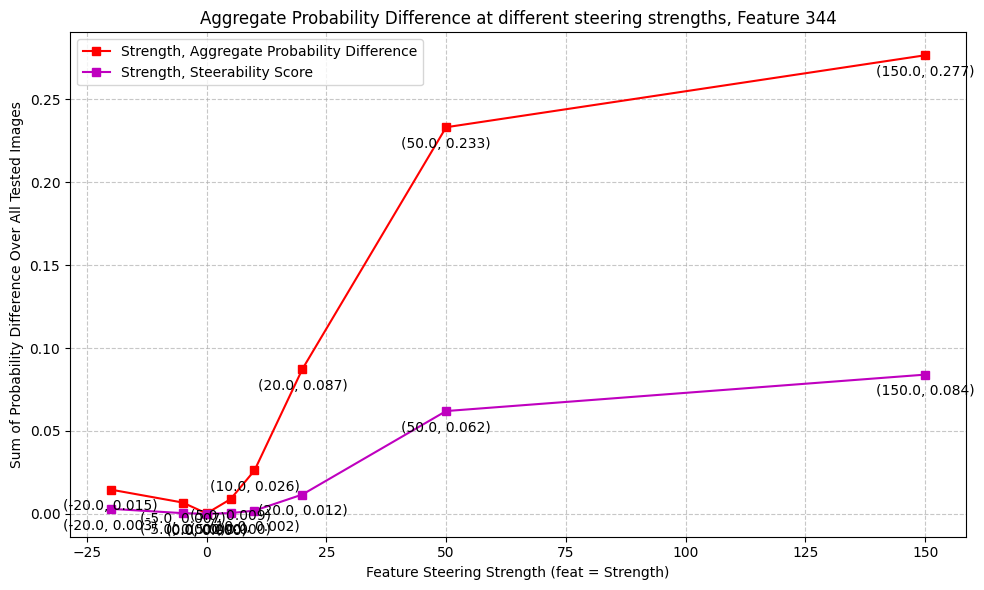

344
150.0 ['kits' 'kit' 'purple' 'pack' 'patches' 'cap' 'major' 'photo' 'patch'
 'pair']
150.0 probs tensor([0.2613, 0.0552, 0.0259, 0.0234, 0.0141, 0.0114, 0.0110, 0.0100, 0.0093,
        0.0084], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([7.6506e-02, 2.6784e-03, 6.3630e-04, 4.7280e-04, 1.7585e-04, 1.2500e-04,
        1.2272e-04, 7.2863e-05, 7.1678e-05, 4.7986e-05])
['kits' 'kit' 'pack' 'purple' 'cap' 'major' 'patches' 'front' 'patch'
 'photo']


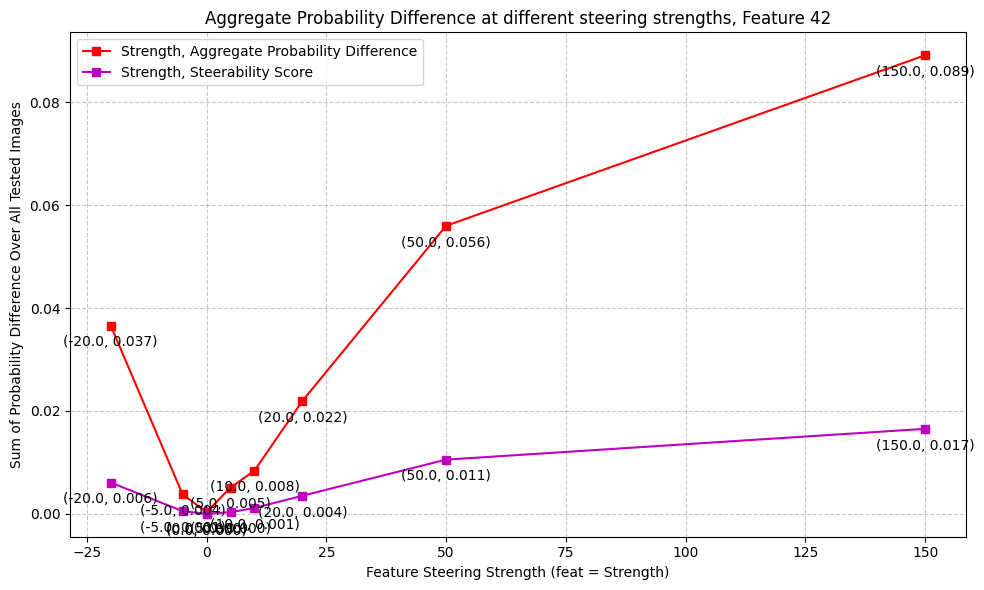

42
150.0 ['participation' 'racing' 'participants' 'forum' 'identification'
 'partners' 'external' 'partnership' 'partner' 'receiving']
150.0 probs tensor([0.0901, 0.0403, 0.0266, 0.0254, 0.0226, 0.0221, 0.0183, 0.0179, 0.0139,
        0.0138], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0079, 0.0013, 0.0008, 0.0006, 0.0004, 0.0003, 0.0003, 0.0003, 0.0002,
        0.0002])
['participation' 'racing' 'forum' 'participants' 'identification'
 'receiving' 'partners' 'external' 'partnership' 'functional']


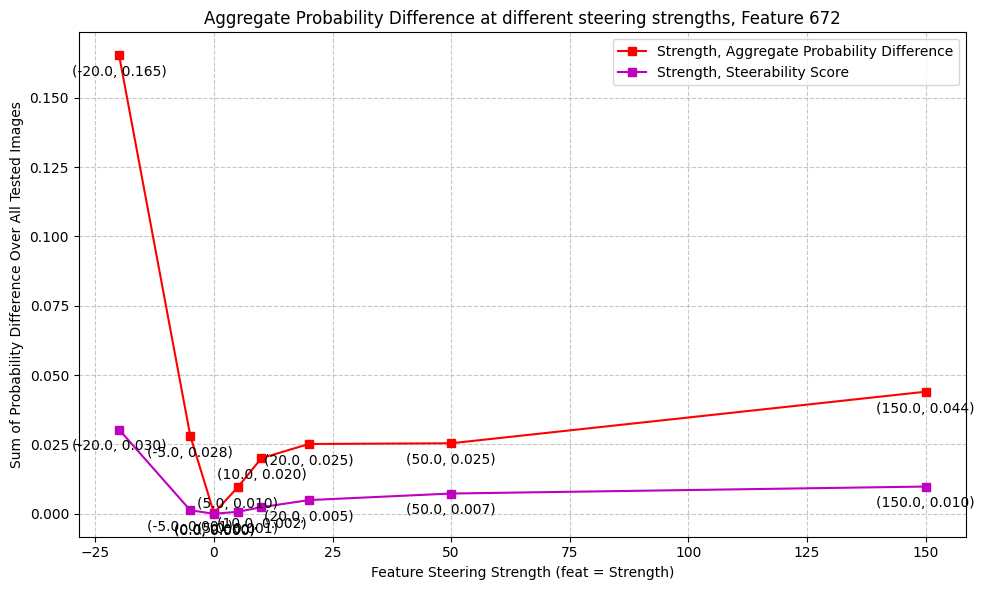

672
150.0 ['plates' 'desk' 'sizes' 'stamps' 'islands' 'commission' 'lots' 'set'
 'sets' 'milfs']
150.0 probs tensor([0.0444, 0.0374, 0.0230, 0.0230, 0.0194, 0.0193, 0.0163, 0.0154, 0.0146,
        0.0128], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0019, 0.0015, 0.0006, 0.0005, 0.0005, 0.0002, 0.0002, 0.0002, 0.0002,
        0.0002])
['plates' 'desk' 'sizes' 'stamps' 'commission' 'lots' 'milfs' 'islands'
 'sets' 'engines']


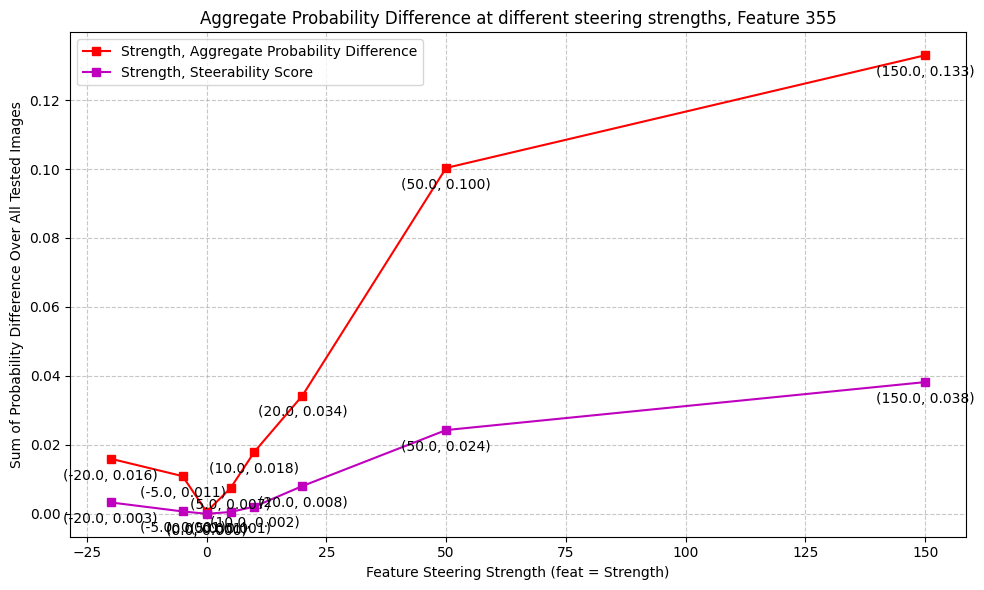

355
150.0 ['pink' 'notebooks' 'patterns' 'newsletters' 'bags' 'boards' 'comparison'
 'files' 'laptops' 'batteries']
150.0 probs tensor([0.0936, 0.0839, 0.0542, 0.0449, 0.0412, 0.0306, 0.0304, 0.0268, 0.0244,
        0.0226], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0177, 0.0072, 0.0023, 0.0019, 0.0013, 0.0009, 0.0007, 0.0006, 0.0006,
        0.0004])
['pink' 'notebooks' 'newsletters' 'patterns' 'bags' 'files' 'boards'
 'comparison' 'laptops' 'batteries']


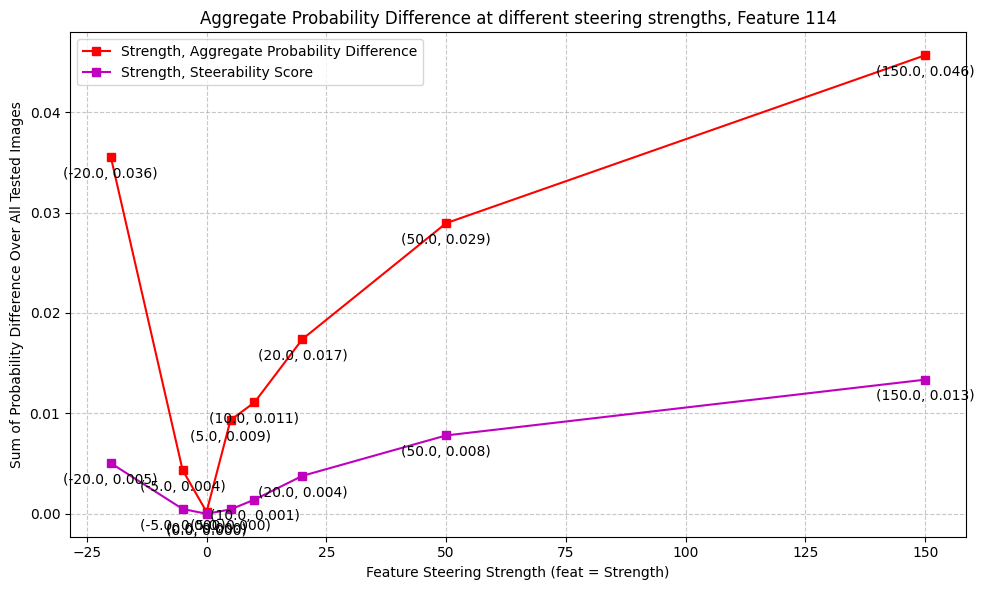

114
150.0 ['recipe' 'horses' 'plans' 'printable' 'boats' 'items' 'sizes' 'recipes'
 'kits' 'resulting']
150.0 probs tensor([0.0485, 0.0467, 0.0418, 0.0366, 0.0321, 0.0274, 0.0219, 0.0163, 0.0139,
        0.0125], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0021, 0.0016, 0.0016, 0.0015, 0.0008, 0.0005, 0.0004, 0.0003, 0.0002,
        0.0002])
['recipe' 'printable' 'plans' 'horses' 'items' 'sizes' 'boats' 'recipes'
 'trees' 'arrangements']


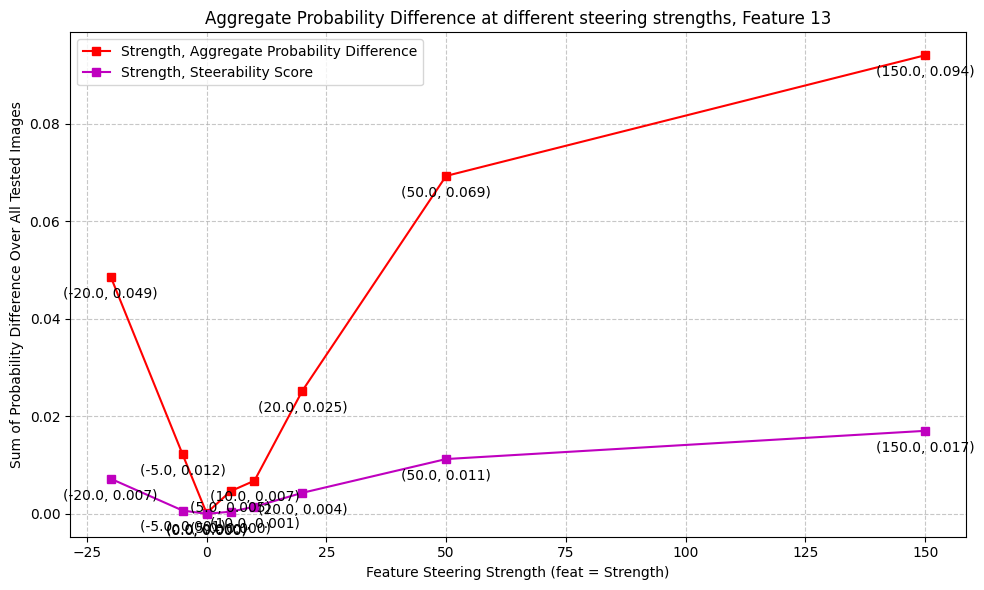

13
150.0 ['font' 'script' 'si' 'egypt' 'border' 'scripts' 'stone' 'angels' 'edward'
 'sort']
150.0 probs tensor([0.0982, 0.0659, 0.0288, 0.0158, 0.0145, 0.0138, 0.0110, 0.0107, 0.0103,
        0.0098], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0088, 0.0024, 0.0007, 0.0003, 0.0002, 0.0001, 0.0001, 0.0001, 0.0001,
        0.0001])
['font' 'script' 'si' 'egypt' 'angels' 'edward' 'border' 'scripts' 'large'
 'sort']


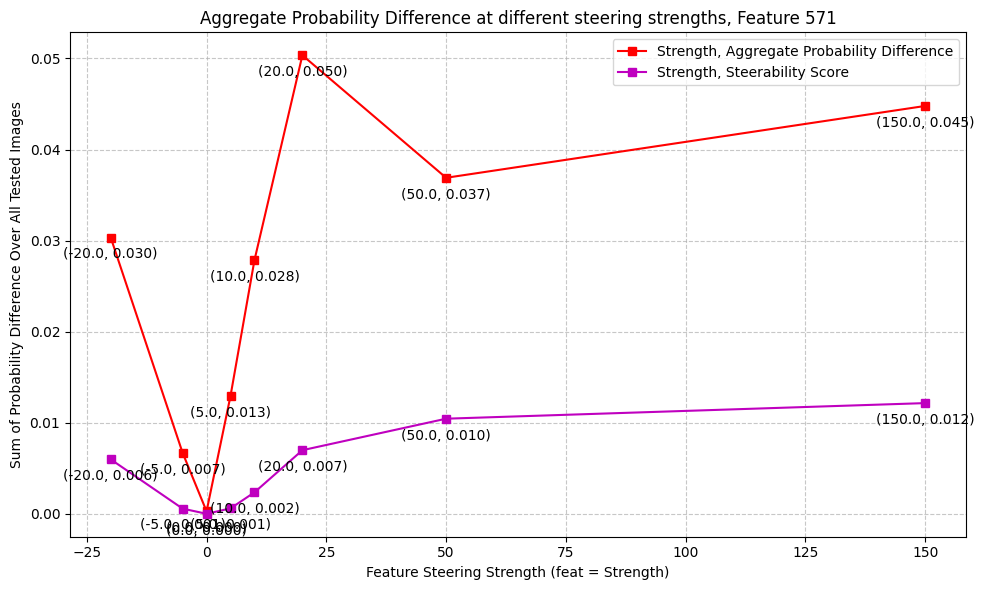

571
150.0 ['fl' 'austria' 'front' 'florida' 'guinea' 'pet' 'mi' 'thumbnail' 'silver'
 'su']
150.0 probs tensor([0.0489, 0.0470, 0.0405, 0.0294, 0.0242, 0.0225, 0.0215, 0.0193, 0.0190,
        0.0170], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0020, 0.0019, 0.0015, 0.0005, 0.0005, 0.0005, 0.0003, 0.0003, 0.0003,
        0.0002])
['front' 'austria' 'fl' 'mi' 'thumbnail' 'pet' 'su' 'silver' 'guinea'
 'florida']


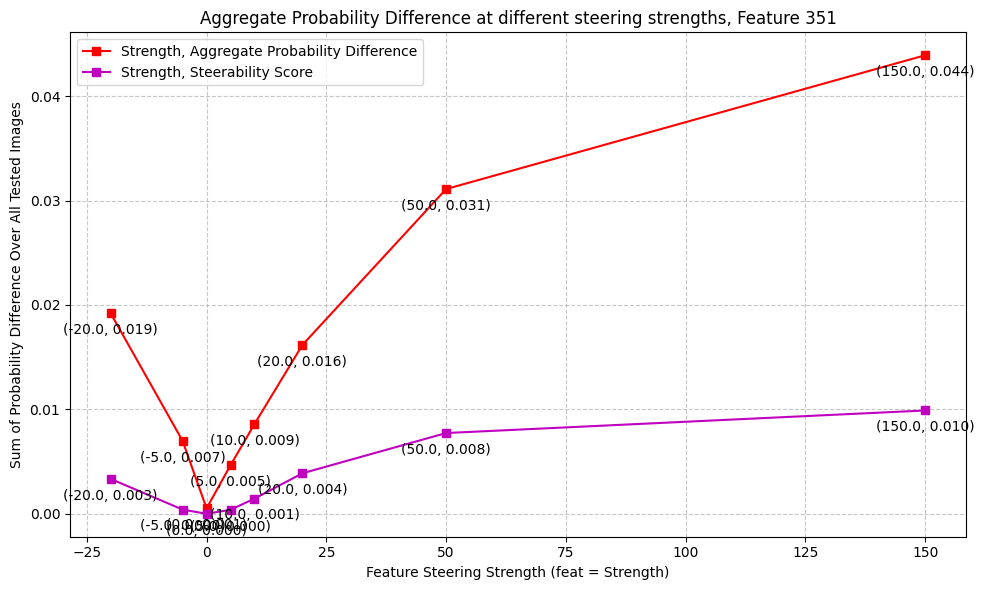

351
150.0 ['toshiba' 'stainless' 'era' 'silver' 'rs' 'swiss' 'z' 'cr' 'china'
 'extra']
150.0 probs tensor([0.0460, 0.0419, 0.0231, 0.0204, 0.0187, 0.0169, 0.0164, 0.0154, 0.0131,
        0.0111], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0019, 0.0016, 0.0008, 0.0004, 0.0003, 0.0002, 0.0002, 0.0002, 0.0001,
        0.0001])
['toshiba' 'stainless' 'era' 'swiss' 'silver' 'rs' 'cr' 'china' 'z'
 'extra']


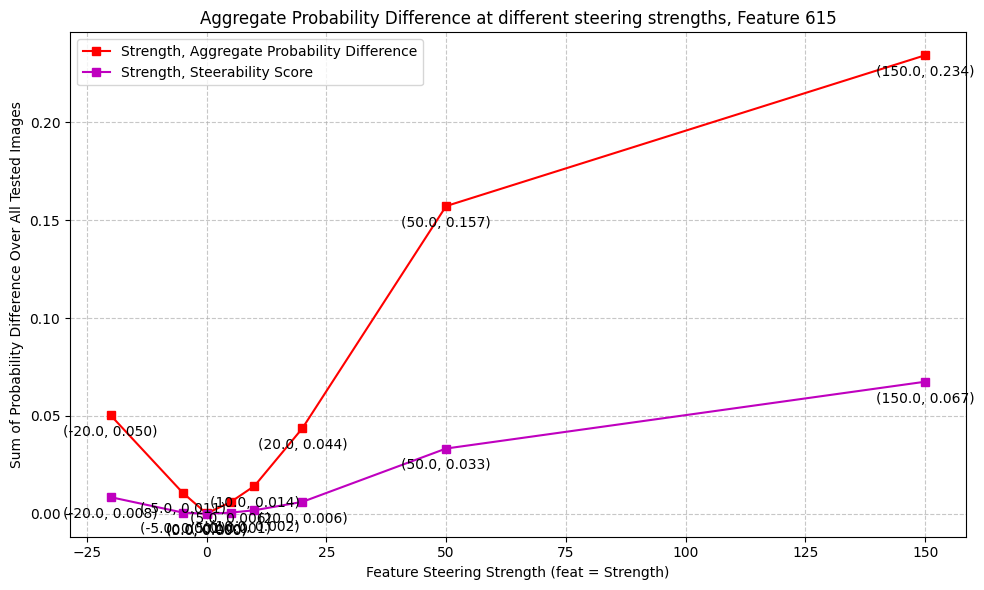

615
150.0 ['patches' 'patch' 'ft' 'german' 'drawing' 'da' 'signature' 'drawn'
 'signed' 'aa']
150.0 probs tensor([0.2826, 0.0876, 0.0166, 0.0150, 0.0124, 0.0123, 0.0121, 0.0120, 0.0112,
        0.0106], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0549, 0.0073, 0.0004, 0.0003, 0.0002, 0.0002, 0.0002, 0.0001, 0.0001,
        0.0001])
['patches' 'patch' 'ft' 'german' 'da' 'aa' 'drawn' 'drawing' 'oh' 'ah']


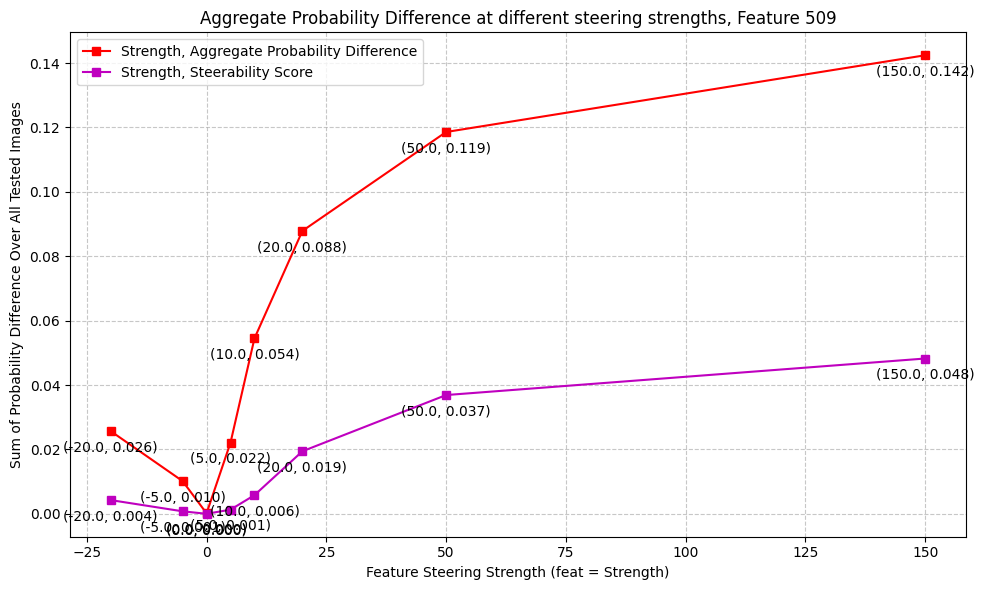

509
150.0 ['clothing' 'phil' 'milfs' 'male' 'files' 'polish' 'epinions' 'pair'
 'mens' 'mining']
150.0 probs tensor([0.1315, 0.0954, 0.0616, 0.0487, 0.0430, 0.0377, 0.0245, 0.0245, 0.0200,
        0.0174], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0203, 0.0146, 0.0037, 0.0021, 0.0018, 0.0008, 0.0003, 0.0003, 0.0003,
        0.0003])
['clothing' 'phil' 'milfs' 'files' 'polish' 'male' 'wholesale' 'ml'
 'dining' 'file']


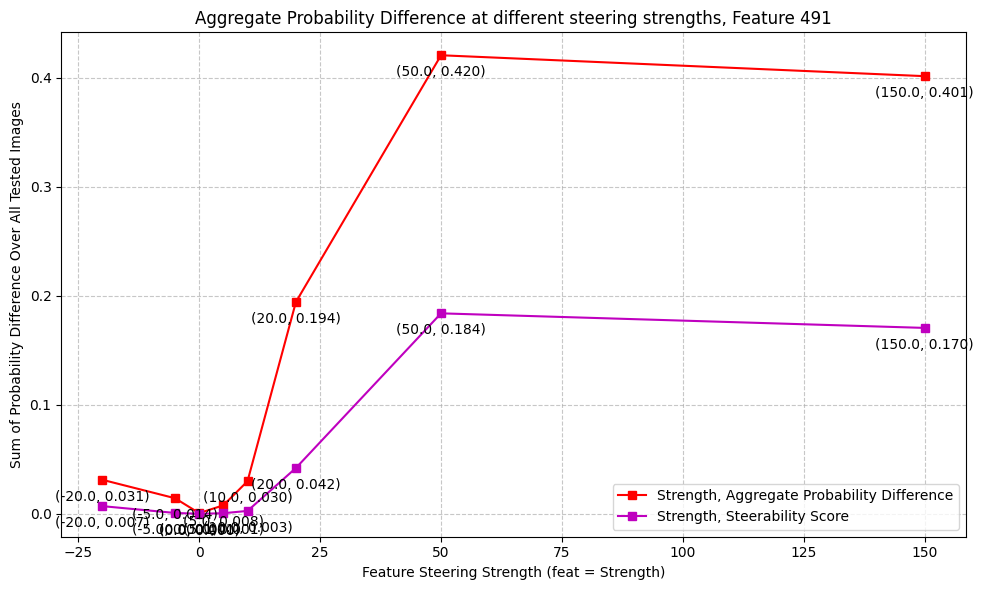

491
150.0 ['jersey' 'womens' 'short' 'shirt' 'menu' 'shorts' 'maps' 'gps' 'shirts'
 'map']
150.0 probs tensor([0.4270, 0.0364, 0.0251, 0.0241, 0.0233, 0.0213, 0.0201, 0.0198, 0.0182,
        0.0175], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.1610, 0.0011, 0.0007, 0.0005, 0.0005, 0.0005, 0.0005, 0.0004, 0.0004,
        0.0003])
['jersey' 'womens' 'shirt' 'short' 'menu' 'gps' 'maps' 'map' 'shirts'
 'document']


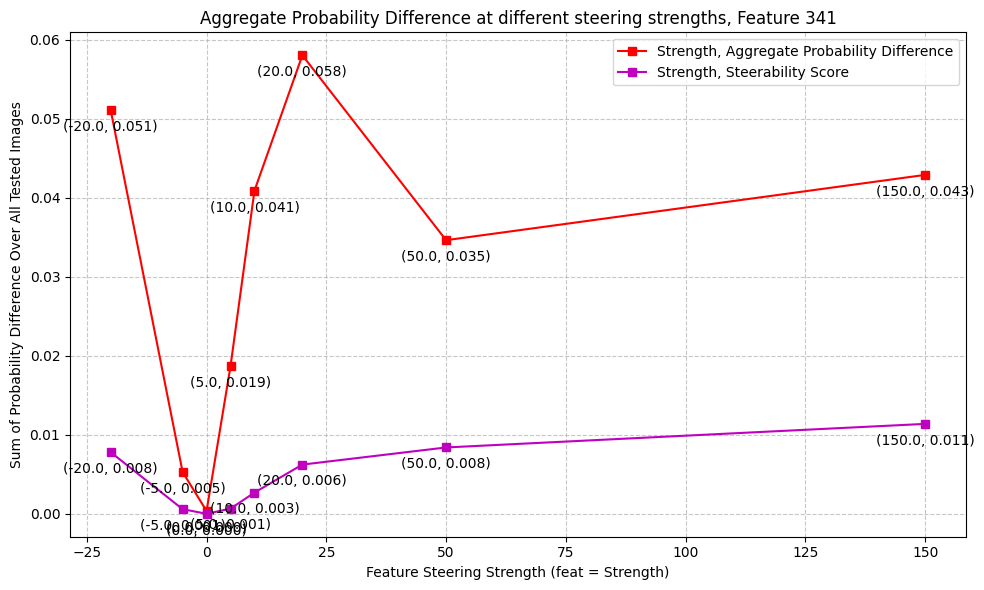

341
150.0 ['mobile' 'ringtone' 'rf' 'wooden' 'for' 'phones' 'phone' 'wood'
 'including' 'listening']
150.0 probs tensor([0.0503, 0.0424, 0.0317, 0.0276, 0.0238, 0.0228, 0.0192, 0.0150, 0.0135,
        0.0133], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([0.0018, 0.0016, 0.0014, 0.0010, 0.0006, 0.0003, 0.0003, 0.0002, 0.0002,
        0.0002])
['mobile' 'ringtone' 'rf' 'wooden' 'for' 'wood' 'phone' 'phones'
 'listening' 'including']


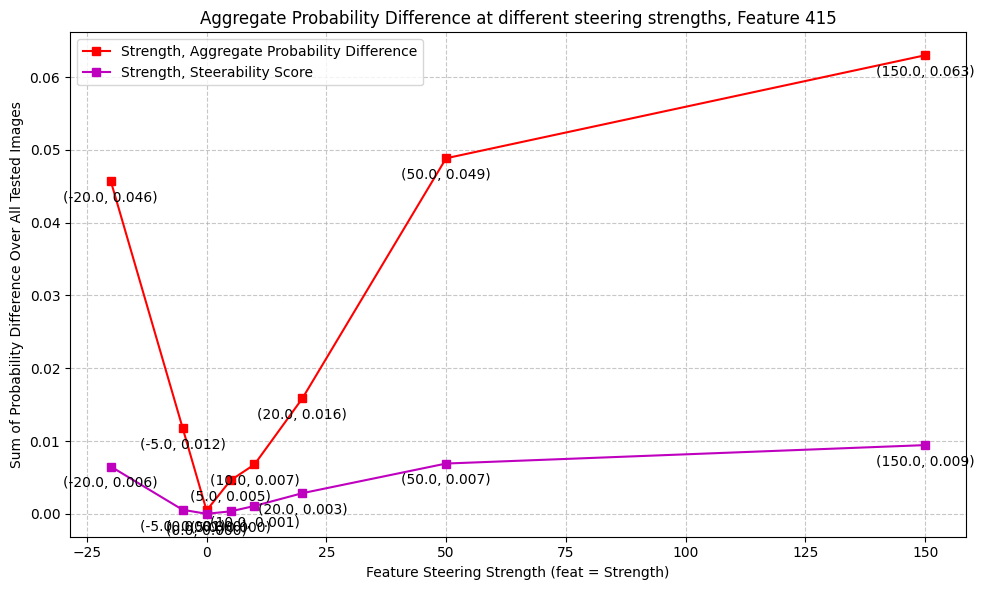

415
150.0 ['want' 'pants' 'understand' 'poster' 'hard' 'looks' 'users' 'includes'
 'si' 'points']
150.0 probs tensor([0.0541, 0.0207, 0.0207, 0.0150, 0.0120, 0.0118, 0.0113, 0.0111, 0.0101,
        0.0088], device='cuda:0')
torch.Size([5000])
probabilities * abs(probabilities) tensor([3.9690e-03, 3.6849e-04, 2.4145e-04, 2.0277e-04, 1.7436e-04, 1.7272e-04,
        1.1957e-04, 9.1461e-05, 9.0999e-05, 9.0439e-05])
['want' 'understand' 'pants' 'poster' 'includes' 'looks' 'hard'
 'indicated' 'users' 'points']


In [23]:
# Steerability metric
for feat_num in steering_strength_image_results[str(steering_strength)].keys():
    feat_num_steerability = feat_num
    agg_diff_arr = []
    steerability_arr = []
    i = 0
    for key in steering_strength_info:
        steerability_arr.append(steering_strength_info[key][4][feat_num_steerability].sum().cpu().item())
        agg_diff_arr.append(steering_strength_info[key][3][feat_num_steerability].cpu().item())

    import matplotlib.pyplot as plt
    import numpy as np

    # Sample data
    x = [tup[0] for tup in sorted(feat_num_concept_arr)]
    y1 = agg_diff_arr
    y2 = steerability_arr

    # Create the plot
    plt.figure(figsize=(10, 6))

    # Plot each line with different colors and markers
    plt.plot(np.array(x), y1, 'rs-', label='Strength, Aggregate Probability Difference')  # Red line with squares
    plt.plot(np.array(x), y2, 'ms-', label='Strength, Steerability Score')  # Red line with squares

    # Label each point
    for i in range(len(x)):
        # Labels for series
        plt.annotate(f'({x[i]:.1f}, {y1[i]:.3f})', 
                    (x[i], y1[i]), 
                    textcoords="offset points", 
                    xytext=(0,-15),
                    ha='center')
        plt.annotate(f'({x[i]:.1f}, {y2[i]:.3f})', 
                    (x[i], y2[i]), 
                    textcoords="offset points", 
                    xytext=(0,-15),
                    ha='center')

    # Customize the plot
    plt.xlabel('Feature Steering Strength (feat = Strength)')
    plt.ylabel('Sum of Probability Difference Over All Tested Images')
    plt.title(f'Aggregate Probability Difference at different steering strengths, Feature {feat_num_steerability}')
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.7)

    # Adjust layout to prevent label overlap
    plt.tight_layout()


    # plt.savefig("test.svg")

    # Show the plot
    plt.show()
    # image, tuple position, idx of top-k
    print(feat_num)
    print(dict_key, steering_strength_image_results[str(dict_key)][feat_num][image_idx][0])
    print(dict_key, "probs", steering_strength_image_results[str(dict_key)][feat_num][image_idx][1])
    print(steering_strength_info[150.0][4][feat_num_steerability].shape)
    vals, idxs = torch.topk(steering_strength_info[150.0][5][feat_num_steerability].cpu(), k=10)
    print("probabilities * abs(probabilities)", vals)
    print(np.array(selected_vocab)[idxs.cpu()])
    

feat: 326
asymptotic_steering_specificity: 0.14375966787338257
asymptotic_steering_power: 0.36433538794517517
asymptotic_steering_power percent: 36.43%
specificity/power: 0.39458057775879674
feat: 265
asymptotic_steering_specificity: 0.03034038469195366
asymptotic_steering_power: 0.1393524408340454
asymptotic_steering_power percent: 13.94%
specificity/power: 0.21772409948732777
feat: 229
asymptotic_steering_specificity: 0.36873191595077515
asymptotic_steering_power: 0.5823348760604858
asymptotic_steering_power percent: 58.23%
specificity/power: 0.6331956595923954
feat: 333
asymptotic_steering_specificity: 0.023588791489601135
asymptotic_steering_power: 0.10634896159172058
asymptotic_steering_power percent: 10.63%
specificity/power: 0.22180556477984037
feat: 546
asymptotic_steering_specificity: 0.6807074546813965
asymptotic_steering_power: 0.8233168125152588
asymptotic_steering_power percent: 82.33%
specificity/power: 0.8267867779862453
feat: 582
asymptotic_steering_specificity: 0.00910

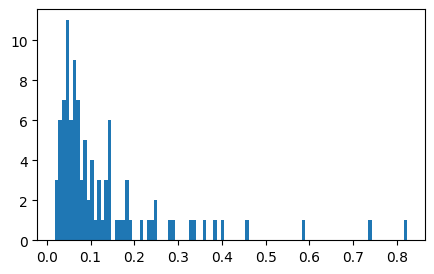

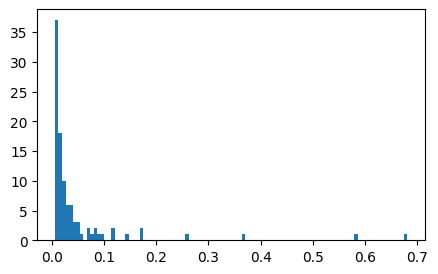

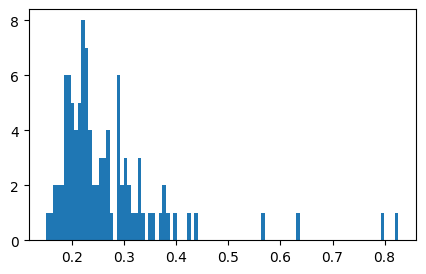

In [24]:
# SAE steering power and specificity metrics:

sae_asps = []
sae_asy_str_specs = []
sae_asrs = []
for feat_num in steering_strength_image_results[str(steering_strength)].keys():
    feat_num_steerability = feat_num
    
    asymptote_key = max([float(key) for key in steering_strength_info.keys()])
    asymptotic_steering_specificity = steering_strength_info[asymptote_key][4][feat_num_steerability].sum().cpu().item()
    asymptotic_steering_power = steering_strength_info[asymptote_key][3][feat_num_steerability].cpu().item()
    
    print(f"feat: {feat_num_steerability}")
    print(f"asymptotic_steering_specificity: {asymptotic_steering_specificity}")
    print(f"asymptotic_steering_power: {asymptotic_steering_power}")
    print(f"asymptotic_steering_power percent: {(asymptotic_steering_power * 100):.2f}%")
    print(f"specificity/power: {asymptotic_steering_specificity/asymptotic_steering_power}")
    
    sae_asps.append(asymptotic_steering_power)
    sae_asy_str_specs.append(asymptotic_steering_specificity)
    sae_asrs.append(asymptotic_steering_specificity/asymptotic_steering_power)


print(f"\nSAE: {selected_sae_weights}")
print(f"\nSAE avg power: {np.array(sae_asps).mean()}")
print(f"SAE avg specificity: {np.array(sae_asy_str_specs).mean()}")
print(f"SAE avg s/p ratio: {np.array(sae_asrs).mean()}")

plt.figure(figsize=(5, 3))
plt.hist(sae_asps, bins=100)
plt.show()

plt.figure(figsize=(5, 3))
plt.hist(sae_asy_str_specs, bins=100)
plt.show()

plt.figure(figsize=(5, 3))
plt.hist(sae_asrs, bins=100)
plt.show()

### Prev Code

In [ ]:
len(feature_steered_embeds[random_feat_idxs[0]])

In [ ]:
default_embeds.shape
len(default_embeds_list)
default_embeds = torch.cat(default_embeds_list)
default_embeds.shape

In [ ]:

len(altered_embeds_list), altered_embeds_list[0].shape, default_embeds.shape

In [ ]:
og_model.cuda()

In [ ]:
with open("/workspace/clip_dissect_raw.txt", "r") as f:
    larger_vocab = [line[:-1] for line in f.readlines()][:5000]

# with open("/workspace/better_img_desc.txt", "r") as f:
#     larger_vocab = [line[:-1] for line in f.readlines()][:5000]

In [ ]:
# use clip vocab here and compare embeds
import torch
from PIL import Image

tokenizer = open_clip.get_tokenizer('ViT-B-32')
text = tokenizer(larger_vocab)
text_features = og_model.encode_text(text.cuda())
text_features_normed = text_features/text_features.norm(dim=-1, keepdim=True)


print(f"text_features_normed.shape: {text_features_normed.shape}")
text_probs_altered_list = []
with torch.no_grad(), torch.cuda.amp.autocast():
    for key in feature_steered_embeds:
        print(key)
        # embeds already have L2 norm of 1
        text_probs_altered = (100.0 * torch.stack(feature_steered_embeds[key]) @ text_features_normed.T).softmax(dim=-1)
        text_probs_altered_list.append(text_probs_altered)
    text_probs_default = (100.0 * default_embeds @ text_features_normed.T).softmax(dim=-1)

print("Label probs altered:", text_probs_altered.shape)  # prints: [[1., 0., 0.]]
print("Label probs default:", text_probs_default.shape)  # prints: [[1., 0., 0.]]

### Summed Logit Difference

In [ ]:
# subtract from default, label, and print trends
text_probs_altered.shape

# selected_vocab = all_imagenet_class_names
selected_vocab = larger_vocab

top_concept_per_feat = {}
top_val_per_feat = {}
top_diff_per_feat = {}
top_ratio_per_feat = {}
# run this for sampled features over all of imagenet eval
for j, text_probs_altered in enumerate(text_probs_altered_list):
    print(f"{'============================================'*2}\n\nFor Feature {random_feat_idxs[j]}")
    print("actual image content:")
    default_vals_softmax, default_idxs_softmax = torch.topk(text_probs_default,k=10)
    print(default_vals_softmax, "\n", np.array(selected_vocab)[default_idxs_softmax.cpu()])
    
    
    logit_diff = text_probs_altered - text_probs_default
    logit_diff_aggregate = logit_diff.sum(dim=0)
    
    logit_ratio = text_probs_altered/text_probs_default
    logit_ratio_aggregate = logit_ratio.mean(dim=0)
    
    print(f"text_probs_altered.softmax(): {text_probs_altered.softmax(1).shape}")
    text_probs_altered_softmax = text_probs_altered.softmax(1)
    vals_softmax, idxs_softmax = torch.topk(text_probs_altered_softmax,k=10)
    
#     print(f"text_probs_altered.softmax(): {text_probs_altered.sum(0).softmax(0).shape}")
#     text_probs_altered_softmax_agg = text_probs_altered.sum(0).softmax(0)
#     vals_softmax_agg, idxs_softmax_agg = torch.topk(text_probs_altered_softmax_agg,k=10)
    
    print(f"\nSoftmax Over {text_probs_altered.shape[0]} Images:\n{vals_softmax}")
    print(np.array(selected_vocab)[idxs_softmax.cpu()])
    for i in range(vals_softmax.shape[0]):
        print(vals_softmax[i], "\n", np.array(selected_vocab)[idxs_softmax.cpu()][i])
        break
        
#     print(f"\nAgg Softmax Over {text_probs_altered.shape[0]} Images:\n{vals_softmax_agg}")
#     print(np.array(selected_vocab)[idxs_softmax_agg.cpu()])
    
    vals_agg, idxs_agg = torch.topk(logit_diff_aggregate,k=10)
    vals_least_agg, idxs_least_agg = torch.topk(logit_diff_aggregate,k=10,largest=False)
    
    ratios_agg, ratios_idxs_agg = torch.topk(logit_ratio_aggregate,k=10)
    ratios_least_agg, ratios_idxs_least_agg = torch.topk(logit_ratio_aggregate,k=10,largest=False)
    
    vals, idxs = torch.topk(logit_diff,k=5)
    vals_least, idxs_least = torch.topk(logit_diff,k=5,largest=False)
    
    ratios, ratios_idxs = torch.topk(logit_ratio,k=5)
    ratios_least, ratios_idxs_least = torch.topk(logit_ratio,k=5,largest=False)
    
    top_concept_per_feat[random_feat_idxs[j]] = np.array(selected_vocab)[idxs_softmax.cpu()][0][0]
    top_val_per_feat[random_feat_idxs[j]] = vals_softmax[0][0]
    top_diff_per_feat[random_feat_idxs[j]] = vals_agg[0]
    top_ratio_per_feat[random_feat_idxs[j]] = ratios_agg[0]
    
    
    print(f"\nMost Changed, by Absolute Diff Over {logit_diff.shape[0]} Images:\n{vals_agg}")
    print(np.array(selected_vocab)[idxs_agg.cpu()])
    print(vals_least_agg)
    print(np.array(selected_vocab)[idxs_least_agg.cpu()])
    
    print(f"\nMost Changed, by Ratio Over {logit_diff.shape[0]} Images:")
    print(ratios_agg)
    print(np.array(selected_vocab)[ratios_idxs_agg.cpu()])
    print(vals_least_agg)
    print(np.array(selected_vocab)[ratios_idxs_least_agg.cpu()])

In [ ]:
top_concept_per_feat,top_val_per_feat,top_ratio_per_feat

In [ ]:
steering_strength_info = {}
steering_strength_info[steering_strength] = (top_concept_per_feat,top_val_per_feat,top_ratio_per_feat,top_diff_per_feat)


In [ ]:
steering_strength_info[steering_strength][0].keys()

In [ ]:
steering_strength_info

In [ ]:
i = 0
for feat_num in steering_strength_info[steering_strength][0].keys():
    print(f"=====================\nfeat_num: {feat_num}")
    feat_num_concept_arr = []
    feat_num_prob_arr = []
    feat_num_ratio_arr = []
    for key in steering_strength_info:
        print(key, steering_strength_info[key][0][feat_num])
        feat_num_concept_arr.append((key, steering_strength_info[key][0][feat_num]))
        print(key, steering_strength_info[key][1][feat_num])
        feat_num_prob_arr.append((key, steering_strength_info[key][1][feat_num].item()))
        print(key, steering_strength_info[key][2][feat_num])
        feat_num_ratio_arr.append((key, steering_strength_info[key][2][feat_num].item()))
    i += 1
    if i > 5:
        break

In [ ]:
sorted(feat_num_concept_arr),sorted(feat_num_prob_arr),sorted(feat_num_ratio_arr),

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Sample data
x = [tup[0] for tup in sorted(feat_num_concept_arr)]
y1 = [tup[1] for tup in sorted(feat_num_concept_arr)]
y2 = [tup[1] for tup in sorted(feat_num_prob_arr)]
# y3 = [tup[1] for tup in sorted(feat_num_ratio_arr)]

# Create the plot
plt.figure(figsize=(10, 6))

# Plot each line with different colors and markers
# plt.plot(x, y1, 'bo-', label='Series 1')  # Blue line with circles
plt.plot(np.array(x), y2, 'rs-', label='Series 2')  # Red line with squares
# plt.plot(x, y3, 'gd-', label='Series 3')  # Green line with diamonds

# Label each point for all three series
for i in range(len(x)):
#     # Labels for series 1
#     plt.annotate(f'({x[i]}, {y1[i]})', 
#                 (x[i], y1[i]), 
#                 textcoords="offset points", 
#                 xytext=(0,10),
#                 ha='center')
    
    # Labels for series 2
    plt.annotate(f'({y2[i]:01f}, {y1[i]})', 
                (x[i], y2[i]), 
                textcoords="offset points", 
                xytext=(0,-15),
                ha='center')
    
#     # Labels for series 3
#     plt.annotate(f'({x[i]}, {y3[i]})', 
#                 (x[i], y3[i]), 
#                 textcoords="offset points", 
#                 xytext=(0,10),
#                 ha='center')

# Customize the plot
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.title(f'Most Likely Class by Feature Steering Strength, Feature {feat_num}\n Label at 0.0: {steering_strength_info[0.0][0][feat_num]}. Label at max steered val: {steering_strength_info[max(list(steering_strength_info.keys()))][0][feat_num]}.')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)

# Adjust layout to prevent label overlap
plt.tight_layout()

# Show the plot
plt.show()

## Enc/Dec Clustering/Exploration

In [ ]:
encoder_weights_for_math = sparse_autoencoder.W_enc
decoder_weights_for_math = sparse_autoencoder.W_dec

In [ ]:
dists_from_feat_0 = encoder_weights_for_math[0] - encoder_weights_for_math

In [ ]:
dists_from_feat_0_normalized = encoder_weights_for_math[0]/encoder_weights_for_math[0].norm(p=2) - encoder_weights_for_math/encoder_weights_for_math.norm(p=2,dim=0)

In [ ]:
dists_from_feat_0.norm(p=2, dim=0).shape

In [ ]:
# plt.hist(bins[:-1], bins)
plt.hist(dists_from_feat_0.norm(p=2, dim=0).cpu(), density=True, bins=1000, histtype='step')  # density=False would make counts
plt.title('Encoder Dist from feat 0')
plt.ylabel('L2 Distance')
plt.xlabel('Density (of ~50k feats)');


In [ ]:
torch.topk(dists_from_feat_0.norm(p=2, dim=0),k=10,largest=False)

In [ ]:
dec_dists_from_feat_0 = decoder_weights_for_math[0]/decoder_weights_for_math[0].norm(p=2) - decoder_weights_for_math/decoder_weights_for_math.norm(p=2)
dec_dists_from_feat_0.shape

In [ ]:
# plt.hist(bins[:-1], bins)
plt.hist(dec_dists_from_feat_0.T.norm(p=2, dim=0).cpu(), density=True, bins=1000, histtype='step')  # density=False would make counts
plt.title('Decoder Dist from feat 0')
plt.ylabel('L2 Distance')
plt.xlabel('Density (of ~50k feats)');


In [ ]:
torch.topk(dec_dists_from_feat_0.T.norm(p=2, dim=0),k=10,largest=False)

In [ ]:
dec_dists_from_feat_0.T.norm(p=2, dim=0).shape